<a href="https://colab.research.google.com/github/gabrielebilliciani/ResNet-Oxford-Pet/blob/main/CV_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Residual Networks for Fine-Grained Image Classification: A Comparative Study

**Group Name:** The Shining

**Students:** Tsegay Gebrelibanos, Gabriele Giudici, Gabriele Billi Ciani

**MSc. Artificial Intelligence and Data Engineering**\
**University of Pisa**\
**Course:** Multimedia Information Retrieval and Computer Vision

# Table of Contents

*   **1. Introduction**
*   **2. Dataset Analysis**
    *   2.1. The Oxford-IIIT Pet Dataset
    *   2.2. Exploratory Data Analysis
    *   2.3. Data Preprocessing and Augmentation
*   **3. ResNets**
    *   3.1. Residual Connections
    *   3.2. ResNet18 and ResNet34 Architectures
    *   3.3. Implementing ResNets in PyTorch
*   **4. Training Experiments**
    *   4.1. Training a ResNet18 from Scratch
    *   4.2. Transfer Learning: Fine-tuned ResNet18
        *   4.2.1. A Two-Stage Fine-Tuning Strategy
        *   4.2.2. Fine-tuning a Larger Model (ResNet34)
    *   4.3. Knowledge Distillation
        *   4.3.1. Knowledge Distillation Theory
        *   4.3.2. Distilling to a ResNet18 Trained from Scratch
        *   4.3.3. Combining Fine-tuning and Distillation
        *   4.3.4. Beyond Classic Distillation
    *   4.4. Models Interpretation and Visualisation
        *   4.4.1. Confusion Matrix Comparison
        *   4.4.2. Visualising Feature Space with t-SNE
        *   4.4.3. First Layer Filter Visualisation
        *   4.4.4. Intermediate Feature Map Visualisation
    *   4.5. Training Experiments Conclusions
*   **5. Model Compression Experiments**
    *   5.1. Model Quantisation
        *   5.1.1. Fundamentals of Neural Network Quantisation
        *   5.1.2. The Post-Training Quantisation (PTQ) Process
        *   5.1.3. Beyond Post-Training Quantisation
    *   5.2. Pruning
        *   5.2.1. Iterative Magnitude-based Unstructured Pruning
        *   5.2.2. Beyond Unstructured Pruning
    *   5.3. Quantisation vs. Pruning
*   **6. Conclusions**

# 1. Introduction

In the field of computer vision, the performance of deep neural networks has seen remarkable progress. During our course, we explored foundational architectures like LeNet, AlexNet, and VGG, observing a clear trend towards deeper models – a historical progression well-documented in surveys such as [Li et al., 2020](https://arxiv.org/abs/2004.02806). As models became deeper, their capacity to learn complex features increased. However, this pursuit of depth also introduced significant training challenges, most notably the vanishing gradient problem.

The introduction of [**Residual Networks (ResNets)**](https://arxiv.org/abs/1512.03385) marked a pivotal moment by providing an elegant solution. For this project, we have chosen to work with ResNets as a natural extension of our course material, allowing us to investigate the mechanisms that successfully enable the training of much deeper networks. The theory behind ResNet's core innovation – the residual connection – is discussed in more detail in **Section 3**.

The experiments in this notebook are conducted on the [**Oxford-IIIT Pet dataset**](https://www.robots.ox.ac.uk/~vgg/data/pets/). This dataset was selected because it provides a practical yet challenging task. Its nature as a fine-grained classification problem, which involves distinguishing between 37 similar pet breeds, requires models to learn subtle and detailed visual features. Furthermore, its moderate scale makes it an excellent testbed for evaluating the impact of different training strategies and optimisation techniques. A full analysis of the dataset is provided in **Section 2**.
The primary goal of this notebook is to systematically apply and evaluate a series of established techniques to enhance a ResNet model's performance and efficiency. We will begin by establishing a baseline and then proceed through a logical progression of methods:

*   **Transfer Learning:** Leveraging a model pre-trained on the large-scale ImageNet dataset.
*   **Knowledge Distillation:** Using a larger, more accurate 'teacher' model to guide the training of our smaller 'student' model.
*   **Deployment Optimisation:** Investigating practical methods like quantisation and pruning to prepare the model for a hypothetical deployment scenario.

This systematic approach mirrors real-world scenarios where practitioners must balance model performance with deployment constraints such as inference speed and memory requirements.

# 2. Dataset Analysis

### 2.1. The Oxford-IIIT Pet Dataset

The dataset used for all experiments in this project is the **Oxford-IIIT Pet Dataset**, as introduced by [Parkhi et al., 2012](https://www.robots.ox.ac.uk/~vgg/publications/2012/parkhi12a/). It is a collection of 7,349 images covering 37 distinct pet breeds, comprising 12 cat breeds and 25 dog breeds. The dataset is well-balanced, with approximately 200 images available for each class.

The dataset is specifically designed for the task of **fine-grained image classification**. This presents a significant challenge, as a model must learn to distinguish between breeds that may have only very subtle differences in appearance, while also accounting for large variations in pose, scale, and lighting within the same breed.

Each image is supplied with rich annotations, including a breed label, a bounding box for the head, and a pixel-level segmentation map. For the classification tasks in this report, only the breed labels are utilised. The dataset is publicly available and maintained by the Visual Geometry Group (VGG) at the University of Oxford at [this address](#vgg-pets-data).

A detailed breakdown of the breeds and the distribution of images across the standard training and test splits is provided in the table below, which has been adapted from the original publication.

| Cat Breed | Total | Dog Breed | Total |
| :--- | :--- | :--- | :--- |
| Abyssinian | 198 | American Bulldog | 200 |
| Bengal | 200 | American Pit Bull Terrier | 200 |
| Birman | 200 | Basset Hound | 200 |
| Bombay | 184 | Beagle | 200 |
| British Shorthair | 200 | Boxer | 199 |
| Egyptian Mau | 190 | Chihuahua | 200 |
| Maine Coon | 200 | English Cocker Spaniel | 196 |
| Persian | 200 | English Setter | 200 |
| Ragdoll | 200 | German Shorthaired | 200 |
| Russian Blue | 200 | Great Pyrenees | 200 |
| Siamese | 199 | Havanese | 200 |
| Sphynx | 200 | Japanese Chin | 200 |
| | | Keeshond | 199 |
| | | Leonberger | 200 |
| | | Miniature Pinscher | 200 |
| | | Newfoundland | 196 |
| | | Pomeranian | 200 |
| | | Pug | 200 |
| | | Saint Bernard | 200 |
| | | Samoyed | 200 |
| | | Scottish Terrier | 199 |
| | | Shiba Inu | 200 |
| | | Staffordshire Bull Terrier | 189 |
| | | Wheaten Terrier | 200 |
| | | Yorkshire Terrier | 200 |
| --- | --- | --- | --- |
| **Total Cat Breeds** | **12** | **Total Dog Breeds** | **25** |
| **Total Cat Images** | **2371** | **Total Dog Images** | **4978** |
| **Grand Total Images**  | | | **7349** |

[*Table 1: Data composition of the 37 breeds, adapted from [Parkhi et al., 2012](https://www.robots.ox.ac.uk/~vgg/publications/2012/parkhi12a/).*]

### 2.2. Exploratory Data Analysis

As indicated by the table in the previous section, the Oxford-IIIT Pet dataset is well-balanced across its 37 classes. In this section, we will perform a brief exploratory analysis to confirm the dataset's structure and visualise some of its contents.

For practicality and reproducibility, we load the dataset directly using the `torchvision.datasets` library (cf. [PyTorch Oxford-IIIT Pet dataset’s page](https://docs.pytorch.org/vision/main/generated/torchvision.datasets.OxfordIIITPet.html)). We download the data into a local `./data` directory.

First of all, let’s import some libraries that we will use throughout the notebook:

In [1]:
# Install missing packages with proper CUDA support
packages_to_check = {
    'gdown': 'gdown',
    'tqdm': 'tqdm',
    'seaborn': 'seaborn',
    'sklearn': 'scikit-learn',
    'pandas': 'pandas',
    'matplotlib': 'matplotlib',
    'numpy': 'numpy'
}

for package_name, pip_name in packages_to_check.items():
    try:
        if package_name == 'sklearn':
            from sklearn.metrics import confusion_matrix  # Test specific import
        elif package_name == 'matplotlib':
            import matplotlib.pyplot as plt  # Test specific import
        else:
            __import__(package_name)
        print(f"{package_name} already available")
    except ImportError:
        print(f"Installing {pip_name}...")
        !pip install -q {pip_name}

# Check PyTorch and install if missing with auto-detected CUDA support
try:
    import torch
    import torchvision
    print(f"PyTorch {torch.__version__} already installed")
    if torch.cuda.is_available():
        print(f"CUDA {torch.version.cuda} support available")
        print(f"GPU device: {torch.cuda.get_device_name(0)}")
except ImportError:
    print("PyTorch not found. Detecting system CUDA version...")

    # Detect CUDA version
    import subprocess
    cuda_version = None
    try:
        # Try nvidia-smi first
        result = subprocess.run(['nvidia-smi'], capture_output=True, text=True)
        if result.returncode == 0:
            for line in result.stdout.split('\n'):
                if 'CUDA Version:' in line:
                    cuda_version = line.split('CUDA Version:')[1].strip().split()[0]
                    break

        # Try nvcc as backup
        if not cuda_version:
            result = subprocess.run(['nvcc', '--version'], capture_output=True, text=True)
            if result.returncode == 0:
                for line in result.stdout.split('\n'):
                    if 'release' in line.lower():
                        # Extract version like "12.5" from "release 12.5, V12.5.82"
                        cuda_version = line.split('release')[1].split(',')[0].strip()
                        break
    except:
        pass

    # Determine PyTorch index URL based on CUDA version
    if cuda_version:
        major_minor = cuda_version.split('.')[:2]
        cuda_short = ''.join(major_minor)  # "12.5" -> "125", "12.4" -> "124"
        index_url = f"https://download.pytorch.org/whl/cu{cuda_short}"
        print(f"Installing PyTorch with CUDA {cuda_version} support...")
    else:
        index_url = "https://download.pytorch.org/whl/cpu"
        print("CUDA not detected, installing CPU-only PyTorch...")

    !pip install -q torch torchvision torchaudio --index-url {index_url}

# Verify all imports work
print("\nVerifying all imports...")
try:
    import torch
    import torch.nn as nn
    import torch.nn.functional as F
    import torch.optim as optim
    from torch.utils.data import DataLoader, Dataset, Subset
    from torch.quantization import fuse_modules, get_default_qconfig, get_default_qat_qconfig, prepare, prepare_qat, convert
    import torch.nn.utils.prune as prune
    import torchvision
    import torchvision.transforms as transforms
    import torchvision.models as models
    from torchvision.models.resnet import ResNet
    import matplotlib.pyplot as plt
    from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
    from sklearn.model_selection import train_test_split
    import numpy as np
    from tqdm.notebook import tqdm
    import datetime
    import copy
    import os
    import gdown
    import random
    import time
    import pandas as pd
    import seaborn as sns
    from sklearn.manifold import TSNE
    from torch.amp import autocast, GradScaler

    print("All imports successful!")

    # Show system info
    print(f"PyTorch version: {torch.__version__}")
    print(f"CUDA available: {torch.cuda.is_available()}")
    if torch.cuda.is_available():
        print(f"CUDA version: {torch.version.cuda}")
        print(f"GPU: {torch.cuda.get_device_name(0)}")

except ImportError as e:
    print(f" Import error: {e}")

gdown already available
tqdm already available
seaborn already available
sklearn already available
pandas already available
matplotlib already available
numpy already available
PyTorch 2.8.0+cu126 already installed
CUDA 12.6 support available
GPU device: Tesla T4

Verifying all imports...
All imports successful!
PyTorch version: 2.8.0+cu126
CUDA available: True
CUDA version: 12.6
GPU: Tesla T4


In [2]:
# Load the raw datasets
try:
    print("Downloading and loading the Oxford-IIIT Pet dataset...")
    raw_train_val_dataset = torchvision.datasets.OxfordIIITPet(root='./data', split='trainval', download=True)
    raw_test_dataset = torchvision.datasets.OxfordIIITPet(root='./data', split='test', download=True)
    print("Dataset downloaded and loaded successfully.")
except Exception as e:
    print(f"An error occurred during dataset download: {e}")
    print("Please check your internet connection or storage space.")

100%|██████████| 792M/792M [00:03<00:00, 201MB/s]
100%|██████████| 19.2M/19.2M [00:00<00:00, 99.6MB/s]


Dataset downloaded and loaded successfully.


First, let's verify that the number of images loaded by `torchvision` aligns with the figures reported in the original publication ([Parkhi et al., 2012](#parkhi2012)). This ensures we are working with the correct and complete dataset.

In [3]:
# Verify the dataset sizes
train_val_size = len(raw_train_val_dataset)
test_size = len(raw_test_dataset)
total_size = train_val_size + test_size

print(f"Verification of Dataset Size:")
print("-" * 30)
print(f"Images in Training & Validation set: {train_val_size}")
print(f"Images in Test set: {test_size}")
print(f"Total images in the dataset: {total_size}")

# The paper's table shows a total of 7349 images.
# The torchvision split uses the same convention.
if total_size == 7349:
    print("\n The dataset size matches the official numbers from the paper.")
else:
    print("\n Warning: The dataset size does not match the official numbers.")

Verification of Dataset Size:
------------------------------
Images in Training & Validation set: 3680
Images in Test set: 3669
Total images in the dataset: 7349

 The dataset size matches the official numbers from the paper.


With the dataset size confirmed, the next step is to visualise some sample images. This will help us gain a better appreciation for the fine-grained nature of the classification task, highlighting the subtle differences between some breeds and the significant variations (in pose, lighting, and background) within a single breed.

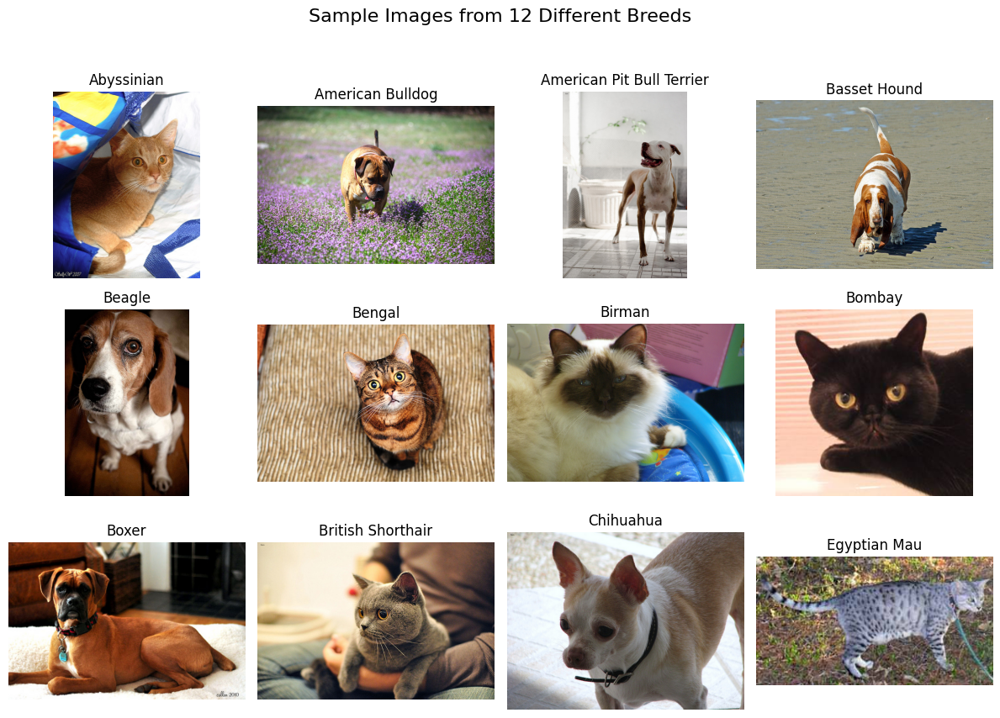

In [4]:
# --- Configuration for the visualization ---
num_breeds_to_show = 12  # Feel free to change this number
ncols = 4
nrows = int(np.ceil(num_breeds_to_show / ncols))

fig, axes = plt.subplots(nrows, ncols, figsize=(12, 3 * nrows))
axes = axes.flatten()  # Flatten the 2D array of axes for easy iteration

# Get the list of class names from the dataset
class_names = raw_train_val_dataset.classes
num_classes = len(class_names)

# Find one image for each of the first `num_breeds_to_show` classes
# This is more efficient than iterating through the whole dataset for each class
class_to_image = {}
for img, label in raw_train_val_dataset:
    if label not in class_to_image and len(class_to_image) < num_breeds_to_show:
        class_to_image[label] = img
    # Optimization: stop once we have found one image for each required class
    if len(class_to_image) == num_breeds_to_show:
        break

# Display the images
for i, (label, img) in enumerate(class_to_image.items()):
    ax = axes[i]
    ax.imshow(img)
    # Format title for better readability
    title = class_names[label].replace('_', ' ').title()
    ax.set_title(title)
    ax.axis('off')

# Hide any unused subplots
for i in range(num_breeds_to_show, len(axes)):
    axes[i].axis('off')

plt.suptitle(f'Sample Images from {num_breeds_to_show} Different Breeds', fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # Adjust layout to make room for suptitle
plt.show()

An important characteristic of a real-world dataset is the variability in image dimensions. While `torchvision`'s transforms will resize all images to a uniform size for batch processing, we now inspect the original dimensions. This helps in understanding the diversity of the source images and informs decisions about appropriate resizing strategies.

Let's analyse the distribution of image heights and widths across a sample of the training set.

Analysing original image dimensions...


  0%|          | 0/1000 [00:00<?, ?it/s]

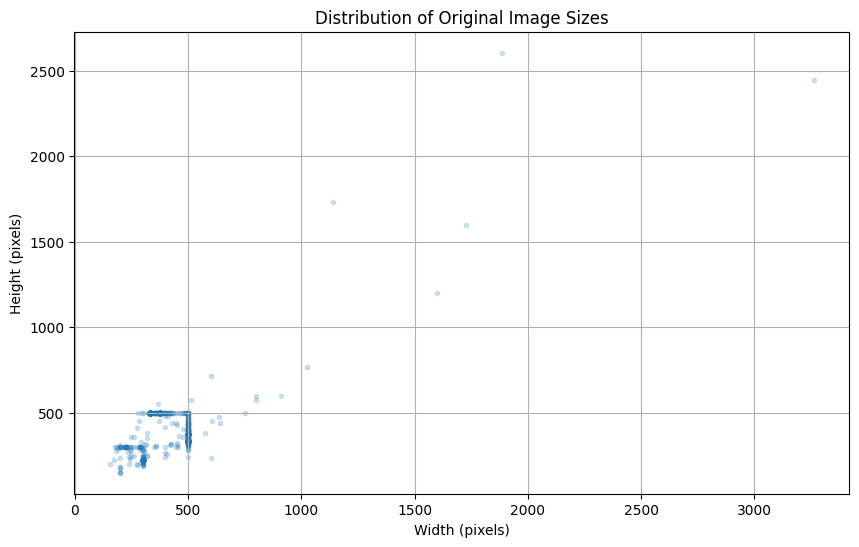


Image Dimension Statistics (from 1000 samples):
Min Height: 150px, Max Height: 2606px
Min Width: 154px, Max Width: 3264px


In [5]:
# Analyse image sizes from the raw dataset (before resizing)
heights = []
widths = []

# We'll sample 1000 images to get a good distribution without checking every single one
sample_indices = random.sample(range(len(raw_train_val_dataset)), 1000)

print("Analysing original image dimensions...")
for i in tqdm(sample_indices):
    img, _ = raw_train_val_dataset[i] # img is a PIL Image object
    widths.append(img.width)
    heights.append(img.height)

# Plot the distribution
plt.figure(figsize=(10, 6))
plt.scatter(widths, heights, alpha=0.2, marker='.')
plt.title('Distribution of Original Image Sizes')
plt.xlabel('Width (pixels)')
plt.ylabel('Height (pixels)')
plt.grid(True)
plt.show()

print(f"\nImage Dimension Statistics (from {len(sample_indices)} samples):")
print(f"Min Height: {min(heights)}px, Max Height: {max(heights)}px")
print(f"Min Width: {min(widths)}px, Max Width: {max(widths)}px")

It is clear that the data points are not randomly distributed but are heavily concentrated along specific horizontal and vertical lines. A vertical line indicates a common width value shared by images of many different heights (e.g. many images are exactly 500 pixels wide), while a horizontal line indicates a common height.

To quantify this, we can count the frequency of each unique dimension and visualise the most common ones using bar charts. This will tell us the exact pixel dimensions that appear most often in the dataset.

In [6]:
top_n = 10

# For widths
width_counts_df = pd.Series(widths).value_counts().reset_index().head(top_n)
width_counts_df.columns = ['Width (px)', 'Number of Images']

# For heights
height_counts_df = pd.Series(heights).value_counts().reset_index().head(top_n)
height_counts_df.columns = ['Height (px)', 'Number of Images']

# --- Print the formatted tables ---
print("--- Top 10 Most Common Image Widths ---")
print(width_counts_df.to_string(index=False))

print("\n--- Top 10 Most Common Image Heights ---")
print(height_counts_df.to_string(index=False))

--- Top 10 Most Common Image Widths ---
 Width (px)  Number of Images
        500               545
        300                78
        333                73
        375                72
        334                15
        332                12
        225                10
        200                10
        400                 7
        335                 5

--- Top 10 Most Common Image Heights ---
 Height (px)  Number of Images
         500               269
         375               196
         333               133
         225                50
         300                42
         334                32
         332                25
         335                15
         330                 6
         224                 5


Let's also examine aspect ratios:

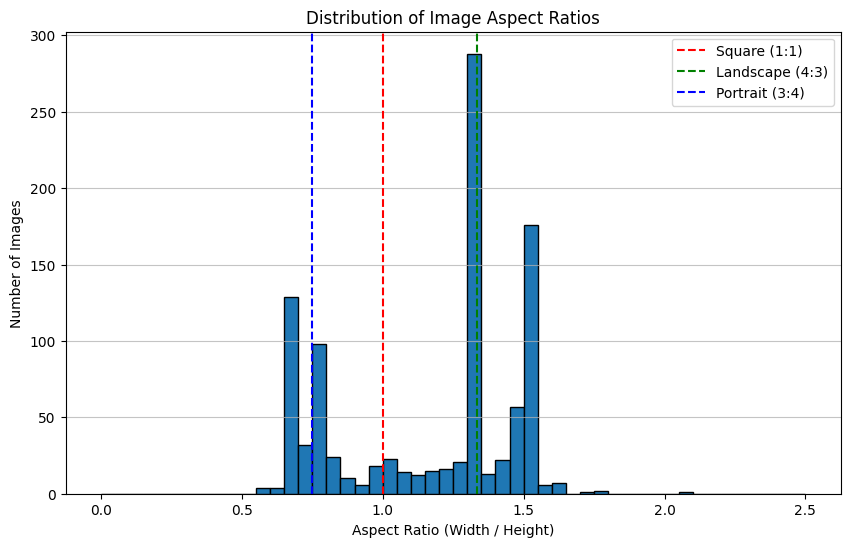

Mean Aspect Ratio: 1.17
Median Aspect Ratio: 1.33


In [7]:
aspect_ratios = np.array(widths) / np.array(heights)

# Plotting the histogram of aspect ratios
plt.figure(figsize=(10, 6))
plt.hist(aspect_ratios, bins=50, range=(0, 2.5), edgecolor='black')
plt.title('Distribution of Image Aspect Ratios')
plt.xlabel('Aspect Ratio (Width / Height)')
plt.ylabel('Number of Images')

# Add vertical lines for common aspect ratios for context
plt.axvline(1.0, color='r', linestyle='--', label='Square (1:1)')
plt.axvline(4/3, color='g', linestyle='--', label='Landscape (4:3)')
plt.axvline(3/4, color='b', linestyle='--', label='Portrait (3:4)')

plt.legend()
plt.grid(axis='y', alpha=0.75)
plt.show()

print(f"Mean Aspect Ratio: {np.mean(aspect_ratios):.2f}")
print(f"Median Aspect Ratio: {np.median(aspect_ratios):.2f}")

These analyses confirm that the images come in various sizes and aspect ratios, which is typical for data scraped from the web. This variability will have to be handled, for instance by the `Resize` and `RandomResizedCrop` transforms, in our data processing pipeline.

Next, we will visually inspect the **intra-class variability**. A key challenge in fine-grained classification is that images within the same class can look very different due to factors like animal pose, lighting, background, and age. The code below displays four different examples for a few selected breeds to illustrate this point.

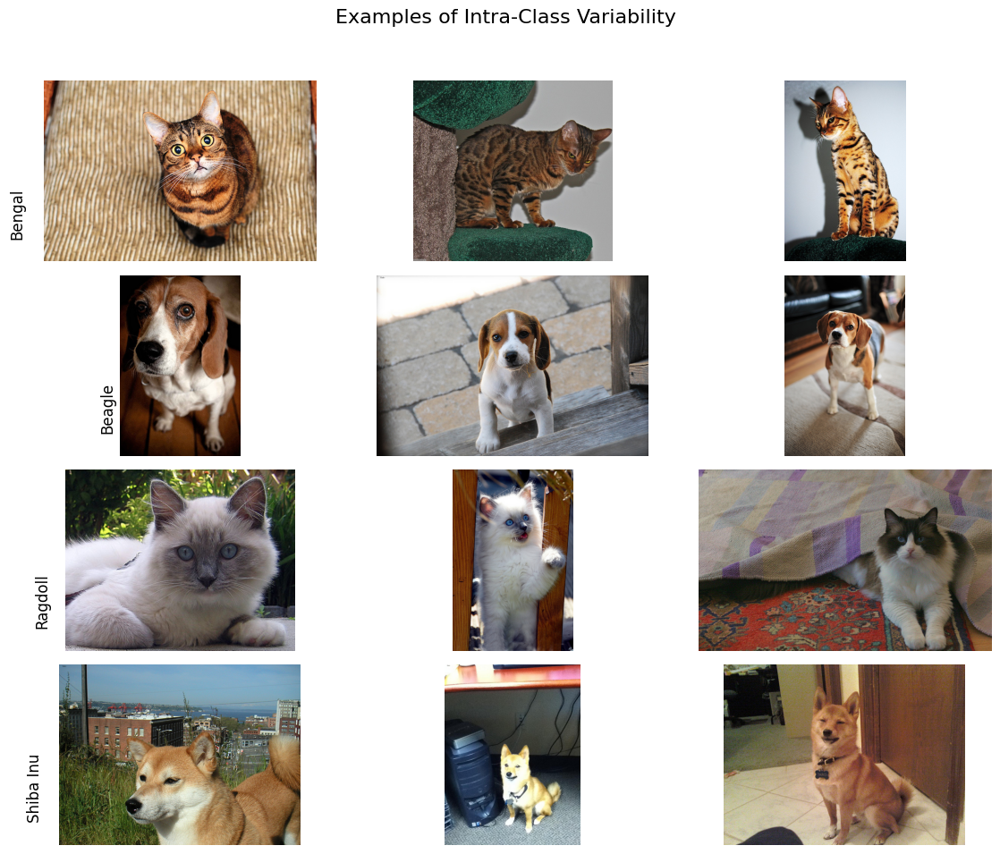

In [8]:
breeds_to_show = ['Bengal', 'Beagle', 'Ragdoll', 'Shiba Inu']
samples_per_breed = 3

# Collect samples for the specified breeds
breed_images = {breed: [] for breed in breeds_to_show}
class_to_idx = raw_train_val_dataset.class_to_idx

for img, label in raw_train_val_dataset:
    # Reverse lookup to get the class name from the label index
    breed_name = raw_train_val_dataset.classes[label]
    if breed_name in breeds_to_show and len(breed_images[breed_name]) < samples_per_breed:
        breed_images[breed_name].append(img)

# Plotting
fig, axes = plt.subplots(len(breeds_to_show), samples_per_breed, figsize=(12, 10))
fig.suptitle('Examples of Intra-Class Variability', fontsize=16)

for i, breed_name in enumerate(breeds_to_show):
    for j, img in enumerate(breed_images[breed_name]):
        ax = axes[i, j]
        ax.imshow(img)
        ax.axis('off')
        if j == 0:
            # Set the breed name as the row title
            ax.set_title(breed_name.replace('_', ' '), rotation=90, x=-0.1, y=0.1, size='large')

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

As the images demonstrate, there is significant variation within each breed (the dataset's official website and paper show other good examples, for many breeds, of the great variability of the data). This, combined with the subtle differences *between* breeds, makes the classification task non-trivial.

Finally, it is worth noting the overall size of the dataset. With a total of **7,349** images – split into **3,680** for training and validation, and **3,669** for testing – it is considered a moderately-sized dataset. While sufficient for fine-tuning pre-trained models, this limited number of examples poses a significant challenge for training a deep neural network, such as ResNet, **from scratch**. Deep models are notoriously data-hungry, and without a massive dataset, they are prone to overfitting. This challenge directly motivates our subsequent experiments, where we will compare training from scratch against more data-efficient methods like **transfer learning** (see **Section 4.2**) and **knowledge distillation** (see **Section 4.3**).

### 2.3. Data Preprocessing and Augmentation

As previously mentioned, data preprocessing and augmentation are going to be needed in order to train the networks.

Data preprocessing and augmentation strategies vary throughout this project depending on the specific experimental requirements. Thus, rather than presenting all variations upfront, we detail the preprocessing pipeline at each experimental stage where it's most relevant.

We define here a helper function which we are going to use to introduce the pipelines later on.

In [9]:
class UnNormalize(object):
    """Reverses the normalization on a tensor image for visualization."""
    def __init__(self, mean, std):
        self.mean = mean
        self.std = std

    def __call__(self, tensor):
        """
        Args:
            tensor (Tensor): Tensor image of size (C, H, W) to be unnormalized.
        Returns:
            Tensor: Unnormalized image.
        """
        # Create a copy to avoid modifying the original tensor
        tensor = tensor.clone()
        for t, m, s in zip(tensor, self.mean, self.std):
            t.mul_(s).add_(m)
        return tensor

def visualize_transforms(dataset, transform, title):
    """
    Applies a given transformation pipeline to a few sample images and displays
    the original versus the augmented versions.
    """
    # Try to find normalization parameters
    normalize_transform = None
    mean, std = None, None

    # First, try to find Normalize in the direct pipeline
    for t in transform.transforms:
        if isinstance(t, transforms.Normalize):
            normalize_transform = t
            mean, std = t.mean, t.std
            break

    # If not found, check if there's a nested transform (like weights.transforms())
    if normalize_transform is None:
        for t in transform.transforms:
            if hasattr(t, 'transforms'):  # It's a nested Compose
                for nested_t in t.transforms:
                    if isinstance(nested_t, transforms.Normalize):
                        normalize_transform = nested_t
                        mean, std = nested_t.mean, nested_t.std
                        break
                if normalize_transform:
                    break

    # If still not found, use ImageNet defaults (common for pretrained models)
    if normalize_transform is None:
        print(f"Warning: Normalize transform not found. Using ImageNet defaults.")
        mean = [0.485, 0.456, 0.406]
        std = [0.229, 0.224, 0.225]

    un_normalizer = UnNormalize(mean=mean, std=std)

    # Get a few random images from the raw dataset
    num_images_to_show = 4
    indices = np.random.choice(len(dataset), num_images_to_show, replace=False)

    fig, axes = plt.subplots(num_images_to_show, 5, figsize=(15, 2.5 * num_images_to_show))
    fig.suptitle(title, fontsize=16)

    for i, idx in enumerate(indices):
        original_image, _ = dataset[idx]

        # Display the original image
        ax = axes[i, 0]
        ax.imshow(original_image)
        ax.set_title("Original")
        ax.axis('off')

        # Display 4 augmented versions
        for j in range(1, 5):
            ax = axes[i, j]
            augmented_tensor = transform(original_image)
            unnormalized_tensor = un_normalizer(augmented_tensor.clone())

            # Clamp values to [0, 1] range for display
            unnormalized_tensor = torch.clamp(unnormalized_tensor, 0, 1)

            augmented_image_display = unnormalized_tensor.permute(1, 2, 0)
            ax.imshow(augmented_image_display)
            ax.set_title(f"Augmented {j}")
            ax.axis('off')

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

# Global Utilities

Let’s also define a couple global utilities that we will use throughout the notebook:

In [10]:
def evaluate_model(model, data_loader, criterion, device, desc="Evaluating"):
    """A standardized evaluation function to be used across all experiments."""
    model.eval()
    running_loss, correct, total = 0.0, 0, 0
    all_preds, all_labels = [], []

    with torch.no_grad():
        pbar = tqdm(data_loader, desc=desc)
        for inputs, labels in pbar:
            inputs, labels = inputs.to(device, non_blocking=True), labels.to(device, non_blocking=True)
            with torch.amp.autocast(device_type=device.type, dtype=torch.float16, enabled=torch.cuda.is_available()):
                outputs = model(inputs)
                loss = criterion(outputs, labels)

            running_loss += loss.item() * inputs.size(0)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

            all_preds.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

            pbar.set_postfix({
                'Loss': f'{running_loss/total:.4f}',
                'Acc': f'{100.*correct/total:.2f}%'
            })

    final_loss = running_loss / len(data_loader.dataset)
    final_acc = 100. * correct / total
    return final_loss, final_acc, all_preds, all_labels

def print_model_size(model, label):
    """Saves a model to a temporary file to measure its size on disk."""
    temp_path = f"temp_{label}.pth"
    torch.save(model.state_dict(), temp_path)
    size_mb = os.path.getsize(temp_path) / (1024 * 1024)
    print(f"Size of {label} model: {size_mb:.2f} MB")
    os.remove(temp_path)
    return size_mb

Let’s also define a set of control flags and helper functions for skipping training sections and loading pre-trained results. This allows for faster experimentation by reusing models that have already been trained offline.

In [ ]:
# Skip Flags for training sections:
# Set to True to skip a training section and download pre-trained results.
# Set to False to run the full training loop.
SKIP_SCRATCH_TRAINING = True # long to train, especially on Colab
SKIP_FINETUNE_R18_TRAINING = False # reasonably fast to train (~23 secs/epoch in Colab)
SKIP_FINETUNE_R34_TRAINING = True # same as R18 (reccomended to leave True for reproducibility)
SKIP_KD_SCRATCH_TRAINING = True # long to train, especially on Colab
SKIP_KD_FINETUNE_TRAINING = True # similar to R18, but with KD

# We define some reusable functions to download a file from Google Drive and to load a training history from a CSV file
def download_from_gdrive(file_id, output_path, file_label):
    """Downloads a file from Google Drive if it doesn't already exist."""
    if not os.path.exists(output_path):
        print(f"Downloading {file_label} to '{output_path}'...")
        gdown.download(id=file_id, output=output_path, quiet=False)
        print(f"{file_label} download complete.")
    else:
        print(f"{file_label} file '{output_path}' already exists. Skipping download.")

def load_training_history_from_csv(log_path):
    """Loads a training history log from a CSV file into a dictionary of lists."""
    try:
        log_df = pd.read_csv(log_path)
        # Ensure all expected columns are present, fill with empty lists if not
        history = {
            'train_loss': log_df.get('train_loss', pd.Series([])).tolist(),
            'train_accuracy': log_df.get('train_accuracy', pd.Series([])).tolist(),
            'val_loss': log_df.get('val_loss', pd.Series([])).tolist(),
            'val_accuracy': log_df.get('val_accuracy', pd.Series([])).tolist(),
            'learning_rate': log_df.get('learning_rate', pd.Series([])).tolist()
        }
        if history['train_loss']:
             print(f"Successfully loaded training history for {len(history['train_loss'])} epochs from '{log_path}'.")
        else:
             print(f"Warning: Could not load complete history from '{log_path}'. Check file content.")
        return history
    except FileNotFoundError:
        print(f"Error: The log file '{log_path}' was not found.")
        # Return empty history to avoid crashing subsequent code
        return {key: [] for key in ['train_loss', 'train_accuracy', 'val_loss', 'val_accuracy', 'learning_rate']}

To ensure that our experimental results are consistent and can be reliably reproduced, we now set a global random seed.

The `set_seed` function:
* Sets the seed for Python's built-in `random` module and NumPy, in order to have some deterministic behavior.
* For PyTorch (and also GPU operations), we do not enforce a fully deterministic strategy, because we want to keep a good balance between execution reproducibility and performance.

We then call this function immediately to apply these settings for the remainder of the notebook.

In [ ]:
# We ensure reproducibility in our experiments
def set_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    print(f"Random seed set to {seed}")

# Set the seed for the entire notebook
SEED = 42
set_seed(SEED)

Random seed set to 42


# 3. ResNets

## 3.1. Residual Connections

As deep learning models evolved, a clear trend emerged: increasing network depth generally led to better performance. However, this pursuit of depth hit a wall. Beyond a certain point, simply stacking more layers led to a phenomenon known as the **degradation problem**. Counter-intuitively, deeper models would perform worse than their shallower counterparts, not due to overfitting, but because they became significantly harder to train. The original ResNet paper, "Deep Residual Learning for Image Recognition" by [He et al., 2015](https://arxiv.org/abs/1512.03385), observed this directly:

> "When deeper networks are able to start converging, a degradation problem has been exposed: with the network depth increasing, accuracy gets saturated [...] and then degrades rapidly."

This degradation suggested that standard optimisers struggled to learn an **identity mapping** (i.e. making a new layer simply pass its input through unchanged), which would be the optimal behaviour if an extra layer was not needed.

The core innovation of Residual Networks (ResNets) was to reframe what the layers learn. Instead of learning a direct mapping from an input `x` to a desired output `H(x)`, the network's layers are tasked with learning a **residual function**, `F(x)`. The final output is then computed as the sum of this residual and the original input:

$$ H(x) = F(x) + x $$

This is implemented via a "shortcut" or "skip connection" that bypasses one or more layers and adds the original input `x` to the output of the stacked layers, `F(x)`.

<br>
<div align="center">
<img src="https://miro.medium.com/1*D0F3UitQ2l5Q0Ak-tjEdJg.png" width="500"/>
</div>
<p align="center">
  <em>Figure 1: A standard residual block. The input <code>x</code> is passed through weighted layers to compute <code>F(x)</code> and is also added directly to the output via an identity shortcut connection. (Adapted from [He et al., 2015]).</em>
</p>
<br>

This seemingly simple change has two profound effects:

1.  **Easier Optimisation:** If an identity mapping is optimal, the network can easily achieve it by driving the weights of the stacked layers towards zero, making `F(x)` approach zero. This is much easier for an optimiser than learning the precise weights required for an identity transformation through multiple non-linear layers.
2.  **Combating Vanishing Gradients:** The shortcut connection creates a direct path for the gradient to flow back through the network during backpropagation. This ensures that even the earliest layers in a very deep network receive a strong training signal, mitigating the vanishing gradient problem that plagued earlier deep architectures.

However, this simple addition `F(x) + x` is only possible if the input `x` and the output `F(x)` have the exact same dimensions. This is often not the case, as convolutional networks typically increase channel depth as they go deeper and decrease spatial dimensions (height and width) using strided convolutions or pooling.

To solve this, the skip connection itself must be adapted. When dimensions mismatch, a **1x1 convolution** is applied to the input `x` along the shortcut path. This serves to transform `x` so that its shape matches `F(x)` perfectly, allowing the addition to occur.

## 3.2. ResNet18 and ResNet34 Architectures

The ResNet framework is highly modular, allowing for the creation of architectures with varying depths by simply stacking more residual blocks. While many official variants exist, including deeper counterparts like **ResNet50, ResNet101, and ResNet152**, for this project we focus on two of the most popular and efficient versions: ResNet18 and ResNet34. Both are built from the same "Basic Block" module but differ in the total number of blocks stacked, resulting in their different network depths.

| Layer Name | Spatial Size | ResNet18 Structure | ResNet34 Structure | Output Shape |
| :--- | :--- | :--- | :--- |:--- |
| **conv1** | 112×112 | 7×7 Conv, 64, stride 2 | 7×7 Conv, 64, stride 2 | `112×112×64` |
| **conv2_x** | 56×56 | `[3×3, 64; 3×3, 64] × 2` | `[3×3, 64; 3×3, 64] × 3` | `56×56×64` |
| **conv3_x** | 28×28 | `[3×3, 128; 3×3, 128] × 2` | `[3×3, 128; 3×3, 128] × 4`| `28×28×128` |
| **conv4_x** | 14×14 | `[3×3, 256; 3×3, 256] × 2`| `[3×3, 256; 3×3, 256] × 6`| `14×14×256` |
| **conv5_x** | 7×7 | `[3×3, 512; 3×3, 512] × 2` | `[3×3, 512; 3×3, 512] × 3` | `7×7×512` |
| **Classifier**| - | AvgPool + FC Layer | AvgPool + FC Layer | - |
| **Total Layers** | | **18** | **34** | - |

*Table 2: A comparison of the ResNet18 and ResNet34 architectures. ResNet34 is deeper as it stacks more basic blocks in each stage. (Adapted from [He et al., 2015](https://arxiv.org/abs/1512.03385).)*

The architectural details in the table assume a standard input image size of **`224×224×3`** (Height × Width × Channels). This resolution is a well-established convention, popularised by its use in the [**ImageNet Large Scale Visual Recognition Challenge (ILSVRC)**](https://www.image-net.org/challenges/LSVRC/), for which many foundational models like ResNet were originally designed. The first layer (`conv1`), with its stride of 2, is responsible for the initial downsampling of this input, transforming the `224×224` spatial dimensions into the `112×112` dimensions seen in the first row of the table.

The table above outlines the network structure stage by stage.

*   **Stages**: `conv1` is the initial, standard convolutional layer. `conv2_x` through `conv5_x` are the main stages of the network, each composed of repeating residual blocks.

*   **Block Structure**: The notation, for example `[3×3, 128; 3×3, 128] × 2` for `conv3_x` in ResNet18, means this stage stacks **2** "Basic Blocks". Each Basic Block itself contains **two** 3x3 convolutional layers.

*   **Channel Depth**: The numbers (64, 128, 256, 512) represent the number of output channels (or filters) for the convolutions in each stage. A common design pattern in CNNs is to double the number of channels while halving the spatial dimensions. This trade-off helps maintain the network's representational capacity while keeping the computational cost manageable.

*   **Downsampling**: The reduction in spatial dimensions (e.g. from 56×56 to 28×28 between `conv2_x` and `conv3_x`) is achieved by setting the stride to 2 in the *first* convolutional layer of the *first* block of that stage. It is precisely at these points that the input `x` and output `F(x)` dimensions will not match, necessitating the use of the 1x1 convolutional projection in the shortcut connection.

*   **Internal Operations**: As specified in the original paper, each convolutional layer is immediately followed by **Batch Normalisation** and then a **ReLU** activation function. The skip connection adds the block's input to the output of the second Batch Normalisation layer, and this sum is then passed through a final ReLU.

*   **Layer Counting**: The "Total Layers" count includes all convolutional layers and the final fully connected (FC) layer. For **ResNet18**, the count of 18 is derived as follows:
    *   **1** (`conv1`) + (2×2 layers in `conv2_x`) + (2×2 in `conv3_x`) + (2×2 in `conv4_x`) + (2×2 in `conv5_x`) + **1** (FC Layer) = **18**.
    *   Similarly, the 34 layers of **ResNet34** result from its deeper stages (e.g. `conv2_x` has 3 blocks, `conv4_x` has 6, and so on).

*   **Classifier Head**: The `AvgPool` is a **Global Average Pooling** layer. Unlike a traditional `Flatten` layer that unrolls every single value into a long vector (leading to a massive number of parameters in the subsequent FC layer), Global Average Pooling collapses the spatial dimensions of each feature map into a single value by taking its average. For instance, it transforms the final 7x7x512 feature map into a 1x1x512 feature vector. This vector is then fed into the final `FC Layer` for classification. This technique is highly effective at reducing parameters, which helps prevent overfitting and makes the network more robust to variations in input image size.

<br>
<div align="center">
<img src="https://www.researchgate.net/publication/349061100/figure/fig4/AS:1007639773315073@1617251451847/The-structure-of-a-residual-block-BN-represents-the-batch-normalization-Conv.png" width="500"/>
</div>
<p align="center">
  <em>Figure 2: A detailed diagram of a standard residual block, showing Batch Normalisation (BN) and ReLU activations. (Image Source: Du et al., <a href="https://www.researchgate.net/publication/349061100_AFC-YOLO_An_Anchor-Free_Corner-Based_YOLO_for_Object_Detection">"AFC-YOLO: An Anchor-Free Corner-Based YOLO for Object Detection,"</a> 2021.)</em>
</p>
<br>

<br>
<div align="center">
<img src="https://www.researchgate.net/publication/336642248/figure/fig1/AS:815238202585090@1571372658593/Original-ResNet-18-Architecture.png" width="700"/>
</div>
<p align="center">
  <em>Figure 3: A simplified, high-level view of the complete ResNet-18 architecture. (Image Source: Tariq et al., <a href="https://www.researchgate.net/publication/336642248_Diabetic_Retinopathy_Detection_through_a_Custom-Made_CNN">"Diabetic Retinopathy Detection through a Custom-Made CNN,"</a> 2019.)</em>
</p>
<br>

It is worth noting that a follow-up paper by the same authors, [*"Identity Mappings in Deep Residual Networks"*](https://arxiv.org/abs/1603.05027), introduced an improved "pre-activation" block. This design moves the Batch Normalisation and ReLU functions to *before* the convolutional layers, creating a cleaner identity path for the shortcut connection that further eases optimisation. While the pre-activation architecture (ResNetV2) demonstrates superior performance, the original "post-activation" design remains the most widespread standard and is the version used in this project.

## 3.3. Implementing ResNets in PyTorch

Throughout the notebook, we have utilised the `torchvision.models` library to load pre-defined ResNet architectures. However, we first want to present an implementation of ResNet18 “by hand”.

First, we define the `BasicBlock`, the core repeating unit of ResNet18. It contains two convolutional layers and the crucial logic for the shortcut connection, which `torchvision` names `downsample`.

In [13]:
class BasicBlock(nn.Module):
   """
   Basic residual block for ResNet18/34.

   This block consists of two 3x3 convolutions with batch normalization
   and ReLU activation, plus a skip connection that adds the input to the output.

   Args:
       in_channels (int): Number of input channels
       out_channels (int): Number of output channels
       stride (int): Stride for the first convolution (default: 1)
       downsample (nn.Module, optional): Downsampling layer for skip connection
   """

   def __init__(self, in_channels, out_channels, stride=1, downsample=None):
       super(BasicBlock, self).__init__()

       # First convolution: may downsample spatially via stride
       # (in resnet18, stride=2 first block of layers 2,3,4))
       self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size=3,
                             stride=stride, padding=1, bias=False)
       self.bn1 = nn.BatchNorm2d(out_channels)

       # Second convolution: always stride=1, maintains spatial dimensions
       self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size=3,
                             stride=1, padding=1, bias=False)
       self.bn2 = nn.BatchNorm2d(out_channels)

       # ReLU activation (shared between layers)
       self.relu = nn.ReLU(inplace=True)

       # Skip connection transformation (if input/output dimensions don't match)
       self.downsample = downsample

   def forward(self, x):
       # Store input for skip connection
       identity = x

       # Main path: conv -> bn -> relu -> conv -> bn
       out = self.conv1(x)
       out = self.bn1(out)
       out = self.relu(out)

       out = self.conv2(out)
       out = self.bn2(out)

       # Skip connection: transform identity if needed to match dimensions
       if self.downsample is not None:
           identity = self.downsample(x)

       # Element-wise addition of main path and skip connection
       out += identity
       out = self.relu(out)  # Final ReLU after residual addition

       return out

With the `BasicBlock` defined, we can now assemble the complete network. The main `ResNet` class constructs the initial stem layers (7×7 convolution and max pooling) and then stacks the residual blocks according to a given configuration list. Each number in the configuration specifies how many blocks to use in that layer – for example, `[2, 2, 2, 2]` creates ResNet18 with 2 blocks in each of the 4 layers, whilst `[3, 4, 6, 3]` would create ResNet34. The class handles the progressive downsampling between layers (via stride=2 in the first block of layers 2, 3, and 4) and the corresponding skip connection transformations automatically.

In [14]:
class ResNet(nn.Module):
   """
   ResNet architecture implementation for ResNet18/34.

   Args:
       block (nn.Module): Block type to use (BasicBlock)
       layers (list): Number of blocks in each of the 4 stages
       num_classes (int): Number of output classes (default: 1000 for ImageNet)
   """

   def __init__(self, block, layers, num_classes=1000):
       super(ResNet, self).__init__()

       # Track input channels for layer construction
       self.in_channels = 64

       # Stem: Initial feature extraction layers
       # 7x7 conv reduces 224x224 -> 112x112, increases channels 3 -> 64
       self.conv1 = nn.Conv2d(3, 64, kernel_size=7, stride=2, padding=3, bias=False)
       self.bn1 = nn.BatchNorm2d(64)
       self.relu = nn.ReLU(inplace=True)
       # MaxPool reduces 112x112 -> 56x56
       self.maxpool = nn.MaxPool2d(kernel_size=3, stride=2, padding=1)

       # Four main stages of residual blocks
       # stride regulates stride in the first block of each layer
       # the second block in each layer has stride=1

       # Stage 1: 56x56, 64 channels
       self.layer1 = self._make_layer(block, 64, layers[0], stride=1)
       # Stage 2: 28x28, 128 channels (downsample via stride=2)
       self.layer2 = self._make_layer(block, 128, layers[1], stride=2)
       # Stage 3: 14x14, 256 channels (downsample via stride=2)
       self.layer3 = self._make_layer(block, 256, layers[2], stride=2)
       # Stage 4: 7x7, 512 channels (downsample via stride=2)
       self.layer4 = self._make_layer(block, 512, layers[3], stride=2)

       # Classification head
       self.avgpool = nn.AdaptiveAvgPool2d((1, 1))  # Global average pooling: 7x7 -> 1x1
       self.fc = nn.Linear(512, num_classes)

   def _make_layer(self, block, out_channels, num_blocks, stride=1):
       """
       Create a layer consisting of multiple residual blocks.

       Args:
           block (nn.Module): Block type (BasicBlock)
           out_channels (int): Output channels for this layer
           num_blocks (int): Number of blocks in this layer
           stride (int): Stride for first block (for downsampling)
       """
       downsample = None

       # Create downsampling layer if dimensions change between input and output
       # (e.g. first block of layers 2, 3, and 4)
       if stride != 1 or self.in_channels != out_channels:
           downsample = nn.Sequential(
               nn.Conv2d(self.in_channels, out_channels,
                        kernel_size=1, stride=stride, bias=False),
               nn.BatchNorm2d(out_channels),
           )

       # First block may downsample
       # create a list containing the first block of the current layer
       layers = [block(self.in_channels, out_channels, stride, downsample)]

       # Update in_channels for subsequent blocks
       self.in_channels = out_channels

       # Remaining blocks maintain dimensions
       # add the specified number of blocks to the list
       for _ in range(1, num_blocks):
           layers.append(block(self.in_channels, out_channels))

       # unpacks the list into a Sequential module
       return nn.Sequential(*layers)

   def forward(self, x):
       """
       Forward pass through ResNet.

       Input shape: (batch_size, 3, 224, 224)
       Output shape: (batch_size, num_classes)
       """
       # Stem: 224x224x3 -> 56x56x64
       x = self.conv1(x)
       x = self.bn1(x)
       x = self.relu(x)
       x = self.maxpool(x)

       # Four stages of residual blocks
       x = self.layer1(x)  # 56x56x64
       x = self.layer2(x)  # 28x28x128
       x = self.layer3(x)  # 14x14x256
       x = self.layer4(x)  # 7x7x512

       # Classification head: 7x7x512 -> 1x1x512 -> num_classes
       x = self.avgpool(x)
       x = torch.flatten(x, 1)  # Flatten spatial dimensions, keep batch dimension
       x = self.fc(x)

       return x


def resnet18(num_classes=1000):
   """
   ResNet18 model factory function.

   ResNet18 has [2, 2, 2, 2] blocks in its four stages.
   Total: 1 (stem) + 2*2 + 2*2 + 2*2 + 2*2 + 1 (fc) = 18 layers

   Args:
       num_classes (int): Number of output classes

   Returns:
       ResNet: ResNet18 model instance
   """
   return ResNet(BasicBlock, [2, 2, 2, 2], num_classes)


def resnet34(num_classes=1000):
   """
   ResNet34 model factory function.

   ResNet34 has [3, 4, 6, 3] blocks in its four stages.
   Total: 1 (stem) + 3*2 + 4*2 + 6*2 + 3*2 + 1 (fc) = 34 layers

   Args:
       num_classes (int): Number of output classes

   Returns:
       ResNet: ResNet34 model instance
   """
   return ResNet(BasicBlock, [3, 4, 6, 3], num_classes)

As previously said, for practical use, we can leverage the official implementations from `torchvision.models`. Importing a ResNet18 is a single line of code:

```python
import torchvision.models as models
torchvision_resnet18 = models.resnet18(weights=None)
```

We can now check that the two architectures match. A good way to do this is to try and load the state dictionary of the official ResNet18 into our custom implementation.

In [15]:
print("Architecture Verification")
print("=" * 60)

# Instantiate all models with 1000 classes for a fair comparison
custom_resnet18 = resnet18(num_classes=1000)
torchvision_resnet18 = models.resnet18(weights=None, num_classes=1000)
custom_resnet34 = resnet34(num_classes=1000)
torchvision_resnet34 = models.resnet34(weights=None, num_classes=1000)

# --- Parameter Count Comparison ---
print("Comparing number of trainable parameters...")

# Calculate parameters
params_custom_18 = sum(p.numel() for p in custom_resnet18.parameters() if p.requires_grad)
params_torchvision_18 = sum(p.numel() for p in torchvision_resnet18.parameters() if p.requires_grad)
params_custom_34 = sum(p.numel() for p in custom_resnet34.parameters() if p.requires_grad)
params_torchvision_34 = sum(p.numel() for p in torchvision_resnet34.parameters() if p.requires_grad)

print(f"ResNet18 Parameters (Custom):      {params_custom_18:,}")
print(f"ResNet18 Parameters (Torchvision): {params_torchvision_18:,}")
print(f"ResNet34 Parameters (Custom):      {params_custom_34:,}")
print(f"ResNet34 Parameters (Torchvision): {params_torchvision_34:,}")
print("-" * 60)

# --- State Dictionary Compatibility Test ---
print("Testing state dictionary compatibility with official PyTorch models...")

try:
    pytorch_state_dict_18 = models.resnet18(weights='IMAGENET1K_V1').state_dict()
    custom_resnet18.load_state_dict(pytorch_state_dict_18)
    print("ResNet18: State dictionary loading successful.")
except RuntimeError as e:
    print(f"ResNet18: State dictionary incompatible. Error: {e}")

try:
    pytorch_state_dict_34 = models.resnet34(weights='IMAGENET1K_V1').state_dict()
    custom_resnet34.load_state_dict(pytorch_state_dict_34)
    print("ResNet34: State dictionary loading successful.")
except RuntimeError as e:
    print(f"ResNet34: State dictionary incompatible. Error: {e}")
print("=" * 60)

Architecture Verification
Comparing number of trainable parameters...
ResNet18 Parameters (Custom):      11,689,512
ResNet18 Parameters (Torchvision): 11,689,512
ResNet34 Parameters (Custom):      21,797,672
ResNet34 Parameters (Torchvision): 21,797,672
------------------------------------------------------------
Testing state dictionary compatibility with official PyTorch models...
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


100%|██████████| 44.7M/44.7M [00:00<00:00, 178MB/s]


ResNet18: State dictionary loading successful.
Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /root/.cache/torch/hub/checkpoints/resnet34-b627a593.pth


100%|██████████| 83.3M/83.3M [00:00<00:00, 148MB/s]


ResNet34: State dictionary loading successful.


In this case, the ResNets have the final `fc` layer designed for 1000 classes (this is the standard for PyTorch-imported ResNets). For the Oxford-IIIT Pets dataset (37 classes), we must replace this layer.

In the following experiments, we will always remove the original classifier and attach a new, custom head tailored to our dataset.

# 4. Training Experiments

This section details the series of experiments conducted to train and improve a ResNet model for our task. We begin by establishing a performance baseline by training a ResNet18 from scratch. We then progressively incorporate more advanced techniques, including transfer learning and knowledge distillation, to systematically improve upon this baseline and analyse the effectiveness of each method.

## 4.1. Training a ResNet18 from Scratch

Our first experiment establishes a performance baseline by training a ResNet18 model from scratch.

To mitigate the challenges of training a deep network on a moderately-sized dataset, we employ a robust training regimen that includes strong data augmentation and various techniques which we have found to be the most efficient for this specific training.

We define the core hyperparameters for our training pipeline in this central configuration block.

*   **Device Selection**: Automatically uses a CUDA-enabled GPU if available.

*   **Training Parameters**: Sets the number of epochs, batch size, and patience for early stopping (we keep validation accuracy as the monitored metric to know when to stop training if the model stops improving).

*   **Optimizer & Scheduler**: Configures the initial learning rate, weight decay for the AdamW optimizer, and the number of warm-up epochs to stabilize training early on (cf. following cells).

*   **Regularization Techniques**: A suite of methods to prevent overfitting and improve model generalization:
    *   **Label Smoothing**: Prevents the model from becoming overconfident by using "soft" labels (e.g. `[0.9, 0.05, 0.05]`) instead of hard one-hot labels (`[1, 0, 0]`), which can improve generalization.
    *   **MixUp**: A data augmentation strategy that creates new virtual training examples by taking a weighted linear combination of two random images and their corresponding labels. This encourages the model to learn smoother decision boundaries between classes.
    *   **Dropout**: The rate at which neurons are randomly set to zero during training to prevent feature co-adaptation.

In [16]:
# Hyperparameters and Configuration

# Set device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

# Training configuration
NUM_EPOCHS = 300
BATCH_SIZE = 64
PATIENCE = 30
MODEL_SAVE_PATH = 'from_scratch.pth'

# Optimizer & Scheduler configuration
LEARNING_RATE = 0.003
WEIGHT_DECAY = 5e-4
WARMUP_EPOCHS = 10

# Regularization configuration
LABEL_SMOOTHING = 0.1
DROPOUT_RATE = 0.5
USE_MIXUP = True
MIXUP_ALPHA = 0.4

Using device: cuda


We now define two distinct data transformation pipelines using `torchvision.transforms`.

* **Training Pipeline (`train_transform`)**: In order to prevent overfitting and improve generalization, we apply a strong data augmentation strategy. This pipeline includes aggressive geometric and colour transformations like `RandomResizedCrop`, `RandomRotation`, and `ColorJitter`. This approach artificially expands the diversity of our training data, which is critical when training a deep model from scratch on a moderately-sized dataset. We specify again that in subsequent experiments we have used even stronger augmentations, because we have found them to be beneficial for the specific training. The one used here is the one we have found to be the most efficient for this specific training.

* **Validation/Test Pipeline (`test_transform`)**: For evaluation, we need a deterministic approach. This pipeline simply resizes and center-crops the images to the required `224x224` input size before normalization. Applying no random augmentations ensures that we get a consistent and reproducible measure of the model's performance.

We tried to normalize tensor values using ImageNet averages and standard deviations (as is common practice even in from scratch training) as well as computing those numbers for our very dataset (which would be more theoretically sound). By executing the code various times in both scenarios we could see that there was no statistical difference in the evaluation metrics between the normalization conducted using ImageNet numbers and normalization conducted using Oxford Pets numbers. As a matter of fact, the two sets of numbers are very similar, as they both come from real-world images.

In [17]:
# Strong Augmentations:

train_transform = transforms.Compose([
    transforms.RandomResizedCrop(224, scale=(0.5, 1.0)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomRotation(20),
    transforms.ColorJitter(brightness=0.4, contrast=0.4, saturation=0.4, hue=0.1),
    transforms.RandomGrayscale(p=0.1),
    transforms.RandomPerspective(distortion_scale=0.2, p=0.3),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

test_transform = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

Let's visualize the effect of this custom augmentation pipeline on a few sample images. Notice how `RandomResizedCrop` changes the zoom and composition, while other transforms like `RandomHorizontalFlip`, `RandomRotation`, and `RandomPerspective` alter the orientation and spatial layout. `ColorJitter` and `RandomGrayscale` modify the color characteristics of the image.

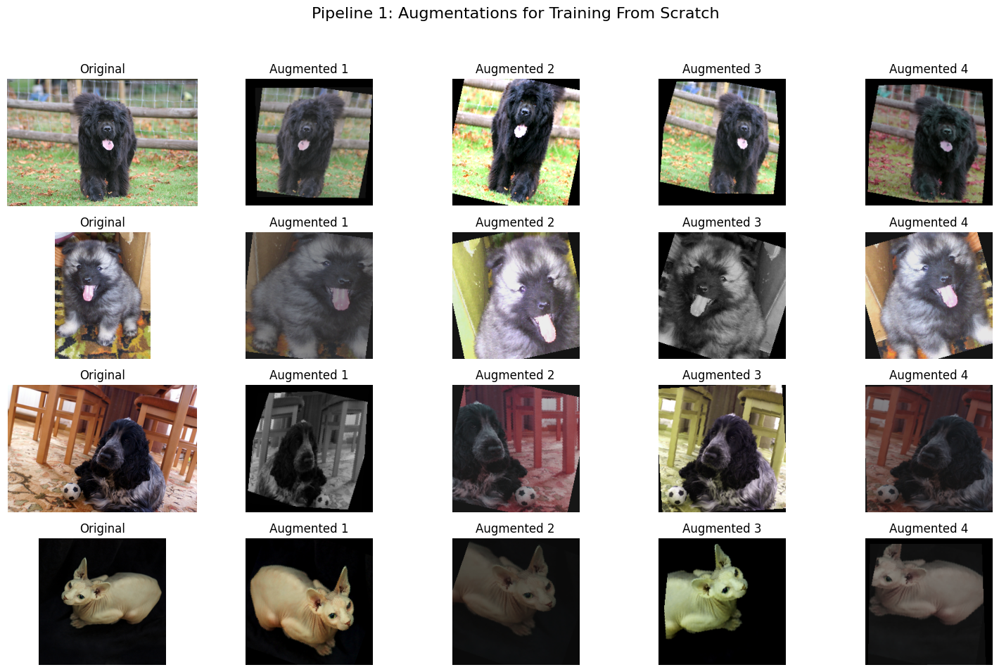

In [18]:
# Visualize the "From Scratch" augmentations
visualize_transforms(
    dataset=raw_train_val_dataset,
    transform=train_transform,
    title='Pipeline 1: Augmentations for Training From Scratch'
)

With the transformations defined, we now prepare the data loaders. This involves several key steps:

1.  **Custom `Dataset` Wrapper**: We first define a `TransformedSubset` helper class. This is necessary because the output of `torch.utils.data.random_split` is a `Subset` object, which doesn't directly support transformations.
2.  **Splitting the Data**: We load the 'trainval' set and create a deterministic 80/20 split for our training and validation sets, respectively. A fixed random seed ensures reproducibility. We also load the official test set.
4.  **Applying Transforms**: Using our wrapper class, we apply the `train_transform` (with augmentations) to the training subset and the `test_transform` (for evaluation) to the validation and test subsets.
5.  **Creating `DataLoader`s**: Finally, we instantiate PyTorch `DataLoader`s for each set. These will handle batching, shuffling, and multi-process data loading to feed the GPU efficiently.

In [19]:
# Data Loading:

# wrapper class to apply transforms to a Subset
class TransformedSubset(Dataset):
    def __init__(self, subset, transform=None):
        self.subset = subset
        self.transform = transform
    def __getitem__(self, index):
        x, y = self.subset[index]
        if self.transform:
            x = self.transform(x)
        return x, y
    def __len__(self):
        return len(self.subset)
    @property
    def classes(self):
        return self.subset.dataset.classes

print("Loading datasets...")
raw_train_val_dataset = torchvision.datasets.OxfordIIITPet(root='./data', split='trainval', download=True)
raw_test_dataset = torchvision.datasets.OxfordIIITPet(root='./data', split='test', download=True, transform=test_transform)

# This one has NO transforms and will be used for visualization
test_dataset_for_viz = torchvision.datasets.OxfordIIITPet(root='./data', split='test', download=True, transform=None)

num_classes = len(raw_train_val_dataset.classes)
print(f"Number of classes: {num_classes}")

# Create deterministic splits
train_size = int(0.8 * len(raw_train_val_dataset))
val_size = len(raw_train_val_dataset) - train_size
train_subset, val_subset = torch.utils.data.random_split(
    raw_train_val_dataset, [train_size, val_size],
    generator=torch.Generator().manual_seed(42)
)

train_dataset = TransformedSubset(train_subset, train_transform)
val_dataset = TransformedSubset(val_subset, test_transform)

print(f"Train size: {len(train_dataset)}")
print(f"Validation size: {len(val_dataset)}")
print(f"Test size: {len(raw_test_dataset)}")

train_loader_scratch = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=4, pin_memory=True)
val_loader_scratch = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=4, pin_memory=True)
test_loader_scratch = DataLoader(raw_test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=4, pin_memory=True)

Loading datasets...
Number of classes: 37
Train size: 2944
Validation size: 736
Test size: 3669


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


1.  **Model Architecture**: We define a `ModifiedResNet18` class. It uses a standard `torchvision.models.resnet18` as the backbone (with `weights=None` to train from scratch), but replaces the final fully-connected layer with a custom classifier (for the 37 classes).
2.  **Weight Initialization**: We apply Kaiming (cf. [He et al., 2015](https://arxiv.org/abs/1502.01852)) normal initialization, a standard practice for networks with ReLU activations, to help prevent vanishing or exploding gradients at the start of training.
3.  **Training Components**: We instantiate the `CrossEntropyLoss` with label smoothing, the `AdamW` optimizer, and a learning rate scheduler that combines a linear warm-up phase with a cosine annealing decay (cf. image at the end of training for a visual representation).
4.  **Helper Utilities**: We define two useful procedures for the training loop: an `EarlyStopping` class to monitor validation accuracy and save the best model, and the `mixup_data` and `mixup_criterion` functions to implement the MixUp data augmentation technique.

One additional thing we do is to save the initial weight configuration of our ResNet-18, that will be loaded later in the ResNet-18 to be Distilled from scratch.
This is done to ensure that those model have both the same weight initial configuration, and so their performance comparison is the fairest possible.

In [20]:
# Model definition, Initialization and Optimization

class ModifiedResNet18(nn.Module):
    def __init__(self, num_classes, dropout_rate=0.5):
        super().__init__()
        self.backbone = torchvision.models.resnet18(weights=None)
        num_ftrs = self.backbone.fc.in_features
        self.backbone.fc = nn.Identity()

        # A more robust classifier head
        self.classifier = nn.Sequential(
            nn.Linear(num_ftrs, 512),
            nn.ReLU(inplace=True),
            nn.BatchNorm1d(512),
            nn.Dropout(p=dropout_rate),
            nn.Linear(512, num_classes)
        )

    def forward(self, x):
        features = self.backbone(x)
        return self.classifier(features)


# We initialize our ResNet-18 to be trained from scratch
model_scratch = ModifiedResNet18(num_classes=num_classes, dropout_rate=DROPOUT_RATE)

# Kaiming initialization
def init_weights(m):
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.Linear):
        nn.init.kaiming_normal_(m.weight, mode='fan_in', nonlinearity='relu')
        if m.bias is not None:
            nn.init.constant_(m.bias, 0)
model_scratch.apply(init_weights)
print("Applied Kaiming initialization.")

# We now save the initial weight configuration
initial_state_dict = copy.deepcopy(model_scratch.state_dict())
print("Saved a copy of the model's initial weights.")

model_scratch = model_scratch.to(device)
print(f"Model created with {sum(p.numel() for p in model_scratch.parameters() if p.requires_grad)} trainable parameters")

criterion_scratch = nn.CrossEntropyLoss(label_smoothing=LABEL_SMOOTHING)

# Use AdamW optimizer as per the script
optimizer_scratch = optim.AdamW(model_scratch.parameters(), lr=LEARNING_RATE, weight_decay=WEIGHT_DECAY)

# LR Scheduler with Warmup + Cosine Decay
def get_lr_scheduler(optimizer, warmup_epochs, total_epochs):
    def lr_lambda(epoch):
        if epoch < warmup_epochs:
            return float(epoch) / float(max(1, warmup_epochs))
        progress = float(epoch - warmup_epochs) / float(max(1, total_epochs - warmup_epochs))
        return 0.5 * (1.0 + np.cos(np.pi * progress))
    return optim.lr_scheduler.LambdaLR(optimizer, lr_lambda)

scheduler_scratch = get_lr_scheduler(optimizer_scratch, warmup_epochs=WARMUP_EPOCHS, total_epochs=NUM_EPOCHS)

# Early Stopping mechanism
class EarlyStopping:
    def __init__(self, patience=10, min_delta=0, path='best_model.pth'):
        self.patience = patience
        self.min_delta = min_delta
        self.counter = 0
        self.best_acc = -1
        self.early_stop = False
        self.path = path

    def __call__(self, val_acc, model):
        if val_acc > self.best_acc + self.min_delta:
            self.best_acc = val_acc
            self.counter = 0
            torch.save(model.state_dict(), self.path)
            print(f'New best val_acc: {self.best_acc:.2f}% - Model saved!')
        else:
            self.counter += 1
            print(f'EarlyStopping counter: {self.counter}/{self.patience}')
            if self.counter >= self.patience:
                self.early_stop = True
                print('Early stopping triggered.')

# Mixup mechanism
# Helper functions to implement the MixUp data augmentation strategy.
# `mixup_data` creates a new batch by taking a weighted linear combination of two random images.
def mixup_data(x, y, alpha=1.0, use_cuda=True):
    if alpha > 0: lam = np.random.beta(alpha, alpha)
    else: lam = 1
    batch_size = x.size()[0]
    index = torch.randperm(batch_size, device=x.device)
    mixed_x = lam * x + (1 - lam) * x[index, :]
    y_a, y_b = y, y[index]
    return mixed_x, y_a, y_b, lam

# `mixup_criterion` adapts the loss function to compute a similarly weighted loss for these mixed-up samples.
def mixup_criterion(criterion, pred, y_a, y_b, lam):
    return lam * criterion(pred, y_a) + (1 - lam) * criterion(pred, y_b)

Applied Kaiming initialization.
Saved a copy of the model's initial weights.
Model created with 11459173 trainable parameters


Here we define the function that executes a single training epoch. It comprehends the core training logic and uses some optimizations:

* **Automatic Mixed Precision (AMP)**: The use of `torch.amp.autocast` and `GradScaler` enables training with half-precision `float16` arithmetic (instead of float32). This can significantly speed up computations and reduce memory usage on compatible GPUs.

* **Conditional MixUp**: MixUp is applied stochastically to each batch. If active for a given batch, the `mixup_data` and `mixup_criterion` functions are used to compute the interpolated loss; otherwise, the standard loss is used.

* **Standard Training Steps**: The function iterates through the data loader, performs the forward pass, calculates the loss, and executes backpropagation and weight updates. A `tqdm` progress bar provides real-time feedback on key metrics like loss, accuracy, and the current learning rate.

In [21]:
# Training and Validation loops

scaler = GradScaler()

def train_epoch_scratch(model, loader, criterion, optimizer, device):
    model.train()
    running_loss, correct, total = 0.0, 0, 0
    pbar = tqdm(loader, desc=f'Training Epoch {epoch+1}/{NUM_EPOCHS}')

    for data, target in pbar:
        data, target = data.to(device, non_blocking=True), target.to(device, non_blocking=True)

        optimizer.zero_grad(set_to_none=True)
        # enabling half-precision arithmetic training and random application of MixUp
        with autocast(device_type=device.type, dtype=torch.float16):
            if USE_MIXUP and np.random.rand() > 0.5:
                inputs, targets_a, targets_b, lam = mixup_data(data, target, MIXUP_ALPHA, use_cuda=True)
                outputs = model(inputs)
                loss = mixup_criterion(criterion, outputs, targets_a, targets_b, lam)
            else:
                outputs = model(data)
                loss = criterion(outputs, target)

        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

        running_loss += loss.item()
        _, predicted = torch.max(outputs.data, 1)
        total += target.size(0)
        correct += (predicted == target).sum().item()

        pbar.set_postfix({
            'Loss': f'{running_loss/(pbar.n+1):.4f}',
            'Acc': f'{100.*correct/total:.2f}%',
            'LR': f'{scheduler_scratch.get_last_lr()[0]:.6f}'
        })
    return running_loss / len(loader), 100. * correct / total

This cell executes the main training process for our baseline model. As all experiments in this section, we have included a control flag to switch between two modes:

* **Skip Training (`SKIP_SCRATCH_TRAINING = True`)**: For faster experimentation and reproducibility, this mode bypasses the training loop entirely. It downloads the already-trained model weights and a CSV file containing the complete training history from Google Drive, then loads them for immediate use in the subsequent evaluation steps.
* **Run Training (`SKIP_SCRATCH_TRAINING = False`)**: This mode executes the full training loop. For each epoch, it calls our `train_epoch_scratch` function, evaluates the model on the validation set, updates the learning rate scheduler, and logs all relevant metrics. The `EarlyStopping` utility is used to monitor performance and it stops the process if validation accuracy ceases to improve for a given amount of epochs, ensuring we save the best-performing model.

Please note that all control flags for the current sections were defined in a cell in the "Global Utilities" section, right before Section 3.

In [22]:
# Main Training Loop (note that it can be skipped if the trained model is already available)

# History lists for plotting, defined here so they exist for both branches
train_losses, train_accuracies = [], []
val_losses, val_accuracies = [], []
lrs = []

if SKIP_SCRATCH_TRAINING:
    print("SKIP_SCRATCH_TRAINING is set to True.")
    print("Skipping training loop and downloading pre-trained model and logs...")

    # download the model and its training log from Google Drive
    model_file_id = '1d86NF3KSsgnxrwQEJrUXcw-0vfJE-RSe'
    log_file_id = '1NUeUiB6L3zxnBNeXGl09LbhBqCPF0wQO'
    log_output_path = 'training_log_from_scratch.csv'

    download_from_gdrive(model_file_id, MODEL_SAVE_PATH, "From-Scratch Model")
    download_from_gdrive(log_file_id, log_output_path, "From-Scratch Log")

    # load the training history and metrics from the downloaded training log
    history = load_training_history_from_csv(log_output_path)
    if history['train_loss']:
        train_losses = history['train_loss']
        train_accuracies = history['train_accuracy']
        val_losses = history['val_loss']
        val_accuracies = history['val_accuracy']
        lrs = history['learning_rate']

    print("\nLoading pre-trained weights into the model...")
    # build the model starting from the downloaded weights
    model_scratch.load_state_dict(torch.load(MODEL_SAVE_PATH, map_location=device))
    print("Model loaded successfully.")

else:
    # we need to perform the real training process
    print("SKIP_SCRATCH_TRAINING is set to False.")
    print("Starting training from scratch...")

    early_stopper = EarlyStopping(patience=PATIENCE, path=MODEL_SAVE_PATH)

    for epoch in range(NUM_EPOCHS):
        train_loss, train_acc = train_epoch_scratch(model_scratch, train_loader_scratch, criterion_scratch, optimizer_scratch, device)
        val_loss, val_acc, _, _ = evaluate_model(model_scratch, val_loader_scratch, criterion_scratch, device, desc='Validation')
        scheduler_scratch.step()

        train_losses.append(train_loss)
        train_accuracies.append(train_acc)
        val_losses.append(val_loss)
        val_accuracies.append(val_acc)
        lrs.append(optimizer_scratch.param_groups[0]["lr"])

        early_stopper(val_acc, model_scratch)
        if early_stopper.early_stop:
            break

    print(f'\nTraining completed! Best validation accuracy: {early_stopper.best_acc:.2f}%')

SKIP_SCRATCH_TRAINING is set to True.
Skipping training loop and downloading pre-trained model and logs...


Downloading...
From (original): https://drive.google.com/uc?id=1d86NF3KSsgnxrwQEJrUXcw-0vfJE-RSe
From (redirected): https://drive.google.com/uc?id=1d86NF3KSsgnxrwQEJrUXcw-0vfJE-RSe&confirm=t&uuid=7c51657e-bbb5-4e7d-9652-e0ae8a3f963a
To: /content/from_scratch.pth
100%|██████████| 45.9M/45.9M [00:00<00:00, 168MB/s]


From-Scratch Model download complete.


Downloading...
From: https://drive.google.com/uc?id=1NUeUiB6L3zxnBNeXGl09LbhBqCPF0wQO
To: /content/training_log_from_scratch.csv
100%|██████████| 29.7k/29.7k [00:00<00:00, 50.9MB/s]

From-Scratch Log download complete.
Successfully loaded training history for 300 epochs from 'training_log_from_scratch.csv'.

Loading pre-trained weights into the model...
Model loaded successfully.


To conclude this experiment, we perform a final evaluation and visualize the results:

1.  **Final Performance Metric**: We load the best model saved during the training process and evaluate its performance on the held-out test set. This provides the final, unbiased accuracy for our baseline model.
2.  **Training History Plots**: Using the metrics logged during training, we generate plots for loss, accuracy, and learning rate over time.
3.  **Qualitative Analysis**: We define and call a `visualize_predictions` function. This displays a sample of test images, showing both the true label and the model's predicted label (color-coded for correctness). This offers a qualitative insight into the model's performance on individual examples. Further visualisations of the model's predictions can be found in Section 4.4.1.


Evaluating on test set using the BEST model...


Testing:   0%|          | 0/58 [00:00<?, ?it/s]

/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


Final Test Loss: 1.3389, Final Test Accuracy: 78.00%


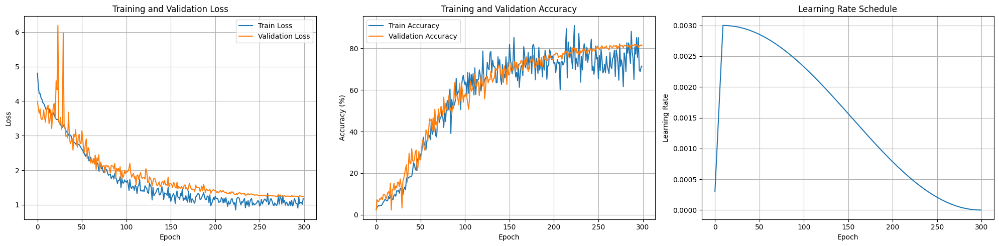

Visualizing predictions...


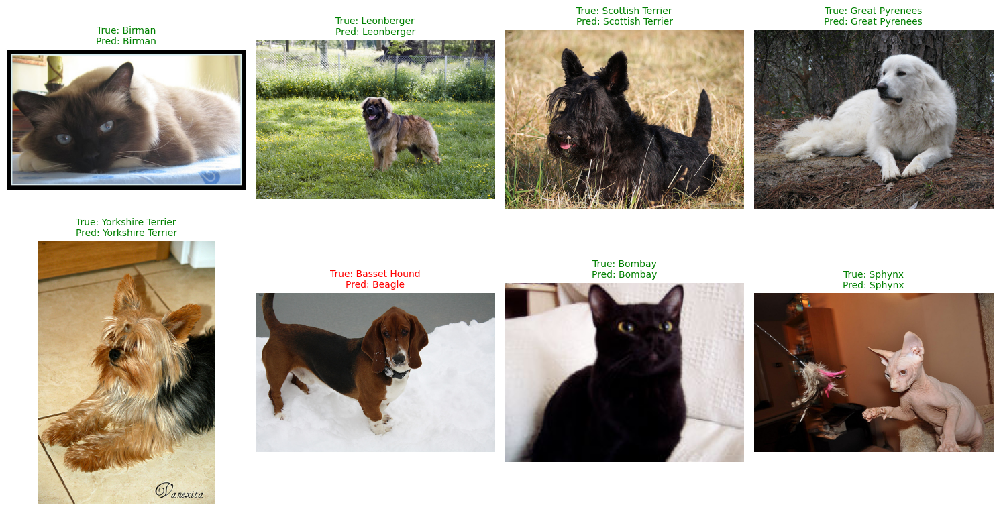

Script finished! Model saved as 'from_scratch.pth'


In [23]:
# Final Evaluation and Visualization

print("\nEvaluating on test set using the BEST model...")
# Load the best performing model
model_scratch.load_state_dict(torch.load(MODEL_SAVE_PATH))
test_loss, test_acc, _, _ = evaluate_model(model_scratch, test_loader_scratch, criterion_scratch, device, desc='Testing')
print(f'Final Test Loss: {test_loss:.4f}, Final Test Accuracy: {test_acc:.2f}%')

# Plotting
plt.figure(figsize=(20, 5))

plt.subplot(1, 3, 1)
plt.plot(train_losses, label='Train Loss')
plt.plot(val_losses, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss')
plt.grid(True)

plt.subplot(1, 3, 2)
plt.plot(train_accuracies, label='Train Accuracy')
plt.plot(val_accuracies, label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy (%)')
plt.legend()
plt.title('Training and Validation Accuracy')
plt.grid(True)

plt.subplot(1, 3, 3)
plt.plot(lrs, label='Learning Rate')
plt.xlabel('Epoch')
plt.ylabel('Learning Rate')
plt.title('Learning Rate Schedule')
plt.grid(True)

plt.tight_layout()
plt.savefig('training_curves_v3.png', dpi=300)
plt.show()

# Visualize predictions
def visualize_predictions(model, dataset, num_images=8):
    model.eval()
    fig, axes = plt.subplots(2, 4, figsize=(15, 8))
    axes = axes.ravel()

    vis_transform = test_transform

    indices = np.random.choice(len(dataset), num_images, replace=False)

    with torch.no_grad():
        for i, idx in enumerate(indices):
            original_image, label = dataset[idx]
            image = vis_transform(original_image).unsqueeze(0).to(device)

            output = model(image)
            _, predicted = torch.max(output, 1)

            axes[i].imshow(original_image)
            true_class = dataset.classes[label]
            pred_class = dataset.classes[predicted.item()]
            title_color = 'green' if true_class == pred_class else 'red'
            axes[i].set_title(f'True: {true_class}\nPred: {pred_class}',
                            fontsize=10, color=title_color)
            axes[i].axis('off')

    plt.tight_layout()
    plt.savefig('predictions_v3.png', dpi=300)
    plt.show()

print("Visualizing predictions...")
# We use the visualization dataset so we can show the images without normalization
visualize_predictions(model_scratch, test_dataset_for_viz, num_images=8)

print(f"Script finished! Model saved as '{MODEL_SAVE_PATH}'")

**Analysis:**

The model trained from scratch achieves a final test accuracy of 78.00%. The training curves exhibit the expected noisy behaviour characteristic of training a deep network on a moderately-sized dataset.

This result serves as a solid baseline, achieved only through a carefully selected regimen of training techniques – including strong augmentation, MixUp, and a cosine annealing learning rate schedule. Without these optimisations, performance would have been significantly lower.

We have reported some examples of the model's predictions on the test set. A further, in depth analysis of the model’s performance is provided in Section 4.4. (Models Interpretation and Visualisation).

## 4.2. Transfer Learning: Fine-tuned ResNet18

Instead of initialising our model's weights randomly, we can employ **transfer learning**. As this technique was introduced during the course's practical laboratories, we will provide a concise overview here. The core idea is that of starting from a model that has already been trained on a very large dataset, such as ImageNet, which contains millions of images across a thousand classes. This "pre-trained" model has already learned to recognise a rich hierarchy of general visual features – from simple edges and textures in its early layers to more complex patterns and object parts in its later layers.

By using these pre-trained weights as a starting point, we provide our model with a significant head start. This approach typically leads to faster convergence and superior performance, as the model only needs to "fine-tune" its existing knowledge for our specific, downstream task of classifying pet breeds, rather than learning everything from scratch.

#### 4.2.1. A Two-Stage Fine-Tuning Strategy

Our implementation follows a two-stage methodology designed to maximise performance and stability, which we have found to be more effective in practice:

1.  **Stage 1: Feature Extraction (Warm-up)**
    First, we *freeze* all the layers of the pre-trained ResNet model, making their weights non-trainable. We then replace the final classification layer with a new, randomly initialised one tailored to our 37 pet breeds. In this stage, we train *only* this new classifier head. This allows the new layer to learn how to interpret the powerful, fixed features extracted by the frozen ResNet base without the risk of large, unstable gradients from the untrained head corrupting the finely-tuned pre-trained weights.

2.  **Stage 2: End-to-End Fine-Tuning with Discriminative Learning Rates**
    After the new classifier is "warmed up", we unfreeze all the layers in the model and begin training the entire network. Here, we employ a technique known as **discriminative fine-tuning**. The hypothesis is that earlier layers learn more general features (like edge detection), which should be altered less, while later layers learn more task-specific features, which require more significant changes. To achieve this, we assign different learning rates to different parts of the network. Our implementation uses a granular approach, creating four distinct parameter groups with progressively larger learning rates as we move from the input layers towards the final classification layer, allowing for a more nuanced and effective tuning process.

We begin the transfer learning experiment by setting up the necessary hyperparameters. The configuration is divided according to our two-stage fine-tuning strategy.

In [24]:
# Fine-Tuning Configuration

NUM_CLASSES = 37
BATCH_SIZE = 64
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Stage 1: Warm-up (Training the classifier head)
STAGE1_EPOCHS = 15
STAGE1_LR = 1e-3
STAGE1_PATIENCE = 4
STAGE1_MODEL_PATH_R18 = "best_model_stage1_r18.pth"

# Stage 2: Full Fine-tuning
STAGE2_EPOCHS = 50
STAGE2_PATIENCE = 8
STAGE2_MODEL_PATH_R18 = "best_model_final_finetuned_r18.pth"

For transfer learning, it is best practice to use the specific preprocessing pipeline that the model was originally trained on. The `torchvision` library makes this easy by providing these transforms alongside the pre-trained weights. We will also add `TrivialAugmentWide` for data augmentation during training.

The rest of the cell mirrors the data loading logic from the first experiment. It creates the same reproducible train/validation split and instantiates the `DataLoader`s that will be used during the fine-tuning process.

In [25]:
# Data preparation for fine-tuning

# Get the original transforms for the ResNet-18 model
weights = torchvision.models.ResNet18_Weights.DEFAULT
val_test_transform = weights.transforms()

# For the training set, apply strong augmentation before the standard transforms
train_transform_ft = transforms.Compose([
    transforms.TrivialAugmentWide(), # strong augmentation policy
    val_test_transform               # original model preprocessing afterwards
])

print("--- Validation/Test Transforms ---")
print(val_test_transform)
print("\n--- Training Transforms (with Augmentation) ---")
print(train_transform_ft)

# We can reuse the TransformedSubset wrapper class and data loading logic from Section 4.1
# to apply these new transforms.

# training-validating and testing datasets
raw_train_val_dataset = torchvision.datasets.OxfordIIITPet(root='./data', split='trainval', download=True)
raw_test_dataset = torchvision.datasets.OxfordIIITPet(root='./data', split='test', download=True)

# Create deterministic splits
train_size = int(0.8 * len(raw_train_val_dataset))
val_size = len(raw_train_val_dataset) - train_size
train_subset, val_subset = torch.utils.data.random_split(
    raw_train_val_dataset, [train_size, val_size],
    generator=torch.Generator().manual_seed(42)
)

# Apply the new transforms
train_dataset_ft = TransformedSubset(train_subset, train_transform_ft)
val_dataset_ft = TransformedSubset(val_subset, val_test_transform)
test_dataset_ft = TransformedSubset(raw_test_dataset, val_test_transform) # Wrap test set for consistency

# Create a dataset for visualization that has NO transforms
raw_test_dataset_for_viz = torchvision.datasets.OxfordIIITPet(root='./data', split='test', download=True, transform=None)

# Create DataLoaders
train_loader_ft = DataLoader(train_dataset_ft, batch_size=BATCH_SIZE, shuffle=True, num_workers=4, pin_memory=True)
val_loader_ft = DataLoader(val_dataset_ft, batch_size=BATCH_SIZE, shuffle=False, num_workers=4, pin_memory=True)
test_loader_ft = DataLoader(test_dataset_ft, batch_size=BATCH_SIZE, shuffle=False, num_workers=4, pin_memory=True)

print(f"\nDataLoaders created successfully.")
print(f"Train batches: {len(train_loader_ft)}, Validation batches: {len(val_loader_ft)}, Test batches: {len(test_loader_ft)}")

--- Validation/Test Transforms ---
ImageClassification(
    crop_size=[224]
    resize_size=[256]
    mean=[0.485, 0.456, 0.406]
    std=[0.229, 0.224, 0.225]
    interpolation=InterpolationMode.BILINEAR
)

--- Training Transforms (with Augmentation) ---
Compose(
    TrivialAugmentWide(num_magnitude_bins=31, interpolation=InterpolationMode.NEAREST, fill=None)
    ImageClassification(
    crop_size=[224]
    resize_size=[256]
    mean=[0.485, 0.456, 0.406]
    std=[0.229, 0.224, 0.225]
    interpolation=InterpolationMode.BILINEAR
)
)

DataLoaders created successfully.
Train batches: 46, Validation batches: 12, Test batches: 58


Now, let's visualize the second pipeline, which uses `TrivialAugmentWide`. This is a modern auto-augmentation policy that applies a wide range of distortions, including shearing, color inversion, and posterization, providing a powerful and diverse set of training examples.

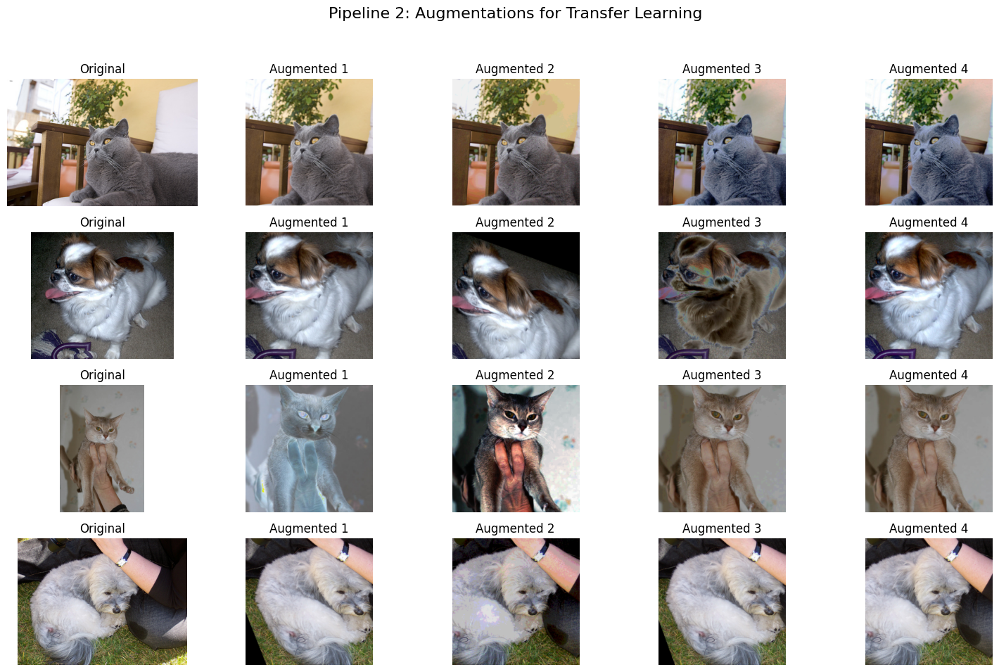

In [26]:
# Visualize the "Transfer Learning" augmentations
visualize_transforms(
    dataset=raw_train_val_dataset,
    transform=train_transform_ft, # This will be the new definition from the fine-tuning section
    title='Pipeline 2: Augmentations for Transfer Learning'
)

We now define our `FineTuneResNet18` model, which is structured to facilitate our two-stage training approach. The initialization performs three steps:

1.  **Load Pre-trained Weights**: It loads a ResNet18 model using the `.DEFAULT` weights, which are pre-trained on ImageNet. This way we have a model with a strong foundation of learned visual features.
2.  **Freeze the Backbone**: All parameters of the pre-trained model are frozen by setting `requires_grad=False`. This protects the learned weights from being corrupted by large gradients from the untrained classifier head during the initial training phase.
3.  **Replace the Classifier**: The original 1000-class ImageNet classifier is replaced with a new, trainable `nn.Sequential` block adjusted to our 37-class problem.

The class also includes a useful `unfreeze_all` method to make all parameters trainable for the second stage of fine-tuning. Finally, we verify that, when we initialize the model, only the parameters of the new classifier are trainable.

In [27]:
# We define the model to fine-tune
class FineTuneResNet18(nn.Module):
    def __init__(self, num_classes, dropout_rate=0.4):
        super().__init__()
        # 1. Load the ResNet18 model with the best available pretrained weights
        weights = torchvision.models.ResNet18_Weights.DEFAULT
        self.resnet = torchvision.models.resnet18(weights=weights)

        # 2. Freeze all parameters in the pretrained backbone
        for param in self.resnet.parameters():
            param.requires_grad = False

        # 3. Replace the final fully connected layer with a new classifier head
        in_features = self.resnet.fc.in_features
        self.resnet.fc = nn.Sequential(
            nn.Linear(in_features, 512),
            nn.ReLU(),
            nn.Dropout(dropout_rate),
            nn.Linear(512, num_classes)
        )

    def forward(self, x):
        return self.resnet(x)

    def unfreeze_all(self):
        """A helper method to unfreeze all layers for the second stage of training."""
        print("Unfreezing all model layers for fine-tuning...")
        for param in self.resnet.parameters():
            param.requires_grad = True

model_ft_r18 = FineTuneResNet18(num_classes=NUM_CLASSES).to(DEVICE)

# Verify which parameters are trainable
trainable_params = sum(p.numel() for p in model_ft_r18.parameters() if p.requires_grad)
total_params = sum(p.numel() for p in model_ft_r18.parameters())
print(f"Initially, only the classifier head is trainable.")
print(f"Trainable parameters: {trainable_params:,}")
print(f"Total parameters: {total_params:,}")

Initially, only the classifier head is trainable.
Trainable parameters: 281,637
Total parameters: 11,458,149


To manage the two-stage training, we define a training loop and an early stopping utility. This loop is simpler than the one used for training from scratch, as we have found advanced techniques like mixed-precision to be less critical for fine-tuning.

* **`EarlyStopper` Class**: This helper class monitors the validation loss during training. It saves a checkpoint of the model whenever a new best (i.e. lower) validation loss is achieved and will stop the training run if the performance does not improve for a set number of epochs (patience).
* **`train_validate_loop_ft` Function**: This function contains the complete logic for one stage of training.

In [28]:
# early-stopping mechanism implementation
class EarlyStopper:
    """Handles early stopping and saves the best model based on validation loss."""
    def __init__(self, patience=7, min_delta=0.001, model_save_path="best_model.pth"):
        self.patience = patience
        self.min_delta = min_delta
        self.counter = 0
        self.best_loss = float('inf')
        self.early_stop = False
        self.model_save_path = model_save_path

    def __call__(self, val_loss, model):
        if val_loss < self.best_loss - self.min_delta:
            self.best_loss = val_loss
            self.counter = 0
            torch.save(model.state_dict(), self.model_save_path)
            print(f"New best model saved with validation loss: {val_loss:.4f}")
        else:
            self.counter += 1
            print(f"No improvement for {self.counter}/{self.patience} epochs. Best loss: {self.best_loss:.4f}")
            if self.counter >= self.patience:
                print("--- Early stopping triggered! ---")
                self.early_stop = True

# training and validation loop
def train_validate_loop_ft(model, train_loader, val_loader, optimizer, criterion, scheduler, num_epochs, early_stopper, device):
    """A complete training and validation loop for one stage of fine-tuning."""
    history = {'train_loss': [], 'train_acc': [], 'val_loss': [], 'val_acc': []}

    for epoch in range(num_epochs):
        # training
        model.train()
        train_loss, train_correct, train_total = 0.0, 0, 0
        pbar_train = tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs} [Training]")
        for inputs, labels in pbar_train:
            inputs, labels = inputs.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            train_loss += loss.item() * inputs.size(0)
            _, predicted = torch.max(outputs, 1)
            train_total += labels.size(0)
            train_correct += (predicted == labels).sum().item()

        epoch_train_loss = train_loss / train_total
        epoch_train_acc = 100 * train_correct / train_total
        history['train_loss'].append(epoch_train_loss)
        history['train_acc'].append(epoch_train_acc)

        # validation
        epoch_val_loss, epoch_val_acc, _, _ = evaluate_model(model, val_loader, criterion, device, desc=f"Epoch {epoch+1}/{num_epochs} [Validation]")
        history['val_loss'].append(epoch_val_loss)
        history['val_acc'].append(epoch_val_acc)

        print(f"Epoch {epoch+1} | Train Acc: {epoch_train_acc:.2f}% | Val Acc: {epoch_val_acc:.2f}% | Val Loss: {epoch_val_loss:.4f}")

        scheduler.step(epoch_val_loss)
        early_stopper(epoch_val_loss, model)
        if early_stopper.early_stop:
            break

    return history

Now, we execute the two training stages.

First, **Stage 1 (Warm-up)** begins. We configure an optimizer that targets *only* the parameters of the new classifier head and then call our `train_validate_loop_ft` function. This allows the new head to learn from the powerful features of the frozen backbone.

Next, **Stage 2 (Full Fine-tuning)** starts. We load the best model from Stage 1 and unfreeze the entire network. A new optimizer is configured to use **discriminative learning rates**, assigning lower rates to earlier, more general layers and higher rates to later, more task-specific layers. The `train_validate_loop_ft` function is called again to train the entire model end-to-end, allowing it to adapt its pre-trained knowledge to our specific dataset.

Again, we have a control flag to skip the training if we want to reuse the pre-trained model. If `SKIP_TL_TRAINING = True`, the code will download the already trained model from Google Drive.

In [29]:
# fine-tuning execution, train stage1 and train stage2:

# History lists
history_stage1_r18, history_stage2_r18 = {}, {}

if SKIP_FINETUNE_R18_TRAINING:
    print("SKIP_FINETUNE_R18_TRAINING is set to True.")
    print("Skipping training and downloading pre-trained fine-tuned ResNet18...")

    # download the model from Google Drive
    model_file_id = '1AcdLNWcpQ_ZXQjooSwVGHblfTGDZNHB2'

    download_from_gdrive(model_file_id, STAGE2_MODEL_PATH_R18, "Fine-tuned ResNet18 Model")

    # loading the downloaded weights
    print("\nLoading pre-trained weights into the model...")
    model_ft_r18.load_state_dict(torch.load(STAGE2_MODEL_PATH_R18, map_location=DEVICE))
    print("Model loaded successfully.")

else:
    print("SKIP_FINETUNE_R18_TRAINING is set to False. Starting training...")
    # Stage 1: Warm-up
    print("\n--- Starting Stage 1 (ResNet18): Training only the classifier head ---")
    criterion_ft = nn.CrossEntropyLoss()

    optimizer_stage1_r18 = optim.AdamW(model_ft_r18.resnet.fc.parameters(), lr=STAGE1_LR, weight_decay=1e-4)
    scheduler_stage1_r18 = optim.lr_scheduler.ReduceLROnPlateau(optimizer_stage1_r18, 'min', factor=0.1, patience=2)
    stopper_stage1_r18 = EarlyStopper(patience=STAGE1_PATIENCE, model_save_path=STAGE1_MODEL_PATH_R18)

    history_stage1_r18 = train_validate_loop_ft(
        model_ft_r18, train_loader_ft, val_loader_ft, optimizer_stage1_r18, criterion_ft, scheduler_stage1_r18,
        num_epochs=STAGE1_EPOCHS, early_stopper=stopper_stage1_r18, device=DEVICE
    )

    # Stage 2: Fine-Tuning
    print("\n--- Starting Stage 2 (ResNet18): Fine-tuning the entire model ---")
    model_ft_r18.load_state_dict(torch.load(STAGE1_MODEL_PATH_R18))
    model_ft_r18.unfreeze_all()

    optimizer_stage2_r18 = optim.AdamW([
        {'params': list(model_ft_r18.resnet.conv1.parameters()) + list(model_ft_r18.resnet.bn1.parameters()) + list(model_ft_r18.resnet.layer1.parameters()), 'lr': 1e-5},
        {'params': list(model_ft_r18.resnet.layer2.parameters()) + list(model_ft_r18.resnet.layer3.parameters()), 'lr': 3e-5},
        {'params': model_ft_r18.resnet.layer4.parameters(), 'lr': 6e-5},
        {'params': model_ft_r18.resnet.fc.parameters(), 'lr': 1e-4}
    ], weight_decay=1e-4)

    scheduler_stage2_r18 = optim.lr_scheduler.ReduceLROnPlateau(optimizer_stage2_r18, 'min', factor=0.2, patience=3)
    stopper_stage2_r18 = EarlyStopper(patience=STAGE2_PATIENCE, model_save_path=STAGE2_MODEL_PATH_R18)

    history_stage2_r18 = train_validate_loop_ft(
        model_ft_r18, train_loader_ft, val_loader_ft, optimizer_stage2_r18, criterion_ft, scheduler_stage2_r18,
        num_epochs=STAGE2_EPOCHS, early_stopper=stopper_stage2_r18, device=DEVICE
    )

SKIP_FINETUNE_R18_TRAINING is set to False. Starting training...

--- Starting Stage 1 (ResNet18): Training only the classifier head ---


Epoch 1/15 [Training]:   0%|          | 0/46 [00:00<?, ?it/s]

Epoch 1/15 [Validation]:   0%|          | 0/12 [00:00<?, ?it/s]

Epoch 1 | Train Acc: 40.79% | Val Acc: 82.47% | Val Loss: 0.8548
New best model saved with validation loss: 0.8548


Epoch 2/15 [Training]:   0%|          | 0/46 [00:00<?, ?it/s]

Epoch 2/15 [Validation]:   0%|          | 0/12 [00:00<?, ?it/s]

Epoch 2 | Train Acc: 70.96% | Val Acc: 84.78% | Val Loss: 0.5348
New best model saved with validation loss: 0.5348


Epoch 3/15 [Training]:   0%|          | 0/46 [00:00<?, ?it/s]

Epoch 3/15 [Validation]:   0%|          | 0/12 [00:00<?, ?it/s]

Epoch 3 | Train Acc: 76.77% | Val Acc: 86.68% | Val Loss: 0.4455
New best model saved with validation loss: 0.4455


Epoch 4/15 [Training]:   0%|          | 0/46 [00:00<?, ?it/s]

Epoch 4/15 [Validation]:   0%|          | 0/12 [00:00<?, ?it/s]

Epoch 4 | Train Acc: 77.28% | Val Acc: 88.04% | Val Loss: 0.3929
New best model saved with validation loss: 0.3929


Epoch 5/15 [Training]:   0%|          | 0/46 [00:00<?, ?it/s]

Epoch 5/15 [Validation]:   0%|          | 0/12 [00:00<?, ?it/s]

Epoch 5 | Train Acc: 79.28% | Val Acc: 90.35% | Val Loss: 0.3511
New best model saved with validation loss: 0.3511


Epoch 6/15 [Training]:   0%|          | 0/46 [00:00<?, ?it/s]

Epoch 6/15 [Validation]:   0%|          | 0/12 [00:00<?, ?it/s]

Epoch 6 | Train Acc: 80.50% | Val Acc: 89.67% | Val Loss: 0.3585
No improvement for 1/4 epochs. Best loss: 0.3511


Epoch 7/15 [Training]:   0%|          | 0/46 [00:00<?, ?it/s]

Epoch 7/15 [Validation]:   0%|          | 0/12 [00:00<?, ?it/s]

Epoch 7 | Train Acc: 83.22% | Val Acc: 91.03% | Val Loss: 0.3146
New best model saved with validation loss: 0.3146


Epoch 8/15 [Training]:   0%|          | 0/46 [00:00<?, ?it/s]

Epoch 8/15 [Validation]:   0%|          | 0/12 [00:00<?, ?it/s]

Epoch 8 | Train Acc: 82.98% | Val Acc: 88.99% | Val Loss: 0.3356
No improvement for 1/4 epochs. Best loss: 0.3146


Epoch 9/15 [Training]:   0%|          | 0/46 [00:00<?, ?it/s]

Epoch 9/15 [Validation]:   0%|          | 0/12 [00:00<?, ?it/s]

Epoch 9 | Train Acc: 82.57% | Val Acc: 90.62% | Val Loss: 0.3040
New best model saved with validation loss: 0.3040


Epoch 10/15 [Training]:   0%|          | 0/46 [00:00<?, ?it/s]

Epoch 10/15 [Validation]:   0%|          | 0/12 [00:00<?, ?it/s]

Epoch 10 | Train Acc: 84.17% | Val Acc: 89.95% | Val Loss: 0.3136
No improvement for 1/4 epochs. Best loss: 0.3040


Epoch 11/15 [Training]:   0%|          | 0/46 [00:00<?, ?it/s]

Epoch 11/15 [Validation]:   0%|          | 0/12 [00:00<?, ?it/s]

Epoch 11 | Train Acc: 83.87% | Val Acc: 91.44% | Val Loss: 0.2854
New best model saved with validation loss: 0.2854


Epoch 12/15 [Training]:   0%|          | 0/46 [00:00<?, ?it/s]

Epoch 12/15 [Validation]:   0%|          | 0/12 [00:00<?, ?it/s]

Epoch 12 | Train Acc: 83.90% | Val Acc: 90.49% | Val Loss: 0.3145
No improvement for 1/4 epochs. Best loss: 0.2854


Epoch 13/15 [Training]:   0%|          | 0/46 [00:00<?, ?it/s]

Epoch 13/15 [Validation]:   0%|          | 0/12 [00:00<?, ?it/s]

Epoch 13 | Train Acc: 84.68% | Val Acc: 89.81% | Val Loss: 0.3179
No improvement for 2/4 epochs. Best loss: 0.2854


Epoch 14/15 [Training]:   0%|          | 0/46 [00:00<?, ?it/s]

Epoch 14/15 [Validation]:   0%|          | 0/12 [00:00<?, ?it/s]

Epoch 14 | Train Acc: 84.07% | Val Acc: 90.35% | Val Loss: 0.3031
No improvement for 3/4 epochs. Best loss: 0.2854


Epoch 15/15 [Training]:   0%|          | 0/46 [00:00<?, ?it/s]

Epoch 15/15 [Validation]:   0%|          | 0/12 [00:00<?, ?it/s]

Epoch 15 | Train Acc: 86.82% | Val Acc: 91.85% | Val Loss: 0.2611
New best model saved with validation loss: 0.2611

--- Starting Stage 2 (ResNet18): Fine-tuning the entire model ---
Unfreezing all model layers for fine-tuning...


Epoch 1/50 [Training]:   0%|          | 0/46 [00:00<?, ?it/s]

Epoch 1/50 [Validation]:   0%|          | 0/12 [00:00<?, ?it/s]

Epoch 1 | Train Acc: 87.87% | Val Acc: 91.17% | Val Loss: 0.2648
New best model saved with validation loss: 0.2648


Epoch 2/50 [Training]:   0%|          | 0/46 [00:00<?, ?it/s]

Epoch 2/50 [Validation]:   0%|          | 0/12 [00:00<?, ?it/s]

Epoch 2 | Train Acc: 89.33% | Val Acc: 92.26% | Val Loss: 0.2333
New best model saved with validation loss: 0.2333


Epoch 3/50 [Training]:   0%|          | 0/46 [00:00<?, ?it/s]

Epoch 3/50 [Validation]:   0%|          | 0/12 [00:00<?, ?it/s]

Epoch 3 | Train Acc: 91.71% | Val Acc: 92.93% | Val Loss: 0.2322
New best model saved with validation loss: 0.2322


Epoch 4/50 [Training]:   0%|          | 0/46 [00:00<?, ?it/s]

Epoch 4/50 [Validation]:   0%|          | 0/12 [00:00<?, ?it/s]

Epoch 4 | Train Acc: 93.75% | Val Acc: 92.53% | Val Loss: 0.2214
New best model saved with validation loss: 0.2214


Epoch 5/50 [Training]:   0%|          | 0/46 [00:00<?, ?it/s]

Epoch 5/50 [Validation]:   0%|          | 0/12 [00:00<?, ?it/s]

Epoch 5 | Train Acc: 93.24% | Val Acc: 92.39% | Val Loss: 0.2267
No improvement for 1/8 epochs. Best loss: 0.2214


Epoch 6/50 [Training]:   0%|          | 0/46 [00:00<?, ?it/s]

Epoch 6/50 [Validation]:   0%|          | 0/12 [00:00<?, ?it/s]

Epoch 6 | Train Acc: 93.38% | Val Acc: 92.66% | Val Loss: 0.2328
No improvement for 2/8 epochs. Best loss: 0.2214


Epoch 7/50 [Training]:   0%|          | 0/46 [00:00<?, ?it/s]

Epoch 7/50 [Validation]:   0%|          | 0/12 [00:00<?, ?it/s]

Epoch 7 | Train Acc: 94.09% | Val Acc: 92.39% | Val Loss: 0.2310
No improvement for 3/8 epochs. Best loss: 0.2214


Epoch 8/50 [Training]:   0%|          | 0/46 [00:00<?, ?it/s]

Epoch 8/50 [Validation]:   0%|          | 0/12 [00:00<?, ?it/s]

Epoch 8 | Train Acc: 93.82% | Val Acc: 91.58% | Val Loss: 0.2349
No improvement for 4/8 epochs. Best loss: 0.2214


Epoch 9/50 [Training]:   0%|          | 0/46 [00:00<?, ?it/s]

Epoch 9/50 [Validation]:   0%|          | 0/12 [00:00<?, ?it/s]

Epoch 9 | Train Acc: 94.57% | Val Acc: 93.21% | Val Loss: 0.2197
New best model saved with validation loss: 0.2197


Epoch 10/50 [Training]:   0%|          | 0/46 [00:00<?, ?it/s]

Epoch 10/50 [Validation]:   0%|          | 0/12 [00:00<?, ?it/s]

Epoch 10 | Train Acc: 95.48% | Val Acc: 92.53% | Val Loss: 0.2210
No improvement for 1/8 epochs. Best loss: 0.2197


Epoch 11/50 [Training]:   0%|          | 0/46 [00:00<?, ?it/s]

Epoch 11/50 [Validation]:   0%|          | 0/12 [00:00<?, ?it/s]

Epoch 11 | Train Acc: 95.48% | Val Acc: 92.66% | Val Loss: 0.2180
New best model saved with validation loss: 0.2180


Epoch 12/50 [Training]:   0%|          | 0/46 [00:00<?, ?it/s]

Epoch 12/50 [Validation]:   0%|          | 0/12 [00:00<?, ?it/s]

Epoch 12 | Train Acc: 95.96% | Val Acc: 92.66% | Val Loss: 0.2204
No improvement for 1/8 epochs. Best loss: 0.2180


Epoch 13/50 [Training]:   0%|          | 0/46 [00:00<?, ?it/s]

Epoch 13/50 [Validation]:   0%|          | 0/12 [00:00<?, ?it/s]

Epoch 13 | Train Acc: 96.20% | Val Acc: 93.21% | Val Loss: 0.2199
No improvement for 2/8 epochs. Best loss: 0.2180


Epoch 14/50 [Training]:   0%|          | 0/46 [00:00<?, ?it/s]

Epoch 14/50 [Validation]:   0%|          | 0/12 [00:00<?, ?it/s]

Epoch 14 | Train Acc: 95.72% | Val Acc: 93.21% | Val Loss: 0.2153
New best model saved with validation loss: 0.2153


Epoch 15/50 [Training]:   0%|          | 0/46 [00:00<?, ?it/s]

Epoch 15/50 [Validation]:   0%|          | 0/12 [00:00<?, ?it/s]

Epoch 15 | Train Acc: 95.52% | Val Acc: 93.07% | Val Loss: 0.2112
New best model saved with validation loss: 0.2112


Epoch 16/50 [Training]:   0%|          | 0/46 [00:00<?, ?it/s]

Epoch 16/50 [Validation]:   0%|          | 0/12 [00:00<?, ?it/s]

Epoch 16 | Train Acc: 95.69% | Val Acc: 93.07% | Val Loss: 0.2102
No improvement for 1/8 epochs. Best loss: 0.2112


Epoch 17/50 [Training]:   0%|          | 0/46 [00:00<?, ?it/s]

Epoch 17/50 [Validation]:   0%|          | 0/12 [00:00<?, ?it/s]

Epoch 17 | Train Acc: 95.69% | Val Acc: 93.48% | Val Loss: 0.2107
No improvement for 2/8 epochs. Best loss: 0.2112


Epoch 18/50 [Training]:   0%|          | 0/46 [00:00<?, ?it/s]

Epoch 18/50 [Validation]:   0%|          | 0/12 [00:00<?, ?it/s]

Epoch 18 | Train Acc: 95.58% | Val Acc: 93.21% | Val Loss: 0.2198
No improvement for 3/8 epochs. Best loss: 0.2112


Epoch 19/50 [Training]:   0%|          | 0/46 [00:00<?, ?it/s]

Epoch 19/50 [Validation]:   0%|          | 0/12 [00:00<?, ?it/s]

Epoch 19 | Train Acc: 96.13% | Val Acc: 92.93% | Val Loss: 0.2135
No improvement for 4/8 epochs. Best loss: 0.2112


Epoch 20/50 [Training]:   0%|          | 0/46 [00:00<?, ?it/s]

Epoch 20/50 [Validation]:   0%|          | 0/12 [00:00<?, ?it/s]

Epoch 20 | Train Acc: 96.37% | Val Acc: 93.07% | Val Loss: 0.2087
New best model saved with validation loss: 0.2087


Epoch 21/50 [Training]:   0%|          | 0/46 [00:00<?, ?it/s]

Epoch 21/50 [Validation]:   0%|          | 0/12 [00:00<?, ?it/s]

Epoch 21 | Train Acc: 95.55% | Val Acc: 93.07% | Val Loss: 0.2037
New best model saved with validation loss: 0.2037


Epoch 22/50 [Training]:   0%|          | 0/46 [00:00<?, ?it/s]

Epoch 22/50 [Validation]:   0%|          | 0/12 [00:00<?, ?it/s]

Epoch 22 | Train Acc: 96.13% | Val Acc: 92.53% | Val Loss: 0.2077
No improvement for 1/8 epochs. Best loss: 0.2037


Epoch 23/50 [Training]:   0%|          | 0/46 [00:00<?, ?it/s]

Epoch 23/50 [Validation]:   0%|          | 0/12 [00:00<?, ?it/s]

Epoch 23 | Train Acc: 95.41% | Val Acc: 92.93% | Val Loss: 0.2037
No improvement for 2/8 epochs. Best loss: 0.2037


Epoch 24/50 [Training]:   0%|          | 0/46 [00:00<?, ?it/s]

Epoch 24/50 [Validation]:   0%|          | 0/12 [00:00<?, ?it/s]

Epoch 24 | Train Acc: 96.33% | Val Acc: 93.48% | Val Loss: 0.2064
No improvement for 3/8 epochs. Best loss: 0.2037


Epoch 25/50 [Training]:   0%|          | 0/46 [00:00<?, ?it/s]

Epoch 25/50 [Validation]:   0%|          | 0/12 [00:00<?, ?it/s]

Epoch 25 | Train Acc: 96.20% | Val Acc: 93.07% | Val Loss: 0.2135
No improvement for 4/8 epochs. Best loss: 0.2037


Epoch 26/50 [Training]:   0%|          | 0/46 [00:00<?, ?it/s]

Epoch 26/50 [Validation]:   0%|          | 0/12 [00:00<?, ?it/s]

Epoch 26 | Train Acc: 96.43% | Val Acc: 92.80% | Val Loss: 0.2123
No improvement for 5/8 epochs. Best loss: 0.2037


Epoch 27/50 [Training]:   0%|          | 0/46 [00:00<?, ?it/s]

Epoch 27/50 [Validation]:   0%|          | 0/12 [00:00<?, ?it/s]

Epoch 27 | Train Acc: 96.33% | Val Acc: 93.07% | Val Loss: 0.2116
No improvement for 6/8 epochs. Best loss: 0.2037


Epoch 28/50 [Training]:   0%|          | 0/46 [00:00<?, ?it/s]

Epoch 28/50 [Validation]:   0%|          | 0/12 [00:00<?, ?it/s]

Epoch 28 | Train Acc: 96.20% | Val Acc: 92.80% | Val Loss: 0.2123
No improvement for 7/8 epochs. Best loss: 0.2037


Epoch 29/50 [Training]:   0%|          | 0/46 [00:00<?, ?it/s]

Epoch 29/50 [Validation]:   0%|          | 0/12 [00:00<?, ?it/s]

Epoch 29 | Train Acc: 96.33% | Val Acc: 93.21% | Val Loss: 0.2077
No improvement for 8/8 epochs. Best loss: 0.2037
--- Early stopping triggered! ---


Finally, we load the best model from the fine-tuning stage and evaluate its performance on the unseen test set:

In [30]:
print("\n--- Final Evaluation on Test Set (ResNet18) ---")
model_ft_r18.load_state_dict(torch.load(STAGE2_MODEL_PATH_R18))

criterion_ft = nn.CrossEntropyLoss()

# Use the global evaluation function
final_test_loss, final_test_acc, all_preds, all_labels = evaluate_model(
    model_ft_r18, test_loader_ft, criterion_ft, DEVICE, desc="Testing ResNet18"
)

print(f"\nFinal Test Accuracy (ResNet18 Fine-Tuned): {final_test_acc:.2f}%")


--- Final Evaluation on Test Set (ResNet18) ---


Testing ResNet18:   0%|          | 0/58 [00:00<?, ?it/s]


Final Test Accuracy (ResNet18 Fine-Tuned): 89.78%


**Analysis:**

As anticipated, transfer learning provides a substantial performance boost. The fine-tuned ResNet18 achieves a final test accuracy of **89.62%**, a dramatic improvement of over 11 percentage points compared to our from-scratch baseline.

This result validates our two-stage fine-tuning strategy – first training the new classifier head and then fine-tuning the entire network with discriminative learning rates – which we found to be the most stable and effective approach through experimentation.

### 4.2.2. Fine-tuning a Larger Model (ResNet34)

To both check that our fine-tuning procedure works and create a more powerful model for our subsequent experiments, we repeat the exact same two-stage fine-tuning process using a deeper **ResNet34** architecture. This serves to establish a strong performance benchmark.

The data preparation, training loop, and early stopping logic remain identical to the ResNet18 experiment. The only key changes are in the model definition (swapping `resnet18` for `resnet34`) and the corresponding layer groups for the discriminative learning rate optimiser.

First, we define a `FineTuneResNet34` class, which is structurally identical to its ResNet18 counterpart but uses a `resnet34` backbone. Then, the cell executes the full training pipeline: Stage 1 warms up the classifier head, and Stage 2 unfreezes the backbone and performs a full fine-tuning using the same discriminative learning rate strategy as before.

**Note for reproducibility:** It is recommended to leave the `SKIP_FINETUNE_R34_TRAINING` flag set to `True` (cf. Global Utilities Section). This will download the fully trained, high-performing teacher model, ensuring that subsequent experiments are run consistently.

In [31]:
# fine-tuning configuration and execution for the ResNet-34

STAGE1_MODEL_PATH_R34 = "best_model_stage1_resnet34.pth"
STAGE2_MODEL_PATH_R34 = "best_model_final_finetuned_resnet34.pth"

# defining the model
class FineTuneResNet34(nn.Module):
    def __init__(self, num_classes, dropout_rate=0.4):
        super().__init__()
        weights = torchvision.models.ResNet34_Weights.DEFAULT
        self.resnet = torchvision.models.resnet34(weights=weights)
        for param in self.resnet.parameters():
            param.requires_grad = False
        in_features = self.resnet.fc.in_features
        self.resnet.fc = nn.Sequential(
            nn.Linear(in_features, 512),
            nn.ReLU(),
            nn.Dropout(dropout_rate),
            nn.Linear(512, num_classes)
        )
    def forward(self, x): return self.resnet(x)
    def unfreeze_all(self):
        print("Unfreezing all ResNet34 layers for fine-tuning...")
        for param in self.resnet.parameters():
            param.requires_grad = True

# instantiating the model
model_ft_r34 = FineTuneResNet34(num_classes=NUM_CLASSES).to(DEVICE)
criterion_ft = nn.CrossEntropyLoss()

# History lists
history_stage1_r34, history_stage2_r34 = {}, {}

if SKIP_FINETUNE_R34_TRAINING:
    print("SKIP_FINETUNE_R34_TRAINING is set to True.")
    print("Skipping training and downloading pre-trained fine-tuned ResNet34...")

    # Download the model from Google Drive
    model_file_id = '1vW3En4p-ChaSDBt99aiqGDriyUrMQs5e'
    download_from_gdrive(model_file_id, STAGE2_MODEL_PATH_R34, "Fine-tuned ResNet34 Model")

else:
    print("SKIP_FINETUNE_R34_TRAINING is set to False. Starting training...")

    # Stage 1: Warm-up
    print("\n--- Starting Stage 1 (ResNet34): Training only the classifier head ---")
    optimizer_stage1_r34 = optim.AdamW(model_ft_r34.resnet.fc.parameters(), lr=STAGE1_LR, weight_decay=1e-4)
    scheduler_stage1_r34 = optim.lr_scheduler.ReduceLROnPlateau(optimizer_stage1_r34, 'min', factor=0.1, patience=2)
    stopper_stage1_r34 = EarlyStopper(patience=STAGE1_PATIENCE, model_save_path=STAGE1_MODEL_PATH_R34)
    history_stage1_r34 = train_validate_loop_ft(
        model_ft_r34, train_loader_ft, val_loader_ft, optimizer_stage1_r34, criterion_ft, scheduler_stage1_r34,
        num_epochs=STAGE1_EPOCHS, early_stopper=stopper_stage1_r34, device=DEVICE
    )

    # Stage 2: fine-tuning
    print("\n--- Starting Stage 2 (ResNet34): Fine-tuning the entire model ---")
    model_ft_r34.load_state_dict(torch.load(STAGE1_MODEL_PATH_R34))
    model_ft_r34.unfreeze_all()
    optimizer_stage2_r34 = optim.AdamW([
        {'params': list(model_ft_r34.resnet.conv1.parameters()) + list(model_ft_r34.resnet.bn1.parameters()) + list(model_ft_r34.resnet.layer1.parameters()), 'lr': 1e-5},
        {'params': list(model_ft_r34.resnet.layer2.parameters()) + list(model_ft_r34.resnet.layer3.parameters()), 'lr': 3e-5},
        {'params': model_ft_r34.resnet.layer4.parameters(), 'lr': 6e-5},
        {'params': model_ft_r34.resnet.fc.parameters(), 'lr': 1e-4}
    ], weight_decay=1e-4)
    scheduler_stage2_r34 = optim.lr_scheduler.ReduceLROnPlateau(optimizer_stage2_r34, 'min', factor=0.2, patience=3)
    stopper_stage2_r34 = EarlyStopper(patience=STAGE2_PATIENCE, model_save_path=STAGE2_MODEL_PATH_R34)
    history_stage2_r34 = train_validate_loop_ft(
        model_ft_r34, train_loader_ft, val_loader_ft, optimizer_stage2_r34, criterion_ft, scheduler_stage2_r34,
        num_epochs=STAGE2_EPOCHS, early_stopper=stopper_stage2_r34, device=DEVICE
    )

SKIP_FINETUNE_R34_TRAINING is set to True.
Skipping training and downloading pre-trained fine-tuned ResNet34...


Downloading...
From (original): https://drive.google.com/uc?id=1vW3En4p-ChaSDBt99aiqGDriyUrMQs5e
From (redirected): https://drive.google.com/uc?id=1vW3En4p-ChaSDBt99aiqGDriyUrMQs5e&confirm=t&uuid=731c1327-4081-49fe-88b6-f94572ceac5c
To: /content/best_model_final_finetuned_resnet34.pth
100%|██████████| 86.4M/86.4M [00:00<00:00, 126MB/s]

Fine-tuned ResNet34 Model download complete.


As with the previous experiment, we conclude by evaluating the final model. We load the best ResNet34 checkpoint saved during Stage 2 and compute its accuracy on the test set. This result serves as our performance benchmark and establishes the quality of our "teacher" model for the upcoming knowledge distillation experiments.

In [32]:
# We want to evaluate our fine-tuned ResNet-34:

print("\n--- Final Evaluation on Test Set (ResNet34 Teacher) ---")
# Load the best model, which was either just downloaded or saved by the EarlyStopper
model_ft_r34.load_state_dict(torch.load(STAGE2_MODEL_PATH_R34, map_location=DEVICE))

# Use the global evaluation function
_, final_test_acc_r34, _, _ = evaluate_model(
    model_ft_r34, test_loader_ft, criterion_ft, DEVICE, desc="Testing ResNet34"
)

print(f"\nFinal Test Accuracy (ResNet34 Fine-Tuned Teacher): {final_test_acc_r34:.2f}%")


--- Final Evaluation on Test Set (ResNet34 Teacher) ---


Testing ResNet34:   0%|          | 0/58 [00:00<?, ?it/s]


Final Test Accuracy (ResNet34 Fine-Tuned Teacher): 91.28%


**Analysis:**

By applying the same two-stage fine-tuning process to the deeper ResNet34 architecture, we achieve a new benchmark accuracy of **91.28%**. This represents a further improvement on the ResNet18 result, confirming the expected principle that increased model capacity can lead to superior performance on this task.

While not detailed in this notebook, we successfully applied this same fine-tuning methodology to even deeper architectures up to ResNet152, yielding further performance gains (~92.5% test accuracy for a ResNet101, ~93.7% for a ResNet152). This consistency across multiple ResNet variants demonstrates the robustness of our fine-tuning approach and the effective scaling of residual architectures.

This high-performing ResNet34 model will now serve as the 'teacher' in our subsequent knowledge distillation experiments.

## 4.3. Knowledge Distillation

After achieving a high accuracy of 91.28% with the fine-tuned ResNet34, a natural question arises: can we transfer some of this superior performance to our smaller, more efficient ResNet18 model? This is precisely the goal of **Knowledge Distillation (KD)**, a powerful technique for model compression and performance enhancement, first formally introduced in the context of modern deep learning by [Hinton et al., 2015](https://arxiv.org/abs/1503.02531).

### 4.3.1. Knowledge Distillation Theory

The core idea of KD is a **teacher-student** training paradigm. A large, high-performing "teacher" model (in our case, the ResNet34) is used to guide the training of a smaller "student" model (our ResNet18). The key insight is that the teacher model has learned a rich, nuanced understanding of the data that goes far beyond simply predicting the correct class. This extra information, often called **"dark knowledge"**, is encoded in the relative probabilities the teacher assigns to all classes, even the incorrect ones. As Hinton et al. explain:

> "[...] the trained model assigns probabilities to all of the incorrect answers and even when these probabilities are very small, some of them are much larger than others. **The relative probabilities of incorrect answers tell us a lot about how the cumbersome model tends to generalize.** An image of a BMW, for example, may only have a very small chance of being mistaken for a garbage truck, but that mistake is still many times more probable than mistaking it for a carrot.”

Standard training with "hard" labels (one-hot vectors) tells the model only that an image is of a specific class and not any other. In contrast, the teacher's "soft" labels provide a full probability distribution that reveals nuanced relationships between classes. This concept is well-illustrated by an example from the original paper regarding MNIST classification: “one version of a 2 may be given a probability of $10^{-6}$ of being a 3 and $10^{-9}$ of being a 7, whereas for another version it may be the other way around. This is valuable information that defines a rich similarity structure over the data (i.e. it says which 2’s look like 3’s and which look like 7s)”. This information about inter-class similarity provides a much richer and more informative training signal than a simple ground-truth label ever could.

To effectively leverage this dark knowledge, the teacher's output probabilities are "softened" using a **temperature scaling** parameter, $T$, in the softmax function. When $T > 1$, it smooths the probability distribution, increasing the magnitude of smaller probabilities and allowing the student to learn from them. The formula for the temperature-scaled softmax is:

$$ p_i = \frac{\exp(z_i / T)}{\sum_j \exp(z_j / T)} $$

Here, $z_i$ are the logits (the raw outputs before the softmax) for class $i$, and $T$ is the temperature. The authors outline the procedure for using this temperature to create the "soft targets" for the student:

> "[...] raise the temperature of the final softmax until the cumbersome model produces a suitably soft set of targets. **We then use the same high temperature when training the small model to match these soft targets.**"

The student is then trained using a composite loss function that combines the standard cross-entropy loss against the hard ground-truth labels and a distillation loss (typically KL-Divergence, cf. upcoming notes) that encourages the student's softened outputs to match the teacher's. This combined approach allows the student to generalise better, as summarised by the authors:

> "[...] a small model trained to generalize in the same way [as a large one] will typically do much better on test data than a small model that is trained in the normal way on the same training set [...]."

***

**Kullback-Leibler Divergence Loss**

The distillation loss used to match the two distributions is typically the **Kullback-Leibler (KL) Divergence**. KL Divergence is a measure of how one probability distribution is different from a second, reference probability distribution (cf. [Wikipedia](https://en.wikipedia.org/wiki/Kullback%E2%80%93Leibler_divergence)). In the distillation framework, the teacher's softened distribution ($p^{(t)}$) is the reference, and the goal is to minimise the divergence of the student's distribution ($p^{(s)}$) from it. Mathematically, it is defined as:

$$ D_{KL}(p^{(t)} || p^{(s)}) = \sum_i p_i^{(t)} \log\left(\frac{p_i^{(t)}}{p_i^{(s)}}\right) $$

Minimising this value effectively trains the student to replicate the teacher's nuanced output.

### 4.3.2. Distilling to a ResNet18 Trained from Scratch

In this first experiment, we investigate the power of distillation in a scenario where pre-trained weights for our target architecture (the student ResNet18) are not available. We train the student completely from scratch, but instead of using only the ground-truth labels, we also guide it with the "dark knowledge" from our pre-trained ResNet34 teacher.

For this experiment, we set up a new data pipeline tailored for knowledge distillation.

* **Augmentation Pipeline**: We define a new training transformation, `train_transform_kd`, which includes another strong regularization technique: `RandomErasing`. This method randomly occludes a rectangular region in the image, forcing the model to learn more robust and holistic features. We have found this to be useful in the KD setup, while detrimental in the previous experiments. The evaluation transform remains the standard deterministic pipeline.
* **DataLoader Creation**: While we introduce a new augmentation strategy, we reuse the exact same data splits from the previous experiments. This ensures a fair comparison of the different training methodologies. We then create a new set of `DataLoader`s to feed this newly transformed data into our student model.

In [33]:
# Data Preparation

print("\\n--- Preparing Data for KD (from scratch) Experiment ---")
train_transform_kd = transforms.Compose([
    transforms.RandomResizedCrop(224, scale=(0.6, 1.0)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomRotation(15),
    transforms.ColorJitter(brightness=0.3, contrast=0.3, saturation=0.3, hue=0.1),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    transforms.RandomErasing(p=0.5, scale=(0.02, 0.33), ratio=(0.3, 3.3), value=0, inplace=False)
])

test_transform_kd = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Re-use the splits but apply the new transforms
train_dataset_kd = TransformedSubset(train_subset, train_transform_kd)
val_dataset_kd = TransformedSubset(val_subset, test_transform_kd)
test_dataset_kd = TransformedSubset(raw_test_dataset, test_transform_kd)

# Create new data loaders
train_loader_kd_scratch = DataLoader(train_dataset_kd, batch_size=BATCH_SIZE, shuffle=True, num_workers=4, pin_memory=True)
val_loader_kd_scratch = DataLoader(val_dataset_kd, batch_size=BATCH_SIZE, shuffle=False, num_workers=4, pin_memory=True)
test_loader_kd_scratch = DataLoader(test_dataset_kd, batch_size=BATCH_SIZE, shuffle=False, num_workers=4, pin_memory=True)

print("DataLoaders for KD experiment created successfully.")

\n--- Preparing Data for KD (from scratch) Experiment ---
DataLoaders for KD experiment created successfully.


Let’s visualise this new augmentation pipeline. Notice how `RandomErasing` randomly removes a rectangular area of the image, which can help the model learn to focus on different parts of the image and become more robust to occlusions.

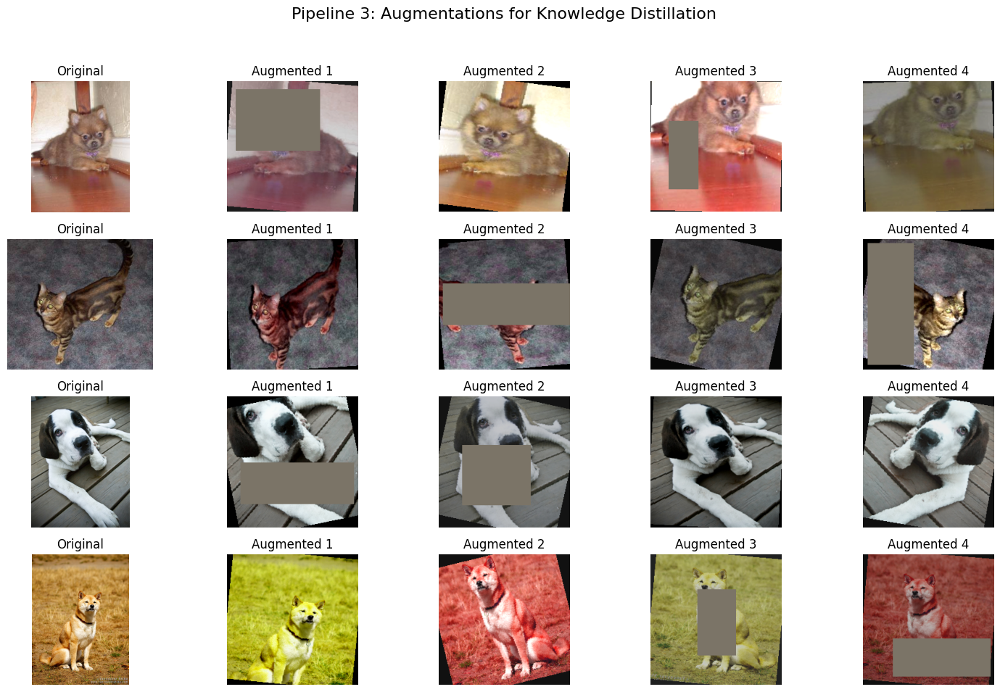

In [34]:
# Visualize the "Transfer Learning" augmentations
visualize_transforms(
    dataset=raw_train_val_dataset,
    transform=train_transform_kd,
    title='Pipeline 3: Augmentations for Knowledge Distillation'
)

Next, we define the full set of hyperparameters for this experiment. In addition to standard training settings, we now include parameters specific to the knowledge distillation process.

* **Training and Regularization**: We set the number of epochs, patience, and introduce gradient clipping to stabilize training. We found it beneficial, here, to use an SGD optimizer, configured with a high initial learning rate and momentum.
* **Knowledge Distillation Settings**: This is the specific configuration for KD:
    * `KD_TEMPERATURE`: The temperature `T` used to soften the softmax outputs of both the teacher and student models. A higher value creates a softer probability distribution, revealing more of the "dark knowledge".
    * `KD_ALPHA`: The weighting factor that balances the two components of our loss function: the standard cross-entropy loss against the "hard" ground-truth labels, and the distillation loss against the teacher's "soft" labels.
    * `TEACHER_MODEL_PATH`: Specifies the path to the saved weights of our trained ResNet34, which will serve as the teacher network.

In [35]:
# Configuring Hyperparameters for our knowledge distillation process:

# Training configuration
KD_NUM_EPOCHS = 300
KD_PATIENCE = 30
KD_MODEL_SAVE_PATH = "best_resnet18_kd_from_scratch.pth"
KD_GRAD_CLIP_NORM = 1.0

# Optimizer and Scheduler configuration
KD_LEARNING_RATE = 0.1
KD_WEIGHT_DECAY = 5e-4
KD_WARMUP_EPOCHS = 10
KD_MOMENTUM = 0.9

# Regularization configuration
KD_LABEL_SMOOTHING = 0.1
KD_DROPOUT_RATE = 0.6
KD_USE_MIXUP = True
KD_MIXUP_ALPHA = 0.2

# Knowledge Distillation configuration
KD_TEMPERATURE = 4.0
KD_ALPHA = 0.7
TEACHER_MODEL_PATH = STAGE2_MODEL_PATH_R34

We now prepare the core components for the teacher-student training process.

* **Model Initialization**:
  *   The **student** is a `ModifiedResNet18` model, identical to our baseline. To ensure a perfectly fair comparison, it is not initialized with new random weights. Instead, we load the **exact same initial Kaiming-initialized weights** that were saved from our first baseline experiment (Section 4.1).
  * The **teacher** is our fully trained `FineTuneResNet34`. We load its weights and, crucially, set it to evaluation mode (`.eval()`) and freeze its parameters, as it will only be used for inference.

* **Custom Loss Function**: We define `distillation_loss_fn`, which computes the final loss as a weighted average of two components:
  1. A standard `CrossEntropyLoss` between the student's predictions and the "hard" ground-truth labels.
  2. A `KLDivLoss` between the student's and teacher's "soft" probability distributions, which are generated using the specified temperature `T`.
A second function, `kd_mixup_loss_fn`, is also defined to correctly handle this logic for batches where MixUp is applied.

In [36]:
# We define here our Student Network model and our loss function

# The student model for the KD experiment is the same as the one from scratch
student_model_scratch = ModifiedResNet18(num_classes=NUM_CLASSES, dropout_rate=KD_DROPOUT_RATE)

# We load the same initial weights of our baseline ResNet-18
student_model_scratch.load_state_dict(initial_state_dict)
student_model_scratch = student_model_scratch.to(device)

# The teacher model is our fine-tuned ResNet34
teacher_model_kd = FineTuneResNet34(num_classes=NUM_CLASSES).to(device)
teacher_model_kd.load_state_dict(torch.load(TEACHER_MODEL_PATH, map_location=device))
teacher_model_kd.eval()  # the teacher network is always in evaluation mode
for param in teacher_model_kd.parameters():
    param.requires_grad = False

print(f"Student Model (from scratch) loaded on {device}.")
print(f"Teacher Model (ResNet34) loaded on {device} and set to eval mode.")

# combined loss function
criterion_kd_ce = nn.CrossEntropyLoss(label_smoothing=KD_LABEL_SMOOTHING)

def distillation_loss_fn(student_logits, teacher_logits, hard_labels, temp, alpha):
    soft_teacher_probs = F.softmax(teacher_logits / temp, dim=1)
    soft_student_log_probs = F.log_softmax(student_logits / temp, dim=1)
    kd_loss = F.kl_div(soft_student_log_probs, soft_teacher_probs, reduction='batchmean') * (temp ** 2)
    ce_loss = criterion_kd_ce(student_logits, hard_labels)
    return alpha * kd_loss + (1.0 - alpha) * ce_loss

def kd_mixup_loss_fn(student_logits, teacher_mixed_logits, targets_a, targets_b, lam, temp, alpha):
    # Soft loss (KL Divergence) is on the mixed data
    soft_teacher_probs = F.softmax(teacher_mixed_logits / temp, dim=1)
    soft_student_log_probs = F.log_softmax(student_logits / temp, dim=1)
    kd_loss = F.kl_div(soft_student_log_probs, soft_teacher_probs, reduction='batchmean') * (temp ** 2)
    # Hard loss is the standard mixup criterion
    ce_loss = mixup_criterion(criterion_kd_ce, student_logits, targets_a, targets_b, lam)
    return alpha * kd_loss + (1.0 - alpha) * ce_loss

Student Model (from scratch) loaded on cuda.
Teacher Model (ResNet34) loaded on cuda and set to eval mode.


The training loop is modified to compute the teacher's logits for each batch and use the combined distillation loss for the backward pass. The validation loop remains unchanged, as it must evaluate the student's true performance using the standard cross-entropy loss.

1.  **Teacher Inference**: In each step, after the student's forward pass, we perform an additional forward pass with the teacher model. This is done within a `torch.no_grad()` block to be computationally efficient, as we only need the teacher's output logits, not its gradients.
2.  **Distillation Loss**: The loss is calculated using our custom `distillation_loss_fn`, which combines the standard cross-entropy loss with the KL-divergence loss against the teacher's soft targets.
3.  **Gradient Clipping**: As previously said, to ensure training stability, we clip the norm of the gradients before the optimizer step.

In [37]:
# modified training loop for knowledge distillation

def train_epoch_kd(student, teacher, loader, optimizer, device):
    student.train()
    teacher.eval() # Teacher is always in eval mode
    running_loss, correct, total = 0.0, 0, 0
    pbar = tqdm(loader, desc=f'Training Epoch {epoch+1}/{KD_NUM_EPOCHS}')

    for data, target in pbar:
        data, target = data.to(device, non_blocking=True), target.to(device, non_blocking=True)
        optimizer.zero_grad(set_to_none=True)

        with autocast(device_type=device.type, dtype=torch.float16):
            if KD_USE_MIXUP:
                inputs, targets_a, targets_b, lam = mixup_data(data, target, KD_MIXUP_ALPHA)
                student_logits = student(inputs)
                with torch.no_grad():
                    teacher_mixed_logits = teacher(inputs)
                loss = kd_mixup_loss_fn(student_logits, teacher_mixed_logits, targets_a, targets_b, lam, KD_TEMPERATURE, KD_ALPHA)
            else:
                student_logits = student(data)
                with torch.no_grad():
                    teacher_logits = teacher(data)
                loss = distillation_loss_fn(student_logits, teacher_logits, target, KD_TEMPERATURE, KD_ALPHA)

        scaler.scale(loss).backward()
        scaler.unscale_(optimizer)
        torch.nn.utils.clip_grad_norm_(student.parameters(), max_norm=KD_GRAD_CLIP_NORM)
        scaler.step(optimizer)
        scaler.update()

        running_loss += loss.item()
        # Accuracy is calculated on original data
        with torch.no_grad(), autocast(device_type=device.type, dtype=torch.float16):
             _, predicted = torch.max(student(data).data, 1)
        total += target.size(0)
        correct += (predicted == target).sum().item()

        pbar.set_postfix({
            'Loss': f'{running_loss/(pbar.n+1):.4f}',
            'Acc': f'{100.*correct/total:.2f}%',
            'LR': f'{scheduler_kd_scratch.get_last_lr()[0]:.5f}'
        })
    return running_loss / len(loader), 100. * correct / total

We now execute the training process.

Importantly, for the validation step, the standard `evaluate_model` function with the normal cross-entropy loss is used. This is because in this phase we want to measure the student's true performance on the hard labels, not its ability to mimic the teacher.

Again, we have a control flag to skip the training if we want to reuse the pre-trained model. If `SKIP_KD_TRAINING = True`, the code will download the already trained model and the training history from Google Drive.

In [38]:
# Main execution loop for knowledge distillation from scratch:

train_losses_kd_scratch, val_losses_kd_scratch, train_accs_kd_scratch, val_accs_kd_scratch, lrs_kd_scratch = [], [], [], [], []

if SKIP_KD_SCRATCH_TRAINING:
    print("SKIP_KD_SCRATCH_TRAINING is set to True.")
    print("Skipping training and downloading KD-from-scratch model...")

    # Download the model and its training log from Google Drive
    model_file_id = '14EgC5-DBsP3ydj9L3cOhiUEpLzWgNsz5'
    log_file_id = '1i0qosyUtowkCL80fm8bLg5Cydjvbz25r'
    log_output_path = 'training_log_kd_scratch.csv'

    download_from_gdrive(model_file_id, KD_MODEL_SAVE_PATH, "KD-from-scratch Model")
    download_from_gdrive(log_file_id, log_output_path, "KD-from-scratch Log")

    history = load_training_history_from_csv(log_output_path)
    if history['train_loss']:
        train_losses_kd_scratch = history['train_loss']
        val_losses_kd_scratch = history['val_loss']
        train_accs_kd_scratch = history['train_accuracy']
        val_accs_kd_scratch = history['val_accuracy']
        lrs_kd_scratch = history['learning_rate']

    # load the downloaded weights
    print("\nLoading pre-trained weights into the student model...")
    student_model_scratch.load_state_dict(torch.load(KD_MODEL_SAVE_PATH, map_location=device))
    print("Model loaded successfully.")

else:
    print("SKIP_KD_SCRATCH_TRAINING is set to False. Starting training...")

    early_stopper_kd_scratch = EarlyStopping(patience=KD_PATIENCE, path=KD_MODEL_SAVE_PATH)
    scaler = GradScaler()

    # Initialize optimizer and scheduler for the KD student model
    optimizer_kd_scratch = optim.SGD(student_model_scratch.parameters(), lr=KD_LEARNING_RATE, momentum=KD_MOMENTUM, weight_decay=KD_WEIGHT_DECAY, nesterov=True)
    scheduler_kd_scratch = get_lr_scheduler(optimizer_kd_scratch, warmup_epochs=KD_WARMUP_EPOCHS, total_epochs=KD_NUM_EPOCHS)

    print("\nStarting training with Knowledge Distillation (from scratch)...")
    for epoch in range(KD_NUM_EPOCHS):
        train_loss, train_acc = train_epoch_kd(student_model_scratch, teacher_model_kd, train_loader_kd_scratch, optimizer_kd_scratch, device)
        val_loss, val_acc, _, _ = evaluate_model(student_model_scratch, val_loader_kd_scratch, criterion_kd_ce, device, desc='Validation')
        scheduler_kd_scratch.step()

        train_losses_kd_scratch.append(train_loss)
        val_losses_kd_scratch.append(val_loss)
        train_accs_kd_scratch.append(train_acc)
        val_accs_kd_scratch.append(val_acc)
        lrs_kd_scratch.append(optimizer_kd_scratch.param_groups[0]["lr"])

        early_stopper_kd_scratch(val_acc, student_model_scratch)
        if early_stopper_kd_scratch.early_stop:
            break

    print(f'\nTraining completed! Best validation accuracy: {early_stopper_kd_scratch.best_acc:.2f}%')

SKIP_KD_SCRATCH_TRAINING is set to True.
Skipping training and downloading KD-from-scratch model...


Downloading...
From (original): https://drive.google.com/uc?id=14EgC5-DBsP3ydj9L3cOhiUEpLzWgNsz5
From (redirected): https://drive.google.com/uc?id=14EgC5-DBsP3ydj9L3cOhiUEpLzWgNsz5&confirm=t&uuid=e342b6a4-d77f-4af8-b973-826c89aa2697
To: /content/best_resnet18_kd_from_scratch.pth
100%|██████████| 45.9M/45.9M [00:00<00:00, 65.3MB/s]


KD-from-scratch Model download complete.


Downloading...
From: https://drive.google.com/uc?id=1i0qosyUtowkCL80fm8bLg5Cydjvbz25r
To: /content/training_log_kd_scratch.csv
100%|██████████| 10.6k/10.6k [00:00<00:00, 21.2MB/s]

KD-from-scratch Log download complete.
Successfully loaded training history for 286 epochs from 'training_log_kd_scratch.csv'.

Loading pre-trained weights into the student model...
Model loaded successfully.


Finally, we evaluate the student model trained with knowledge distillation. This cell loads the best checkpoint saved during the training process and computes the model's final accuracy on the held-out test set. This result will allow us to directly compare the effectiveness of training from scratch with a teacher versus training from scratch with only hard labels.


Evaluating on test set using the BEST distilled model (from scratch)...


Testing:   0%|          | 0/58 [00:00<?, ?it/s]

/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


Final Test Loss: 1.8099, Final Test Accuracy: 86.21%


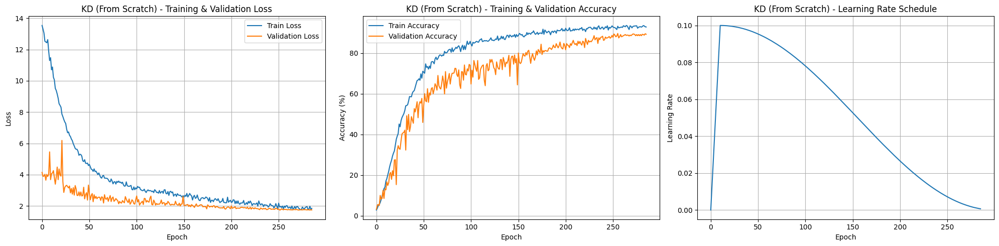

In [39]:
# Evaluation and Visualization:

print("\nEvaluating on test set using the BEST distilled model (from scratch)...")
# Load the best model saved by the early stopper (or downloaded)
student_model_scratch.load_state_dict(torch.load(KD_MODEL_SAVE_PATH, map_location=device))
test_loss, test_acc, _, _ = evaluate_model(student_model_scratch, test_loader_kd_scratch, criterion_kd_ce, device, desc='Testing')
print(f'Final Test Loss: {test_loss:.4f}, Final Test Accuracy: {test_acc:.2f}%')

# Plotting the training history
# It could come from the actual training or from the downloaded training log
if train_losses_kd_scratch:
    plt.figure(figsize=(20, 5))

    plt.subplot(1, 3, 1)
    plt.plot(train_losses_kd_scratch, label='Train Loss')
    plt.plot(val_losses_kd_scratch, label='Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.title('KD (From Scratch) - Training & Validation Loss')
    plt.grid(True)

    plt.subplot(1, 3, 2)
    plt.plot(train_accs_kd_scratch, label='Train Accuracy')
    plt.plot(val_accs_kd_scratch, label='Validation Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy (%)')
    plt.legend()
    plt.title('KD (From Scratch) - Training & Validation Accuracy')
    plt.grid(True)

    plt.subplot(1, 3, 3)
    plt.plot(lrs_kd_scratch, label='Learning Rate')
    plt.xlabel('Epoch')
    plt.ylabel('Learning Rate')
    plt.title('KD (From Scratch) - Learning Rate Schedule')
    plt.grid(True)

    plt.tight_layout()
    plt.savefig('training_curves_kd_scratch.png', dpi=300)
    plt.show()
else:
    print("\nTraining history not available for plotting.")

**Analysis:**

By guiding a ResNet18 trained from scratch with our ResNet34 teacher, we achieve a final test accuracy of **86.21%**. This is a remarkable improvement of over 8 percentage points compared to the 78.00% achieved by the same architecture trained with hard labels alone.

Crucially, this substantial gain was achieved within a similar number of epochs of training, demonstrating that the teacher model successfully transferred its nuanced understanding to the student. This richer training signal enabled the student to learn more generalisable features than it could from ground-truth labels alone. The profound impact of this guidance on the student's feature learning process is further explored in **Section 4.4.3**, where we visually compare the first-layer filters of the models.

This demonstrates that when a pre-trained version of the target architecture is unavailable, distillation from a larger, pre-trained teacher is a highly effective strategy for boosting performance.

Considering the fact that even more advanced distillation techniques exist (cf. **Section 4.3.4.**), the result is promising and suggests that we could further close the gap to the fine-tuned ResNet18: **KD is a great alternative to transfer learning when pre-trained weights are not available.**

Let’s also compare the training curves (validation accuracy) of the baseline model training and the KD one:

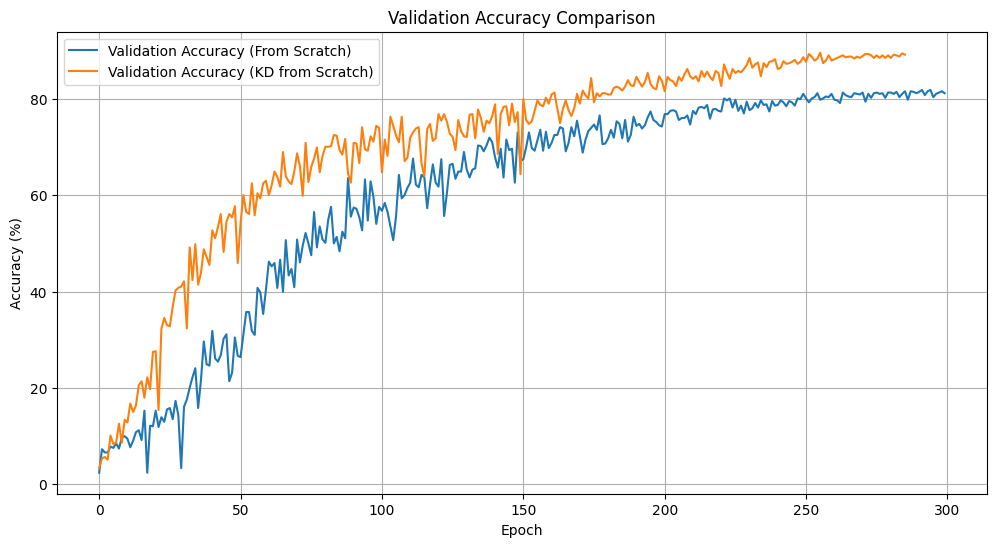

In [40]:
# Create a new figure for the comparison plot
plt.figure(figsize=(12, 6))

# Plot the validation accuracy for the baseline model trained from scratch
plt.plot(val_accuracies, label='Validation Accuracy (From Scratch)')

# Plot the validation accuracy for the model trained with Knowledge Distillation
plt.plot(val_accs_kd_scratch, label='Validation Accuracy (KD from Scratch)')

# Add labels, title, and other plot elements for clarity
plt.title('Validation Accuracy Comparison')
plt.xlabel('Epoch')
plt.ylabel('Accuracy (%)')
plt.legend()
plt.grid(True)

# Display the plot
plt.show()

This comparison plot vividly illustrates the profound impact of knowledge distillation. The teacher's guidance is immediately evident, as the distilled model (orange line) exhibits a significantly steeper and more stable learning curve from the very beginning of training.

This accelerated learning is a direct result of the richer supervisory signal provided by the teacher's soft labels. Critically, the benefit is sustained throughout the entire process.

### 4.3.3. Combining Fine-tuning and Distillation

Having seen the benefits of both transfer learning and knowledge distillation independently, we now combine them. In this experiment, the student model is the pre-trained ResNet18 from **Section 4.2**. We will fine-tune it using the same two-stage process, but this time, the training loss will be the combined distillation loss, guided by the ResNet34 teacher.

For this experiment, we use the same data loading and transformation pipeline as in **Section 4.2 (Transfer Learning)**, which includes `TrivialAugmentWide` and the official ImageNet normalization.

In [41]:
# configuration and model set-up
KD_FINETUNE_SAVE_PATH_S1 = "best_model_stage1_kd_ft.pth"
KD_FINETUNE_SAVE_PATH_S2 = "best_model_final_kd_ft.pth"

# Student model is the pre-trained FineTuneResNet18 from Section 4.2
student_model_ft = FineTuneResNet18(num_classes=NUM_CLASSES).to(device)

print(f"Student Model (pre-trained) loaded on {device}.")

Student Model (pre-trained) loaded on cuda.


The training loop needs to integrate the two-stage logic (training only the head, then unfreezing) with the distillation loss calculation.
We define a new function, `train_validate_loop_ft_kd`, which integrates distillation into our two-stage fine-tuning process.

This function's structure mirrors our previous fine-tuning loop (`train_validate_loop_ft`), handling the overall epoch iteration, validation, and early stopping.

The critical change is in the training phase: instead of using a standard cross-entropy loss, it now performs an inference pass with the teacher model and calculates the loss using our `distillation_loss_fn`. This adds the teacher's guidance into the fine-tuning of our pre-trained student model.

In [42]:
# combined training loop for fine-tuning with distillation

def train_validate_loop_ft_kd(student, teacher, train_loader, val_loader, optimizer, criterion_ce, scheduler, num_epochs, early_stopper, device):
    history = {'train_loss': [], 'train_acc': [], 'val_loss': [], 'val_acc': []}

    for epoch in range(num_epochs):
        # training with distillation
        student.train()
        teacher.eval() # Teacher is always in eval mode
        train_loss, train_correct, train_total = 0.0, 0, 0
        pbar_train = tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs} [Training+KD]")
        for inputs, labels in pbar_train:
            inputs, labels = inputs.to(device), labels.to(device)
            optimizer.zero_grad()
            student_logits = student(inputs)
            with torch.no_grad():
                teacher_logits = teacher(inputs)

            # Use the combined distillation loss for training
            loss = distillation_loss_fn(student_logits, teacher_logits, labels, KD_TEMPERATURE, KD_ALPHA)
            loss.backward()
            optimizer.step()

            train_loss += loss.item() * inputs.size(0)
            _, predicted = torch.max(student_logits, 1)
            train_total += labels.size(0)
            train_correct += (predicted == labels).sum().item()

        history['train_loss'].append(train_loss / train_total)
        history['train_acc'].append(100 * train_correct / train_total)

        # validation
        epoch_val_loss, epoch_val_acc, _, _ = evaluate_model(student, val_loader, criterion_ce, device, desc=f"Epoch {epoch+1}/{num_epochs} [Validation]")
        history['val_loss'].append(epoch_val_loss)
        history['val_acc'].append(epoch_val_acc)

        print(f"Epoch {epoch+1} | Train Acc: {history['train_acc'][-1]:.2f}% | Val Acc: {epoch_val_acc:.2f}% | Val Loss: {epoch_val_loss:.4f}")

        scheduler.step(epoch_val_loss)
        early_stopper(epoch_val_loss, student) # early stopping mechanism is based on validation loss
        if early_stopper.early_stop:
            break

    return history

We now execute the two-stage fine-tuning process, guided by the teacher.

As always, we have a control flag to skip the training if we want to reuse the pre-trained model. If `SKIP_FT_KD_TRAINING = True`, the code will download the already trained model from Google Drive.

In [43]:
# Fine-Tuning with Distillation process

if SKIP_KD_FINETUNE_TRAINING:
    print("SKIP_KD_FINETUNE_TRAINING is set to True.")
    print("Skipping training and downloading KD+Finetune model...")

    # download the model from Google Drive
    model_file_id = '18f0V7M7ReTzCDYlT4KZRMY87mFRRYdG6'

    download_from_gdrive(model_file_id, KD_FINETUNE_SAVE_PATH_S2, "KD+Finetune Model")

else:
    print("SKIP_KD_FINETUNE_TRAINING is set to False. Starting training...")

    # Stage 1: Warm-up with Distillation
    print("\n--- Starting Stage 1 (Fine-Tune + KD): Training classifier head ---")
    criterion_ce_ft_kd = nn.CrossEntropyLoss()
    optimizer_s1_ft_kd = optim.AdamW(student_model_ft.resnet.fc.parameters(), lr=STAGE1_LR, weight_decay=1e-4)
    scheduler_s1_ft_kd = optim.lr_scheduler.ReduceLROnPlateau(optimizer_s1_ft_kd, 'min', factor=0.1, patience=2)
    stopper_s1_ft_kd = EarlyStopper(patience=STAGE1_PATIENCE, model_save_path=KD_FINETUNE_SAVE_PATH_S1)
    train_validate_loop_ft_kd(
        student_model_ft, teacher_model_kd, train_loader_ft, val_loader_ft, optimizer_s1_ft_kd, criterion_ce_ft_kd, scheduler_s1_ft_kd,
        num_epochs=STAGE1_EPOCHS, early_stopper=stopper_s1_ft_kd, device=DEVICE
    )

    # Stage 2: Fine-Tuning with Distillation
    print("\n--- Starting Stage 2 (Fine-Tune + KD): Fine-tuning entire model ---")
    student_model_ft.load_state_dict(torch.load(KD_FINETUNE_SAVE_PATH_S1))
    student_model_ft.unfreeze_all()
    optimizer_s2_ft_kd = optim.AdamW([
        {'params': list(student_model_ft.resnet.conv1.parameters()) + list(student_model_ft.resnet.bn1.parameters()) + list(student_model_ft.resnet.layer1.parameters()), 'lr': 1e-5},
        {'params': list(student_model_ft.resnet.layer2.parameters()) + list(student_model_ft.resnet.layer3.parameters()), 'lr': 3e-5},
        {'params': student_model_ft.resnet.layer4.parameters(), 'lr': 6e-5},
        {'params': student_model_ft.resnet.fc.parameters(), 'lr': 1e-4}
    ], weight_decay=1e-4)
    scheduler_s2_ft_kd = optim.lr_scheduler.ReduceLROnPlateau(optimizer_s2_ft_kd, 'min', factor=0.2, patience=3)
    stopper_s2_ft_kd = EarlyStopper(patience=STAGE2_PATIENCE, model_save_path=KD_FINETUNE_SAVE_PATH_S2)
    train_validate_loop_ft_kd(
        student_model_ft, teacher_model_kd, train_loader_ft, val_loader_ft, optimizer_s2_ft_kd, criterion_ce_ft_kd, scheduler_s2_ft_kd,
        num_epochs=STAGE2_EPOCHS, early_stopper=stopper_s2_ft_kd, device=DEVICE
    )

SKIP_KD_FINETUNE_TRAINING is set to True.
Skipping training and downloading KD+Finetune model...


Downloading...
From (original): https://drive.google.com/uc?id=18f0V7M7ReTzCDYlT4KZRMY87mFRRYdG6
From (redirected): https://drive.google.com/uc?id=18f0V7M7ReTzCDYlT4KZRMY87mFRRYdG6&confirm=t&uuid=eccbcc1b-7083-41f3-98d1-0da1065ed98c
To: /content/best_model_final_kd_ft.pth
100%|██████████| 45.9M/45.9M [00:00<00:00, 139MB/s]

KD+Finetune Model download complete.


To conclude our training experiments, we evaluate the final student model produced by combining transfer learning and knowledge distillation. We load the best checkpoint and compute its accuracy on the test set. We store this accuracy in a variable, `final_fp32_accuracy`, which is going to be used as baseline for the model compression experiments that will follow.

In [44]:
# We now evaluate our results:

print("\n--- Final Evaluation on Test Set (Fine-Tuned with Distillation) ---")
# Load the best model, which was either just downloaded or saved by the EarlyStopper
student_model_ft.load_state_dict(torch.load(KD_FINETUNE_SAVE_PATH_S2, map_location=device))
criterion_ce_ft_kd = nn.CrossEntropyLoss() # Ensure criterion is defined

# Use the global evaluation function
test_loss, test_acc, _, _ = evaluate_model(student_model_ft, test_loader_ft, criterion_ce_ft_kd, device, desc='Testing')
print(f'Final Test Loss: {test_loss:.4f}, Final Test Accuracy: {test_acc:.2f}%')

# Capture the definitive accuracy of our best FP32 model for later use
final_fp32_accuracy = test_acc


--- Final Evaluation on Test Set (Fine-Tuned with Distillation) ---


Testing:   0%|          | 0/58 [00:00<?, ?it/s]

Final Test Loss: 0.3482, Final Test Accuracy: 90.46%


**Analysis:**

The combination of fine-tuning and KD yields our best-performing ResNet18, achieving a final test accuracy of **90.46%**. This result successfully closes most of the performance gap to the larger ResNet34 teacher model.

To validate the robustness of this improvement, we conducted five independent training runs for both the standard fine-tuning and the KD-enhanced fine-tuning processes. The results were as follows:

*   **Fine-tuning only:** Mean Accuracy = 89.62% (± 0.18)
*   **Fine-tuning + KD:** Mean Accuracy = 90.39% (± 0.15)

A Wilcoxon Rank-Sum test (with $\alpha = 0.05$) comparing the two sets of results yielded a p-value of **0.0079**. This statistically significant result (p < 0.05, thus the null hypothesis, that the median accuracy of the two methods is equal, is rejected) confirms that the addition of the teacher's guidance provides a consistent and reliable performance boost over standard fine-tuning alone. This demonstrates that even when starting from a powerful pre-trained base, the nuanced supervisory signal from a slightly larger teacher model can still unlock further performance gains.

This statistical validation was performed specifically for this comparison to rigorously confirm the benefit of adding KD to fine-tuning. For other experiments in this report, single training run results were deemed sufficient to demonstrate the general effectiveness and performance trends of each technique, as our goal was to illustrate a practical workflow rather than perform exhaustive statistical validation at every step.

Again, we emphasise that here we are only using the basic distillation signal. Furthermore, while one could employ an even better teacher, this does not always guarantee superior results. It is often the case that a large architectural gap between the models can hinder knowledge transfer, particularly for advanced distillation methods where a degree of architectural similarity is beneficial.

### 4.3.4. Beyond Classic Distillation

It is important to note that the method described and utilised above – matching the softened logits of the final layer – is the foundational form of KD. The field has since expanded significantly, exploring various other "distillation signals" to transfer knowledge more effectively. These advanced techniques include matching intermediate feature representations ("hints"), aligning the gradients of the models, or even mimicking the teacher's attention patterns.

For a comprehensive overview of these modern and advanced techniques, readers are encouraged to consult the recent survey by [Mansourian et al., 2025](https://arxiv.org/abs/2503.12067). For our project, however, we focussed on the classic and highly effective method proposed by Hinton.

## 4.4. Models Interpretation and Visualisation

Having trained several models, it is insightful to look beyond simple accuracy metrics and attempt to understand *what* they have learned. In this section, we will mainly compare our two most illustrative ResNet18 models:
*   The **Baseline Model**, trained from scratch (Section 4.1).
*   The **Best Model**, fine-tuned with knowledge distillation (Section 4.3.3).

By contrasting these two, we can visually appreciate the profound impact of transfer learning and knowledge distillation. We will conduct four analyses:
1.  **Confusion Matrix:** To see which specific breeds each model struggles to differentiate.
2.  **Feature Space Visualisation (t-SNE):** To project the high-dimensional features the models learn into a 2D space, revealing how well they separate the classes.
3.  **First Layer Filter Visualisation:** To inspect the basic patterns (edges, colours) the models learn to detect at the very start of the network.
4.  **Intermediate Feature Maps:** To observe what parts of an image the models "focus on" at different depths.

In [45]:
# setting up the visualization

# We will create new model instances for visualisation to avoid altering the originals.

# model paths
SCRATCH_MODEL_PATH = 'from_scratch.pth'
KD_SCRATCH_MODEL_PATH = 'best_resnet18_kd_from_scratch.pth'
BEST_MODEL_PATH = 'best_model_final_kd_ft.pth'
NUM_CLASSES = 37
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# load the baseline model
# We use the 'ModifiedResNet18' class definition from section 4.1
model_vis_scratch = ModifiedResNet18(num_classes=NUM_CLASSES, dropout_rate=0.0)
model_vis_scratch.load_state_dict(torch.load(SCRATCH_MODEL_PATH, map_location=DEVICE))
model_vis_scratch = model_vis_scratch.to(DEVICE)
model_vis_scratch.eval()
print(f"Loaded baseline model from '{SCRATCH_MODEL_PATH}'")

# load Knowledge Distillation from Scratch model
# This model also uses the 'ModifiedResNet18' architecture
model_vis_kd_scratch = ModifiedResNet18(num_classes=NUM_CLASSES, dropout_rate=0.0)
model_vis_kd_scratch.load_state_dict(torch.load(KD_SCRATCH_MODEL_PATH, map_location=DEVICE))
model_vis_kd_scratch = model_vis_kd_scratch.to(DEVICE)
model_vis_kd_scratch.eval()
print(f"Loaded KD (from scratch) model from '{KD_SCRATCH_MODEL_PATH}'")

# Load the fine-tuned model with Knowledge Distillation
# We use the 'FineTuneResNet18' class definition from section 4.2
model_vis_best = FineTuneResNet18(num_classes=NUM_CLASSES, dropout_rate=0.0)
model_vis_best.load_state_dict(torch.load(BEST_MODEL_PATH, map_location=DEVICE))
model_vis_best = model_vis_best.to(DEVICE)
model_vis_best.eval()
print(f"Loaded best model from '{BEST_MODEL_PATH}'")

# We will use the test loader from the fine-tuning section, as it has the standard
# ImageNet pre-processing which is a robust choice for evaluation.
print(f"Using 'test_loader_ft' for all evaluations.")

# The raw dataset from section 4.1 should have the class names
class_names = raw_train_val_dataset.classes
print(f"Found {len(class_names)} class names.")


def get_predictions(model, data_loader, device):
    """A helper function to get predictions and labels from a model."""
    model.eval()
    all_preds = []
    all_labels = []
    with torch.no_grad():
        for inputs, labels in tqdm(data_loader, desc="Getting Predictions"):
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            _, predicted = torch.max(outputs, 1)
            all_preds.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
    return np.array(all_preds), np.array(all_labels)

Loaded baseline model from 'from_scratch.pth'
Loaded KD (from scratch) model from 'best_resnet18_kd_from_scratch.pth'
Loaded best model from 'best_model_final_kd_ft.pth'
Using 'test_loader_ft' for all evaluations.
Found 37 class names.


### 4.4.1. Confusion Matrix Comparison

The confusion matrix provides a detailed breakdown of classification performance, showing not just the errors, but also the nature of those errors. A perfect model would have entries only along the main diagonal.

Getting Predictions:   0%|          | 0/58 [00:00<?, ?it/s]

Getting Predictions:   0%|          | 0/58 [00:00<?, ?it/s]

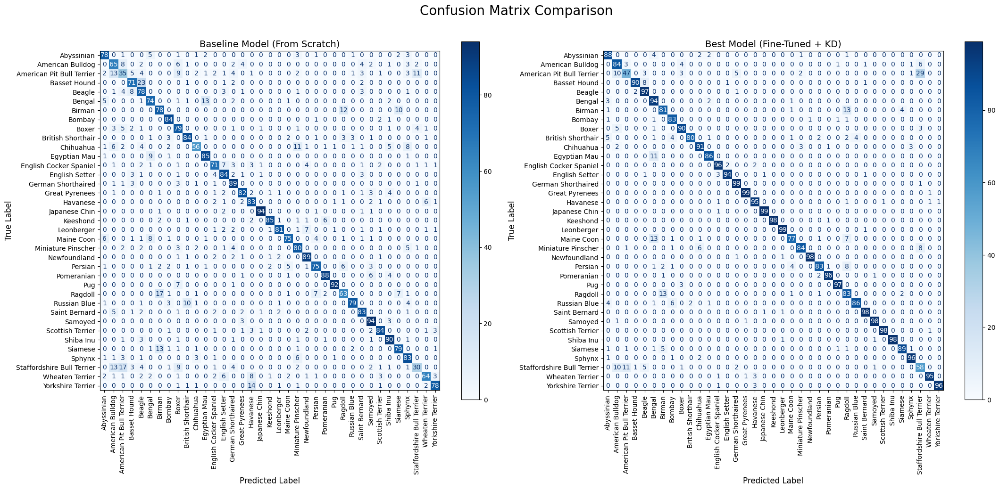

In [46]:
def plot_confusion_matrix(labels, pred_labels, classes, ax, title):
    """Plots a confusion matrix on a given matplotlib axis."""
    cm = confusion_matrix(labels, pred_labels)
    cm_display = ConfusionMatrixDisplay(cm, display_labels=classes)
    cm_display.plot(ax=ax, cmap='Blues', xticks_rotation=90, values_format='d')
    ax.set_title(title, fontsize=14)
    ax.set_xlabel('Predicted Label', fontsize=12)
    ax.set_ylabel('True Label', fontsize=12)


# Get predictions for both models
preds_scratch, labels_scratch = get_predictions(model_vis_scratch, test_loader_ft, DEVICE)
preds_best, labels_best = get_predictions(model_vis_best, test_loader_ft, DEVICE)

# Create the plot
fig, axes = plt.subplots(1, 2, figsize=(22, 10))
fig.suptitle('Confusion Matrix Comparison', fontsize=20)

plot_confusion_matrix(labels_scratch, preds_scratch, class_names, axes[0], 'Baseline Model (From Scratch)')
plot_confusion_matrix(labels_best, preds_best, class_names, axes[1], 'Best Model (Fine-Tuned + KD)')

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

**Analysis**

The confusion matrices clearly show the performance difference between the models. The best model’s matrix (on the right) improves all diagonal elements of the left one. It’s easy to struggle between similar breeds, as a matter of fact, some critical classes for the baseline model remain such even for the better model (but some others where the baseline model struggled are largely correctly classified by the best model).

### 4.4.2. Visualising Feature Space with t-SNE

[t-SNE](https://it.wikipedia.org/wiki/T-distributed_stochastic_neighbor_embedding) (t-Distributed Stochastic Neighbor Embedding) is a dimensionality reduction technique that is particularly well-suited for visualising high-dimensional datasets. We can use it to project the feature vectors from the penultimate layer of our network (the 512-dimensional output of the ResNet backbone) into a 2D space.

A well-trained model should produce feature vectors that form distinct, well-separated clusters for each class. By visualising these, we can gain an intuitive understanding of how effectively the model has learned to distinguish between the different pet breeds.

Extracting features for t-SNE (this may take a moment)...


Extracting 2000 features:   0%|          | 0/58 [00:00<?, ?it/s]

/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


Extracting 2000 features:   0%|          | 0/58 [00:00<?, ?it/s]


Running t-SNE on baseline model features...


/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


Running t-SNE on best model features...


/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/tmp/ipython-input-930502809.py:55: UserWarning: The palette list has more values (37) than needed (21), which may not be intended.
  sns.scatterplot(x=tsne_scratch[:, 0], y=tsne_scratch[:, 1], hue=labels_tsne,
/tmp/ipython-input-930502809.py:61: UserWarning: The palette list has more values (37) than needed (21), which may not be intended.
  sns.scatterplot(x=tsne_best[:, 0], y=tsne_best[:, 1], hue=labels_tsne,


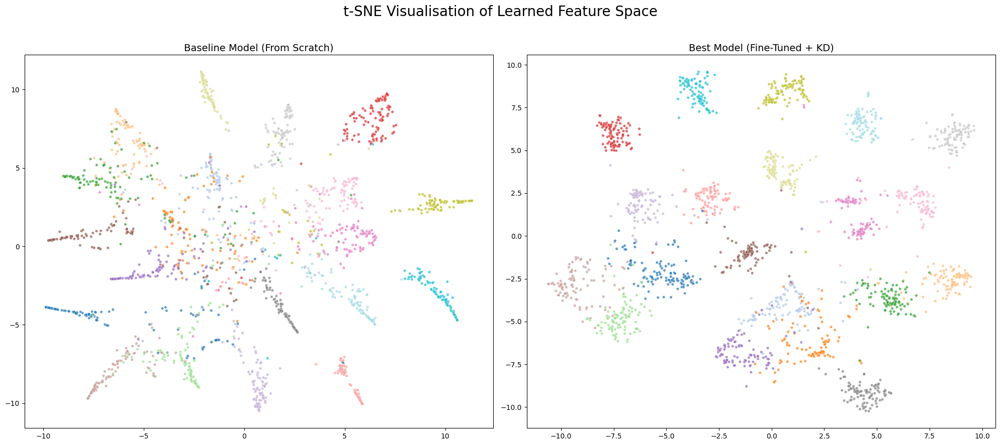

In [47]:
# We need a model definition that extracts features before the final classifier.
class FeatureExtractor(nn.Module):
    def __init__(self, original_model):
        super().__init__()
        # For 'ModifiedResNet18' (scratch), the backbone is under .backbone
        if hasattr(original_model, 'backbone'):
            self.backbone = original_model.backbone
        # For 'FineTuneResNet18' (best), the feature extractor is .resnet
        elif hasattr(original_model, 'resnet'):
            self.backbone = original_model.resnet
            # Temporarily replace its fc layer to stop the forward pass early
            self.backbone.fc = nn.Identity()
        else:
            raise TypeError("Unsupported model type passed to FeatureExtractor")

    def forward(self, x):
        return self.backbone(x)

# preparing the models for feature extraction
feature_extractor_scratch = FeatureExtractor(model_vis_scratch).to(DEVICE)
feature_extractor_best = FeatureExtractor(model_vis_best).to(DEVICE)

def get_features(model, data_loader, device, n_samples=2000):
    """Extracts features for a subset of data."""
    model.eval()
    all_features = []
    all_labels = []
    count = 0
    with torch.no_grad():
        for inputs, labels in tqdm(data_loader, desc=f"Extracting {n_samples} features"):
            if count >= n_samples:
                break
            inputs = inputs.to(device)
            features = model(inputs)
            all_features.append(features.cpu().numpy())
            all_labels.append(labels.cpu().numpy())
            count += len(inputs)
    return np.concatenate(all_features)[:n_samples], np.concatenate(all_labels)[:n_samples]

# extract the features and run t-SNE
print("Extracting features for t-SNE (this may take a moment)...")
features_scratch, labels_tsne = get_features(feature_extractor_scratch, test_loader_ft, DEVICE)
features_best, _ = get_features(feature_extractor_best, test_loader_ft, DEVICE)

print("\nRunning t-SNE on baseline model features...")
tsne_scratch = TSNE(n_components=2, random_state=42, perplexity=30, n_iter=300, init='pca').fit_transform(features_scratch)
print("Running t-SNE on best model features...")
tsne_best = TSNE(n_components=2, random_state=42, perplexity=30, n_iter=300, init='pca').fit_transform(features_best)

# plotting
fig, axes = plt.subplots(1, 2, figsize=(20, 9))
fig.suptitle('t-SNE Visualisation of Learned Feature Space', fontsize=20)

# Plot for Baseline Model
sns.scatterplot(x=tsne_scratch[:, 0], y=tsne_scratch[:, 1], hue=labels_tsne,
                palette=sns.color_palette("tab20", n_colors=NUM_CLASSES),
                legend=False, ax=axes[0], s=15, alpha=0.7)
axes[0].set_title('Baseline Model (From Scratch)', fontsize=14)

# Plot for Best Model
sns.scatterplot(x=tsne_best[:, 0], y=tsne_best[:, 1], hue=labels_tsne,
                palette=sns.color_palette("tab20", n_colors=NUM_CLASSES),
                legend=False, ax=axes[1], s=15, alpha=0.7)
axes[1].set_title('Best Model (Fine-Tuned + KD)', fontsize=14)

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

**Analysis:**

The t-SNE plots clearly show the improved quality of the feature representations. The baseline model's features (left) are poorly structured, forming a large, diffuse cloud with considerable overlap between some classes. This visualises why the model struggled with classification and achieved lower accuracy.
In contrast, our final model (right) learns a highly discriminative feature space. The features form dense, well-separated clusters for each breed. This clean separation simplifies the final classification task for the model's linear head, directly contributing to its superior performance.

### 4.4.3. First Layer Filter Visualisation

The filters in the first convolutional layer are responsible for detecting the most basic visual primitives, such as edges, corners, colour gradients, and simple textures. By visualising these filters, we can get a glimpse into the fundamental building blocks the network uses to interpret images.

A model pre-trained on a large, diverse dataset like ImageNet is expected to have learned a rich and well-structured set of these primitive detectors. We will compare the filters from our baseline model, the pre-trained (best) model, and the model trained from scratch with knowledge distillation to see if the distillation process encouraged the learning of more structured, ImageNet-like features, even without direct pre-training.

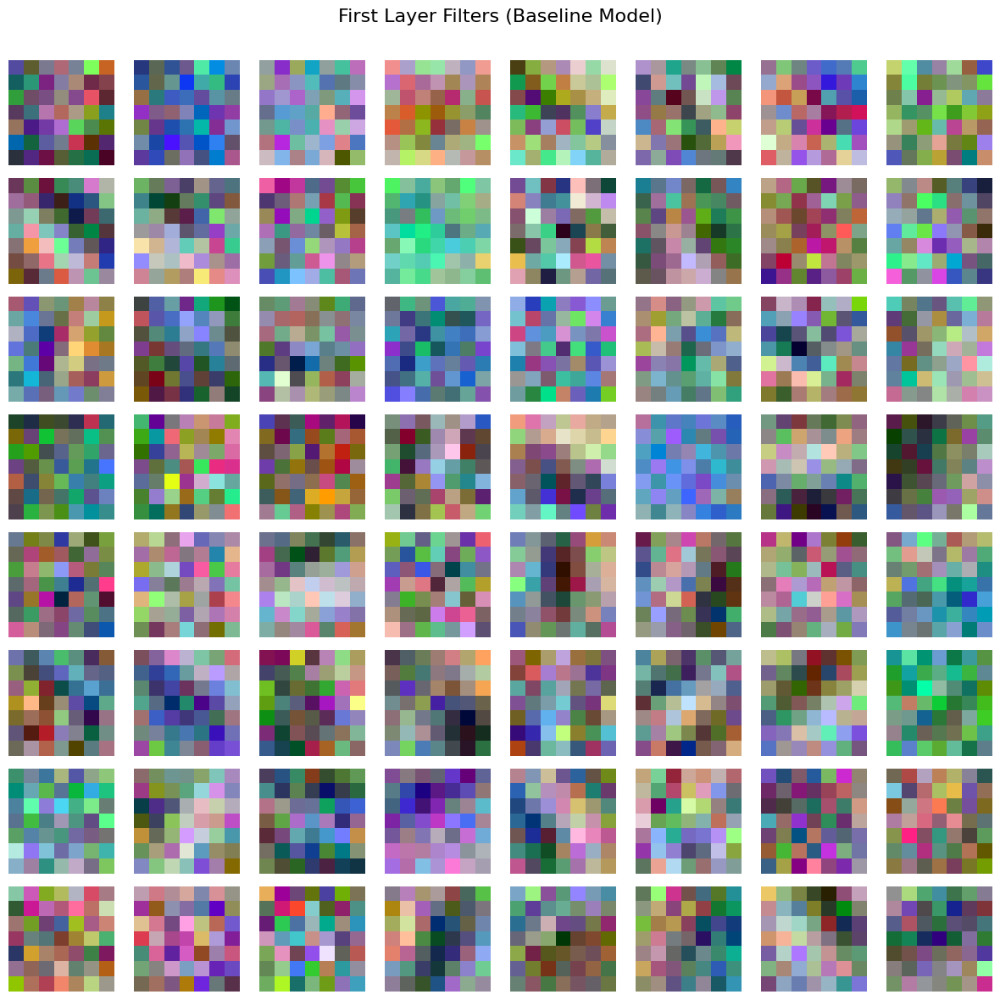

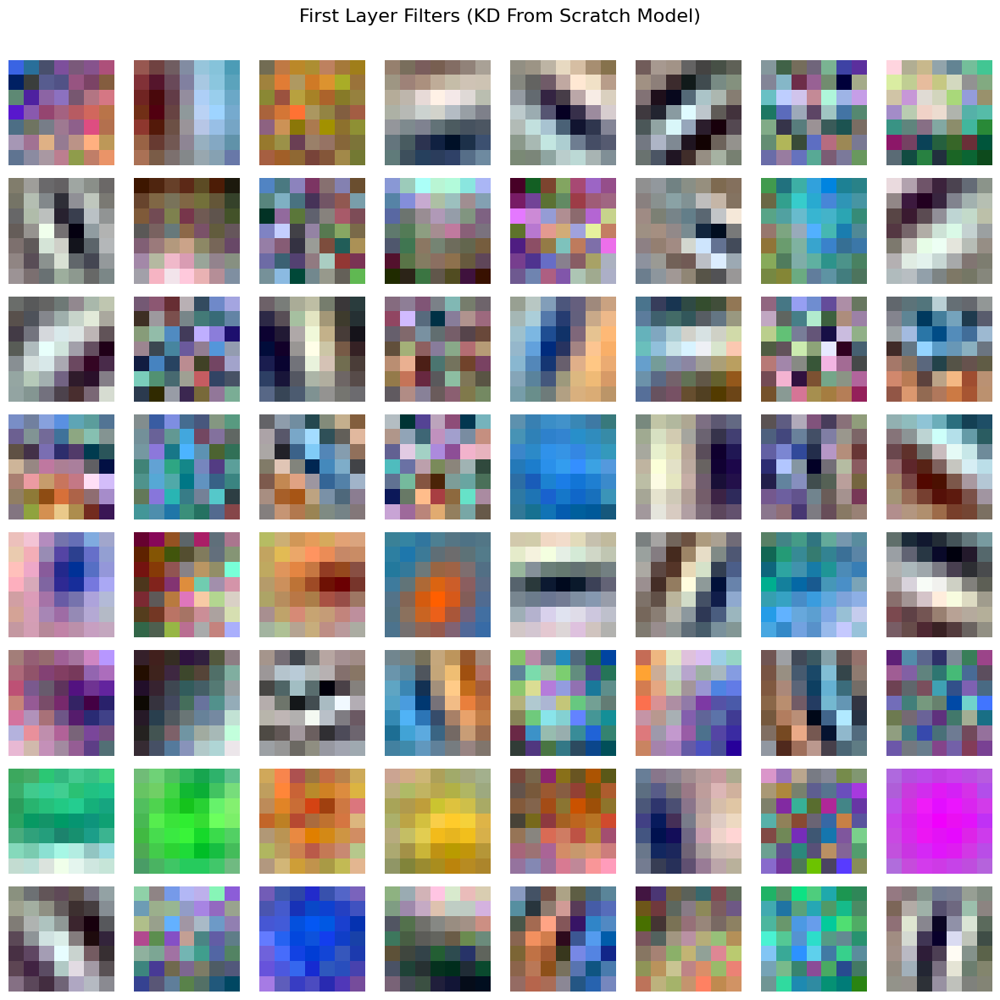

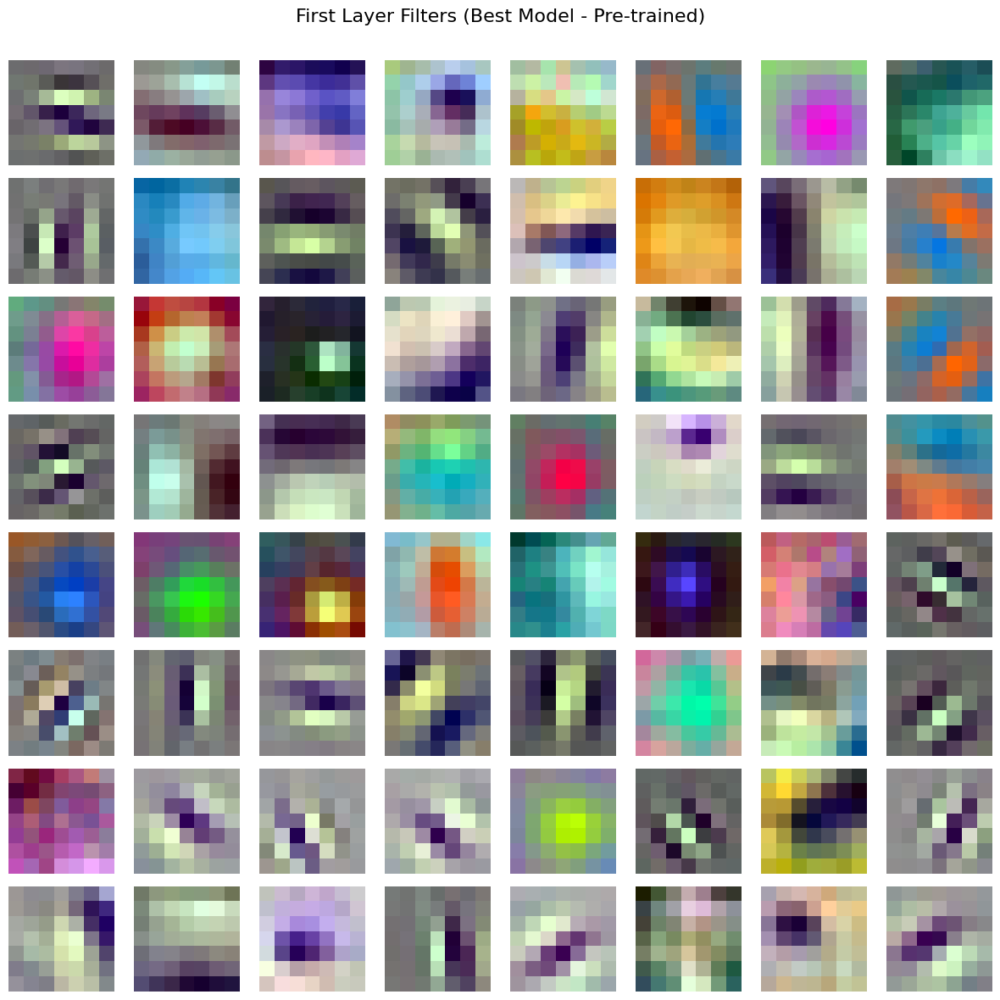

In [48]:
def normalize_filters(filters):
    """Normalizes a tensor of filters to the [0, 1] range for visualization."""
    # Move to CPU and clone to avoid modifying original weights
    filters = filters.detach().cpu().clone()
    # Normalize each filter individually
    for i in range(filters.shape[0]):
        f = filters[i]
        f = f - f.min()
        f = f / f.max()
        filters[i] = f
    return filters

# getting the filters from all three models
# For scratch and KD models, the path is model.backbone.conv1.weight
filters_scratch = model_vis_scratch.backbone.conv1.weight
filters_kd_scratch = model_vis_kd_scratch.backbone.conv1.weight
# For best model, the path is model.resnet.conv1.weight
filters_best = model_vis_best.resnet.conv1.weight

# Normalize for plotting
filters_scratch_norm = normalize_filters(filters_scratch)
filters_kd_scratch_norm = normalize_filters(filters_kd_scratch)
filters_best_norm = normalize_filters(filters_best)

# plots:

# Plot 1: Baseline Model
fig, axes = plt.subplots(8, 8, figsize=(12, 12))
fig.suptitle('First Layer Filters (Baseline Model)', fontsize=16)
for i, ax in enumerate(axes.flat):
    if i < len(filters_scratch_norm):
        ax.imshow(filters_scratch_norm[i].permute(1, 2, 0))
    ax.axis('off')
plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()

# Plot 2: KD From Scratch Model
fig, axes = plt.subplots(8, 8, figsize=(12, 12))
fig.suptitle('First Layer Filters (KD From Scratch Model)', fontsize=16)
for i, ax in enumerate(axes.flat):
    if i < len(filters_kd_scratch_norm):
        ax.imshow(filters_kd_scratch_norm[i].permute(1, 2, 0))
    ax.axis('off')
plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()


# Plot 3: Best Model (Pre-trained)
fig, axes = plt.subplots(8, 8, figsize=(12, 12))
fig.suptitle('First Layer Filters (Best Model - Pre-trained)', fontsize=16)
for i, ax in enumerate(axes.flat):
    if i < len(filters_best_norm):
        ax.imshow(filters_best_norm[i].permute(1, 2, 0))
    ax.axis('off')
plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()

**Analysis:**

The filters of the first convolutional layer reveal the fundamental visual primitives a network has learned to detect.

*   The **Best Model (Pre-trained)**, having been trained on ImageNet, serves as our gold standard. Its filters are clean, interpretable, and diverse, clearly showing structured patterns.
*   The **Baseline Model's** filters, in contrast, are noisy and lack discernible structure. This is likely due to the limited scale of the training data.
*   The **KD From Scratch Model** offers the most compelling insight. Its filters are markedly more structured than the baseline's, showing clear directional patterns and colour gradients. While not as clean as the pre-trained model's, they are far from random. This strongly suggests that the "dark knowledge" from the teacher model guides the student not just at the output layer, but also encourages it to learn a more meaningful and effective feature hierarchy from the very bottom up.

### 4.4.4. Intermediate Feature Map Visualisation

Feature maps, or activation maps, show the output of a filter applied across an entire image. They reveal which regions of an input image "activate" a particular filter. We examine these maps at different depths of the network.

/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


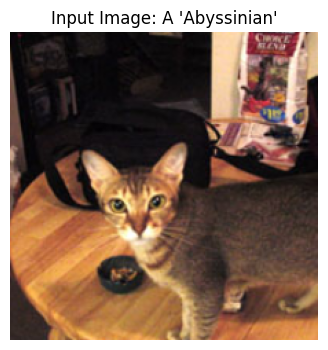

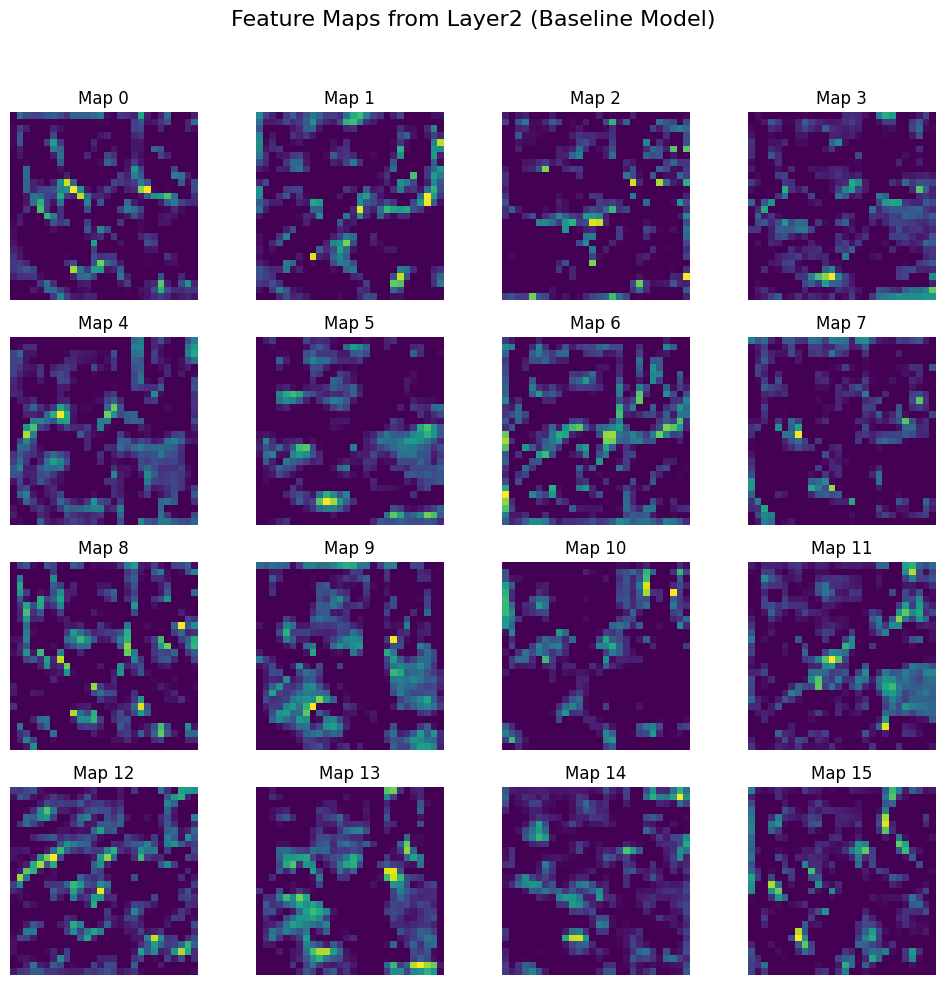

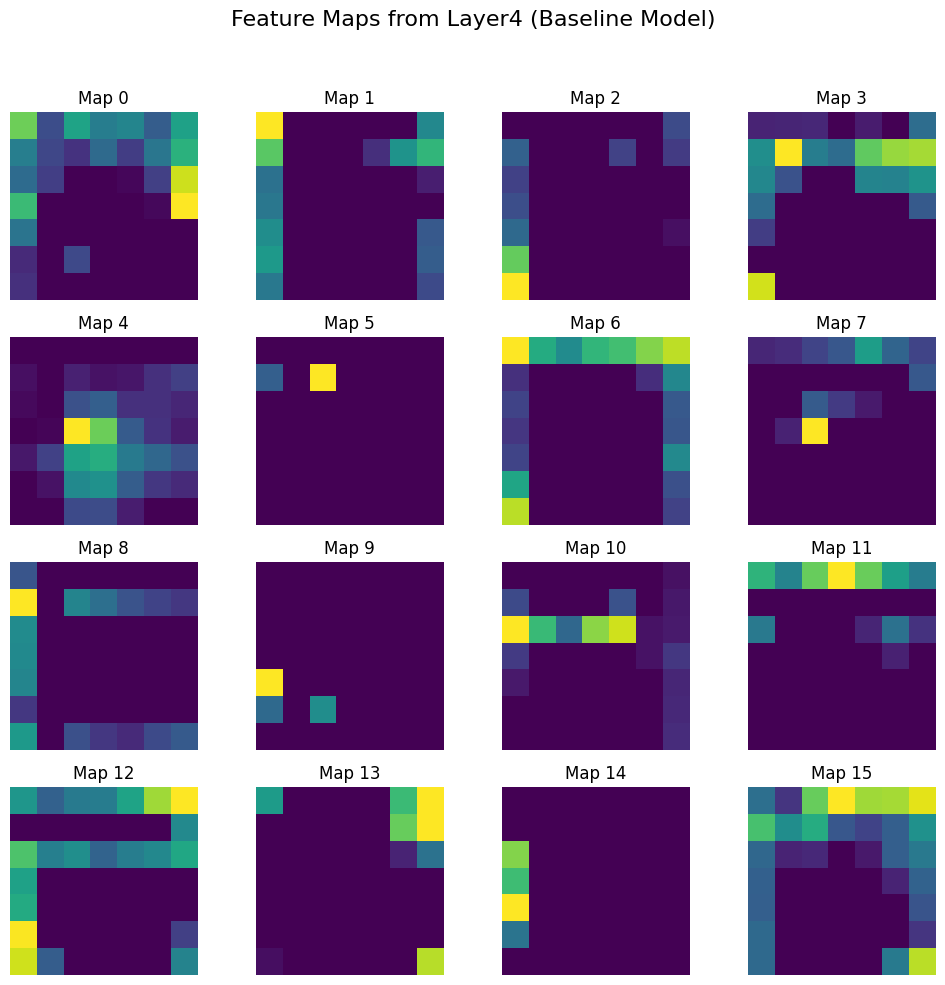

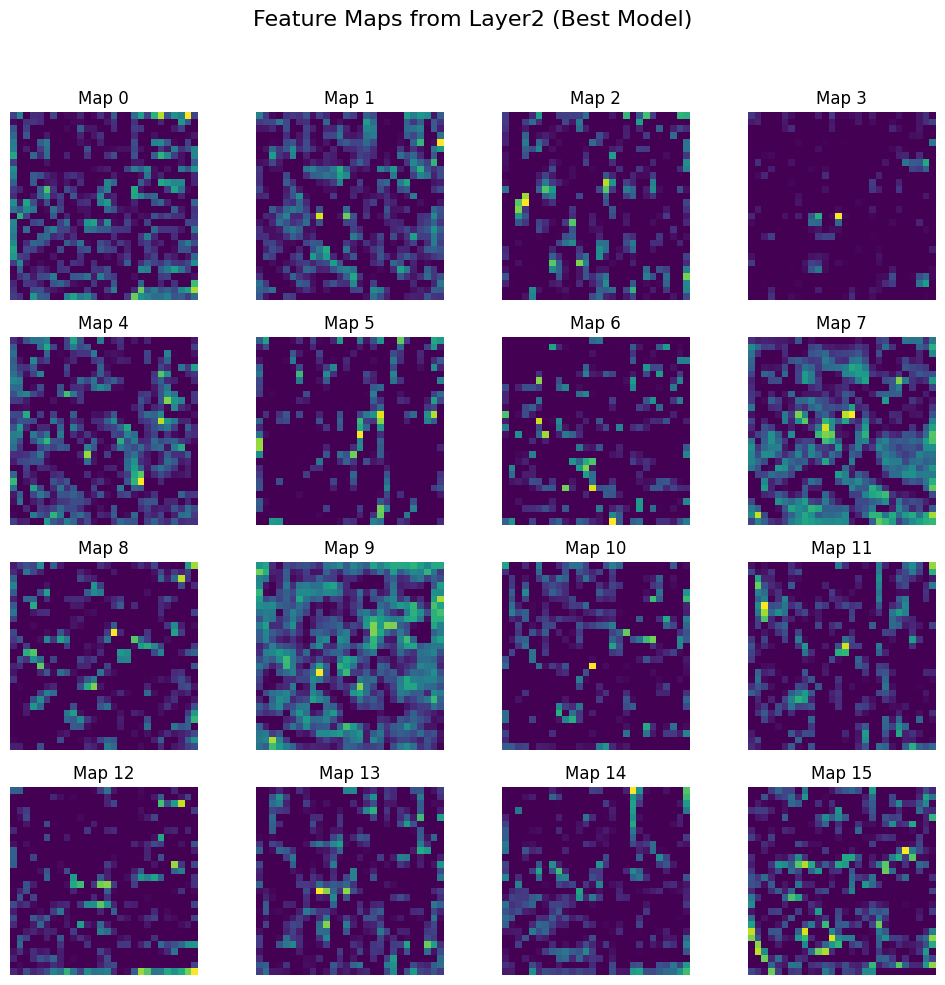

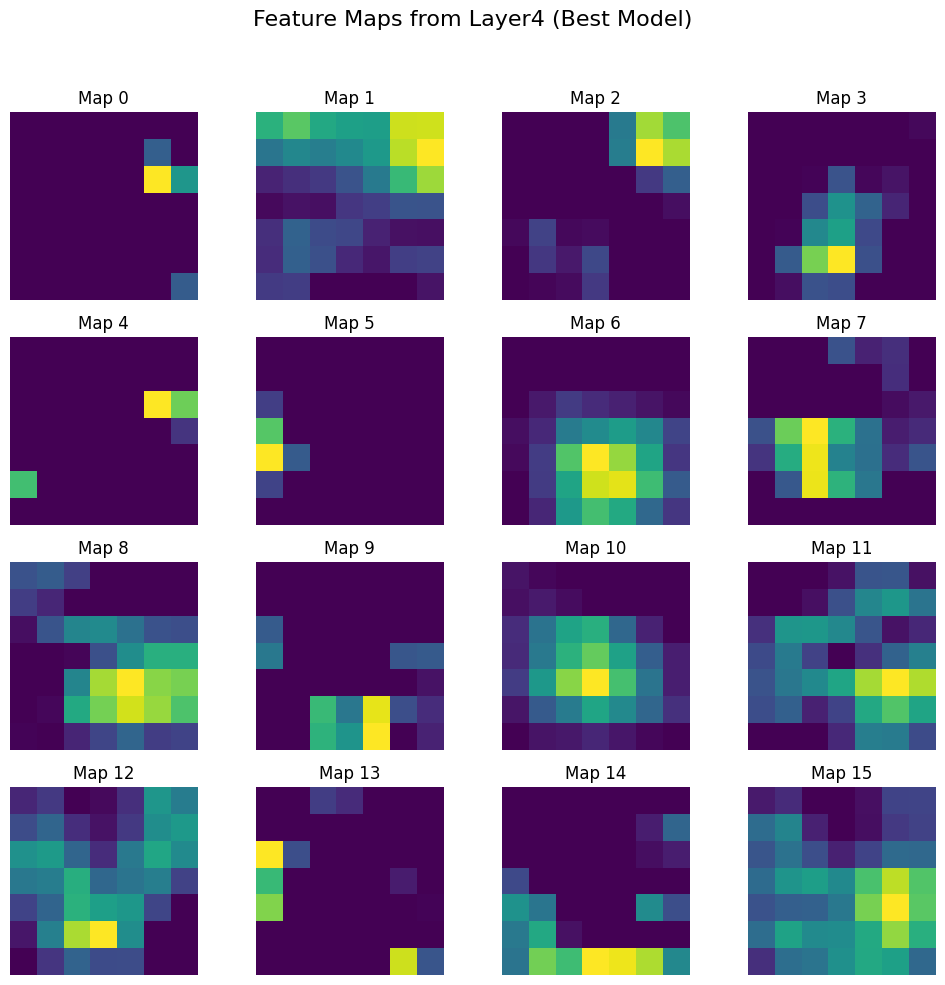

In [49]:
# We need another model wrapper to capture feature maps from intermediate layers.
class MapExtractor(nn.Module):
    def __init__(self, original_model):
        super().__init__()
        # Determine the correct attribute for the backbone
        self.backbone = getattr(original_model, 'backbone', getattr(original_model, 'resnet', None))
        if self.backbone is None:
            raise TypeError("Unsupported model type")

    def forward(self, x):
        feature_maps = {}
        x = self.backbone.conv1(x)
        x = self.backbone.bn1(x)
        x = self.backbone.relu(x)
        x = self.backbone.maxpool(x)
        x = self.backbone.layer1(x)
        feature_maps['layer1'] = x
        x = self.backbone.layer2(x)
        feature_maps['layer2'] = x
        x = self.backbone.layer3(x)
        feature_maps['layer3'] = x
        x = self.backbone.layer4(x)
        feature_maps['layer4'] = x
        return feature_maps

# we prepare the models
map_extractor_scratch = MapExtractor(model_vis_scratch).to(DEVICE)
map_extractor_best = MapExtractor(model_vis_best).to(DEVICE)

# we get a sample image from the test set
sample_image_tensor, sample_label_idx = next(iter(test_loader_ft))
sample_image_tensor = sample_image_tensor[0:1].to(DEVICE) # Take first image, keep batch dim
sample_label_name = class_names[sample_label_idx[0].item()]

# un-normalizing for visualization
un_normalizer = UnNormalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
display_image = un_normalizer(sample_image_tensor.cpu().squeeze(0))
display_image = torch.clamp(display_image, 0, 1)

plt.figure(figsize=(4, 4))
plt.imshow(display_image.permute(1, 2, 0))
plt.title(f"Input Image: A '{sample_label_name}'")
plt.axis('off')
plt.show()

# we get the feature maps and then we plot them
maps_scratch = map_extractor_scratch(sample_image_tensor)
maps_best = map_extractor_best(sample_image_tensor)

def plot_feature_maps(maps, model_name, n_maps=16):
    for layer_name, feature_map in maps.items():
        if layer_name not in ['layer2', 'layer4']: continue # Only show these layers
        feature_map = feature_map[0].cpu().detach()
        maps_to_show = min(n_maps, feature_map.shape[0])

        cols = 4
        rows = int(np.ceil(maps_to_show / cols))

        fig, axes = plt.subplots(rows, cols, figsize=(10, 2.5 * rows))
        title = f"Feature Maps from {layer_name.title()} ({model_name} Model)"
        fig.suptitle(title, fontsize=16)

        for i, ax in enumerate(axes.flat):
            if i < maps_to_show:
                ax.imshow(feature_map[i], cmap='viridis')
                ax.set_title(f"Map {i}")
            ax.axis('off')

        plt.tight_layout(rect=[0, 0, 1, 0.95])
        plt.show()

# Plot maps for both models
plot_feature_maps(maps_scratch, "Baseline")
plot_feature_maps(maps_best, "Best")

**Analysis:**

It's difficult to compare these abstract maps directly.

The only clear difference is that our final model seems to learn more specific features earlier. For example, some of its Layer 2 maps appear to be targeting the cat's eyes and ears, a level of detail not visible in the baseline. This hints at a more effective feature-learning process.

## 4.5. Training Experiments Conclusions

It is worth noting that while more recent architectures would likely yield even higher accuracy on this dataset, the focus of this project was to systematically evaluate the impact of various training methodologies on a single architecture.

The series of experiments we implemented demonstrates a clear and practical pathway for model development. If pre-trained weights are available, transfer learning is the most effective approach, possibly combined with KD for even better results. If not, KD from a larger teacher model can significantly boost performance, even when starting from scratch.

The final Conclusions section (Section 6) will summarise the key findings, together with the results of the model compression experiments that will follow.

# 5. Model Compression Experiments

After developing a high-performing model, a crucial subsequent step is its optimisation for deployment. In real-world applications, operational metrics such as model size, inference latency, and power consumption are often as critical as predictive accuracy, especially for devices with limited computational resources.

Model compression offers a suite of techniques designed to make deep learning models leaner and faster. For this project, we are exploring these methods as a didactic exercise to understand their practical impact. By applying them to our trained model, we can gain first-hand insight into the real-world trade-offs between model size, speed, and accuracy.

This section investigates two of the most known strategies:
*   **Model Quantisation**, which reduces the numerical precision of the model's parameters.
*   **Model Pruning**, which removes redundant or unimportant parameters altogether.

One could argue that KD itself is a form of model compression, as it enables a smaller model to achieve performance closer to that of a larger one. However, in this section, we focus on techniques that directly modify the architecture of the trained model to make it more efficient.

## 5.1. Model Quantisation

The first compression technique we will explore is **model quantisation**, a powerful optimisation technique that addresses the beforementioned real-world challenges by converting a model's parameters and computations from high-precision floating-point numbers to low-precision integers.

### 5.1.1. Fundamentals of Neural Network Quantisation

Deep neural networks are typically trained using 32-bit floating-point numbers (FP32). Quantisation transforms these high-precision numbers into low-precision representations, most commonly 8-bit integers (INT8). This transformation yields substantial practical benefits:

*   **Reduced Model Size:** Using 8-bit integers instead of 32-bit floating-point numbers inherently reduces the model size by a factor of four and similarly cuts memory bandwidth requirements.
*   **Faster Inference:** Integer arithmetic is significantly more efficient than floating-point arithmetic on most modern hardware, including CPUs and specialised accelerators, leading to lower latency.
*   **Lower Power Consumption:** The reduced computational complexity of integer operations leads to lower energy usage, a critical factor for edge devices and large-scale data centres.

The key principle is that while FP32 precision is necessary during training to accumulate small gradient updates, this high precision is often redundant for inference.

The core of quantisation is a mapping function that converts a real-valued FP32 number to an INT8 integer. We employ **affine quantisation**, which uses a linear transformation defined by a scale and a zero-point.

**Forward Mapping (Quantisation):**
$$ x_q = \text{round}\left(\frac{x}{S}\right) + Z $$

**Reverse Mapping (Dequantisation):**
$$ x = S \cdot (x_q - Z) $$

Where:
- `x`: The original FP32 value (a weight or activation).
- `x_q`: The quantised INT8 integer, typically in the range `[-128, 127]`.
- `S`: The **scale**, a positive floating-point number that defines the step size of the quantisation.
- `Z`: The **zero-point**, an integer that ensures the real value of zero is mapped precisely to an integer.

**Example:**
Consider mapping layer activations in the range `[-1.0, 3.0]` to the full INT8 range `[-128, 127]`:

1.  **Calculate Scale:** $S = \frac{3.0 - (-1.0)}{127 - (-128)} = \frac{4.0}{255} \approx 0.0157$
2.  **Calculate Zero-Point:** $Z = -128 - \text{round}\left(\frac{-1.0}{0.0157}\right) = -64$
3.  **Quantise a Value:** For `x = 2.1`, the quantised value is $x_q = \text{round}(2.1/0.0157) + (-64) = 134 - 64 = 70$

This process is applied throughout the network, with a unique scale and zero-point determined for each layer's weights and activations.

### 5.1.2. The Post-Training Quantisation (PTQ) Process

For this project, we utilise **Post-Training Quantisation (PTQ)**, a method applied after the model is fully trained. This approach optimises the model for inference without requiring costly retraining. The process involves several distinct steps:

**1. Module Fusion**
Before quantisation, certain consecutive linear operations in the model graph (e.g. Convolution → Batch Normalisation) are mathematically fused into single modules by combining their parameters. Additionally, some hardware implementations can optimise sequences like Conv → BatchNorm → ReLU through kernel fusion for improved memory efficiency.

**2. Model Instrumentation**
The model architecture is modified by inserting specialised modules:
-   **`QuantStub`:** A module at the model's input to convert incoming FP32 data to INT8.
-   **`DeQuantStub`:** A module at the model's output to convert the final INT8 results back to FP32.
-   **Observers:** Temporary modules placed throughout the network to monitor the statistical range of activation values during the calibration phase.

**3. Calibration: Determining Quantisation Parameters**
This crucial step involves running a small, representative dataset through the instrumented model to determine the optimal quantisation parameters that minimise information loss.

-   **For Weights (Static Quantisation):** The parameters for weights are determined **statically**. Since the trained weights are fixed, we can directly analyse their minimum and maximum values within each layer to calculate the corresponding scale and zero-point.

-   **For Activations (Dynamic Quantisation):** Activation parameters are determined **dynamically**. Activations are transient values generated during the forward pass, so observers record their distribution as the calibration dataset is processed. This allows for the calculation of an appropriate scale and zero-point for each layer's output.

These calculated scale and zero-point values become permanent components of the quantised model.

**4. Conversion to a Quantised Model**
Using the statistics gathered during calibration, the model undergoes its final conversion:
-   **Weight Conversion:** All FP32 weights are converted to their INT8 equivalents using their pre-calculated, layer-specific scale and zero-point. The original FP32 weights are discarded.
-   **Architecture Replacement:** Standard layers (e.g. `nn.Conv2d`) are replaced by their quantised counterparts (e.g. `nn.quantized.Conv2d`). Each new module stores its INT8 weights along with the scale and zero-point parameters for both its weights and its output activations.
-   **Finalising the Architecture:** The temporary **observers are removed** from the model, as their data-gathering role is complete. The **`QuantStub` and `DeQuantStub` modules remain** as permanent, essential parts of the final model graph.


**The Quantised Inference Workflow**

During inference, the quantised model executes the following workflow:

1.  **Input Conversion:** The `QuantStub` converts incoming FP32 data to INT8 using the learned activation parameters of the first layer.
2.  **Integer-Only Computation:** Each quantised layer performs its core operation (e.g. convolution) using highly efficient INT8 arithmetic.
3.  **Accumulation and Requantisation:** When performing operations like matrix multiplication, the product of two INT8 values (e.g. `100 * 100 = 10,000`) can exceed the `[-128, 127]` range. Furthermore, a convolution involves summing many of these products. To prevent overflow and preserve precision, these intermediate sums are stored in a high-bit-width integer accumulator (typically INT32). Before passing this result to the next layer, it is rescaled back down to the INT8 range. This requantisation step uses the stored scale and zero-point parameters of the current layer's output.
4.  **Output Conversion:** Finally, the `DeQuantStub` converts the model's final INT8 output back to FP32 for use in downstream tasks.

The critical performance gain comes from performing the computationally intensive operations entirely with fast integer arithmetic.

**Summary: From FP32 to INT8**

*   **Initial State:** A trained FP32 model with 32-bit floating-point weights, requiring significant memory and computational power for inference.
*   **Final State:** A quantised INT8 model. Its weights are stored as 8-bit integers, and each layer holds the necessary scale and zero-point parameters. The result is a model that is approximately 4x smaller, significantly faster at inference, and maintains nearly the same level of accuracy.

**Experiment: Post-Training Quantisation of ResNet18**

The following code implements the post-training quantisation process described above. There are two key implementation-specific details to note:

*   **Handling Residual Connections (`QuantizableBasicBlock`)**: The standard ResNet architecture includes "skip connections", where the input to a block is added to its output. A simple `+` operation is not valid for two quantised tensors with different scales and zero-points. To address this, we define a custom `QuantizableBasicBlock` that uses a special `torch.nn.quantized.FloatFunctional` module. This module correctly handles the addition of quantised tensors, ensuring the model's architecture remains valid after conversion.

*   **Setting the Backend Engine (`fbgemm`)**: PyTorch uses different backend "engines" to execute quantised operations on different hardware. We explicitly set the engine to `'fbgemm'` (Facebook General Matrix-Matrix Multiplication), which is a library highly optimised for performing fast INT8 computations on x86 CPUs (the architecture of most laptops and servers). This ensures we get the maximum performance benefit from quantisation on our hardware.

First, we define our configuration and prepare the necessary data. As said, for Post-Training Quantisation, we need a small, representative "calibration set" to determine the optimal scaling parameters for the activations. The validation set is a perfect candidate for this. The test set will be used for the final performance evaluation.

The `prepare_data_for_quantization` function creates and returns the `DataLoader`s for both of these sets.

In [50]:
# configuration and data preparation for Quantization procedure

# Path to the best FP32 model
FP32_MODEL_PATH = "best_model_final_kd_ft.pth"
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {DEVICE}")

def prepare_data_for_quantization():
    """Prepares the validation and test sets for calibration and evaluation."""
    print("\n--- Preparing Data for Quantization ---")
    weights = torchvision.models.ResNet18_Weights.DEFAULT
    transform = weights.transforms()

    # We need the validation set for calibration
    raw_train_val_dataset = torchvision.datasets.OxfordIIITPet(root='./data', split='trainval', download=True)
    all_labels = [label for _, label in raw_train_val_dataset]
    _, val_indices = train_test_split(
        list(range(len(raw_train_val_dataset))),
        test_size=0.2, stratify=all_labels, random_state=42
    )
    val_subset_raw = torch.utils.data.Subset(raw_train_val_dataset, val_indices)
    val_dataset = TransformedSubset(val_subset_raw, transform)

    # We need the test set for final evaluation
    raw_test_dataset = torchvision.datasets.OxfordIIITPet(root='./data', split='test', download=True)
    test_dataset = TransformedSubset(raw_test_dataset, transform)

    # Create DataLoaders
    val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)
    test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

    print(f"Calibration set size (validation split): {len(val_dataset)}")
    print(f"Test set size: {len(test_dataset)}")
    return val_loader, test_loader

val_loader_qt, test_loader_qt = prepare_data_for_quantization()

Using device: cuda

--- Preparing Data for Quantization ---
Calibration set size (validation split): 736
Test set size: 3669


As explained previously, we must define a custom model architecture that is compatible with PyTorch's quantization tools. This involves replacing the standard `BasicBlock` with a `QuantizableBasicBlock` that can handle the residual addition correctly, and wrapping the whole model with `QuantStub` and `DeQuantStub` modules.

* **`QuantizableBasicBlock`**: We create a new block that inherits from the original `BasicBlock`. The critical change is replacing the standard tensor addition (`+`) of the skip connection with a `torch.nn.quantized.FloatFunctional` module. This special module is designed to correctly handle the addition of two quantized tensors, which may have different scales and zero-points.

* **`QuantizableResNetClassifier`**: This main class builds a ResNet using our new `QuantizableBasicBlock`. It also adds two essential modules for the quantization process:
    * `QuantStub`: Placed at the beginning of the `forward` pass, it converts the incoming FP32 data to the quantized INT8 format.
    * `DeQuantStub`: Placed at the end, it converts the final INT8 output back to FP32.

In [51]:

class QuantizableBasicBlock(torchvision.models.resnet.BasicBlock):
    """
    A BasicBlock subclass that is compatible with quantization.
    The key change is using FloatFunctional for the residual addition.
    """
    def __init__(self, *args, **kwargs):
        super().__init__(*args, **kwargs)
        # This module allows adding two quantized tensors together correctly
        self.add_relu = torch.nn.quantized.FloatFunctional()

    def forward(self, x):
        identity = x
        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)
        out = self.conv2(out)
        out = self.bn2(out)
        if self.downsample is not None:
            identity = self.downsample(x)
        # Use the quant-safe add_relu operation
        out = self.add_relu.add_relu(out, identity)
        return out

class QuantizableResNetClassifier(nn.Module):
    """
    A ResNet classifier that uses the custom QuantizableBasicBlock and
    includes the necessary stubs for quantization.
    """
    def __init__(self, num_classes=37):
        super().__init__()
        # We instantiate the base ResNet class directly, passing our custom block
        self.resnet = torchvision.models.resnet.ResNet(QuantizableBasicBlock, [2, 2, 2, 2])

        # Manually replace the final classifier head to match our trained model
        in_features = self.resnet.fc.in_features
        self.resnet.fc = nn.Sequential(
            nn.Linear(in_features, 512),
            nn.ReLU(),
            nn.Dropout(0.4),
            nn.Linear(512, num_classes)
        )
        # Stubs to convert data to/from quantized format at the model boundaries
        self.quant = torch.quantization.QuantStub()
        self.dequant = torch.quantization.DeQuantStub()

    def forward(self, x):
        x = self.quant(x)
        x = self.resnet(x)
        x = self.dequant(x)
        return x

Finally, we execute the full Post-Training Quantisation (PTQ) pipeline: load the FP32 model, evaluate it, fuse its modules, prepare it for calibration, calibrate it with the validation data, convert it to INT8, and then evaluate the final quantized model to compare performance and size. Note that the quantised model runs on the architecture it was quantised for (here, CPU, having used the `fbgemm` backend).

In [ ]:
# Quantization Pipeline

# 1. Load the trained FP32 weights into our quantizable model structure
fp32_model_for_quant = QuantizableResNetClassifier(num_classes=NUM_CLASSES).to(DEVICE)
# Use the variable from Section 4.3 for the best model path
fp32_model_for_quant.load_state_dict(torch.load(KD_FINETUNE_SAVE_PATH_S2, map_location=DEVICE))
fp32_model_for_quant.eval()

# Define a simple criterion for evaluation
criterion_quant = nn.CrossEntropyLoss()

print("\n--- Baseline FP32 Model Performance ---")
# Instead of re-evaluating, we use the definitive accuracy captured earlier.
fp32_accuracy = final_fp32_accuracy
print(f"Using pre-computed accuracy for the FP32 model: {fp32_accuracy:.2f}%")
# Use the global print_model_size
fp32_size = print_model_size(fp32_model_for_quant, "fp32")

# 2. Prepare the model for quantization
print("\n--- Starting Post-Training Quantization ---")
quantized_model = copy.deepcopy(fp32_model_for_quant)

quantized_model.to('cpu')

quantized_model.eval()
torch.backends.quantized.engine = 'fbgemm' # Set backend for x86 CPU

# 3. Fuse modules: Combine (Conv, BN, ReLU) and other patterns into single layers
print("Fusing modules...")
quantized_model.resnet = fuse_modules(quantized_model.resnet, [['conv1', 'bn1', 'relu']], inplace=True)
for module_name, module in quantized_model.resnet.named_children():
    if "layer" in module_name:
        for basic_block_name, basic_block in module.named_children():
            # Fuse the downsample block if it exists
            if basic_block.downsample is not None:
                fuse_modules(basic_block.downsample, ['0', '1'], inplace=True)
            # Fuse the main convolutional blocks
            fuse_modules(basic_block, [['conv1', 'bn1', 'relu'], ['conv2', 'bn2']], inplace=True)
print("Module fusion complete.")

# 4. Prepare for calibration: Insert observers to monitor activation stats
quantized_model.qconfig = torch.quantization.get_default_qconfig('fbgemm')
print("Preparing model for calibration...")
torch.quantization.prepare(quantized_model, inplace=True)

# 5. Calibrate: Run data through the model to collect activation statistics
print("Calibrating model...")
with torch.no_grad():
    for inputs, _ in tqdm(val_loader_qt, desc="Calibration"):
        quantized_model(inputs.to("cpu"))
print("Calibration complete.")

# 6. Convert: Use the collected stats to convert the model to INT8
print("Converting model to INT8...")
torch.quantization.convert(quantized_model, inplace=True)
print("Conversion complete.")

# 7. Evaluate the final quantized model ON THE CPU
print("\n--- Quantized INT8 Model Performance ---")

# Define the device for this specific evaluation run
cpu_device = torch.device("cpu") # Quantized models run on the architecture they were converted for, in this case CPU

# The quantized model is on the CPU, so the data must also be on the CPU.
# Pass cpu_device to the evaluation function.
_, int8_accuracy, _, _ = evaluate_model(quantized_model, test_loader_qt, criterion_quant, cpu_device, "INT8")

# Use the global print_model_size
int8_size = print_model_size(quantized_model, "int8")

# 8. Display summary and save the final model
print("\n--- Performance Comparison Summary ---")
print(f"                       |  FP32 Model  |  INT8 Model  |")
print(f"-----------------------|--------------|--------------|")
print(f"Accuracy               |    {fp32_accuracy:.2f}%    |    {int8_accuracy:.2f}%    |")
print(f"Model Size (MB)        |    {fp32_size:.2f} MB    |    {int8_size:.2f} MB     |")

quantized_model_save_path = "resnet18-oxford-pets-quantized.pth"
# The model is already on the CPU, so no need to move it before saving.
torch.save(quantized_model.state_dict(), quantized_model_save_path)
print(f"\nQuantized model saved to: {quantized_model_save_path}")


--- Baseline FP32 Model Performance ---
Using pre-computed accuracy for the FP32 model: 90.46%
Size of fp32 model: 43.79 MB

--- Starting Post-Training Quantization ---
Fusing modules...
Module fusion complete.
Preparing model for calibration...
Calibrating model...


/tmp/ipython-input-2732598360.py:44: DeprecationWarning: torch.ao.quantization is deprecated and will be removed in 2.10. 
For migrations of users: 
1. Eager mode quantization (torch.ao.quantization.quantize, torch.ao.quantization.quantize_dynamic), please migrate to use torchao eager mode quantize_ API instead 
2. FX graph mode quantization (torch.ao.quantization.quantize_fx.prepare_fx,torch.ao.quantization.quantize_fx.convert_fx, please migrate to use torchao pt2e quantization API instead (prepare_pt2e, convert_pt2e) 
3. pt2e quantization has been migrated to torchao (https://github.com/pytorch/ao/tree/main/torchao/quantization/pt2e) 
see https://github.com/pytorch/ao/issues/2259 for more details
  torch.quantization.prepare(quantized_model, inplace=True)
/usr/local/lib/python3.12/dist-packages/torch/ao/quantization/observer.py:246: UserWarning: Please use quant_min and quant_max to specify the range for observers.                     reduce_range will be deprecated in a future relea

Calibration:   0%|          | 0/23 [00:00<?, ?it/s]

Calibration complete.
Converting model to INT8...


/tmp/ipython-input-2732598360.py:55: DeprecationWarning: torch.ao.quantization is deprecated and will be removed in 2.10. 
For migrations of users: 
1. Eager mode quantization (torch.ao.quantization.quantize, torch.ao.quantization.quantize_dynamic), please migrate to use torchao eager mode quantize_ API instead 
2. FX graph mode quantization (torch.ao.quantization.quantize_fx.prepare_fx,torch.ao.quantization.quantize_fx.convert_fx, please migrate to use torchao pt2e quantization API instead (prepare_pt2e, convert_pt2e) 
3. pt2e quantization has been migrated to torchao (https://github.com/pytorch/ao/tree/main/torchao/quantization/pt2e) 
see https://github.com/pytorch/ao/issues/2259 for more details
  torch.quantization.convert(quantized_model, inplace=True)


Conversion complete.

--- Quantized INT8 Model Performance ---


INT8:   0%|          | 0/115 [00:00<?, ?it/s]

Size of int8 model: 11.07 MB

--- Performance Comparison Summary ---
                       |  FP32 Model  |  INT8 Model  |
-----------------------|--------------|--------------|
Accuracy               |    90.46%    |    90.38%    |
Model Size (MB)        |    43.79 MB    |    11.07 MB     |

Quantized model saved to: resnet18-oxford-pets-quantized.pth


**Analysis:**

The results of post-training quantisation are highly compelling. The process achieved a near **4x reduction in model size** (from 43.79 MB to 11.07 MB) while incurring a negligible accuracy drop of just **0.11 percentage points**.

This outcome highlights PTQ as an extremely effective and practical technique for optimising models for efficient deployment, delivering substantial compression with almost no performance trade-off.

### 5.1.3 Beyond Post-Training Quantisation

While the PTQ method we employed is highly effective and practical due to its simplicity, it represents just one approach within a broad field. The technique is often referred to as "static" quantisation because the model's parameters are fixed before the process begins.

A prominent and more advanced technique is **Quantisation-Aware Training (QAT)**. Unlike PTQ, which optimises a pre-existing model, QAT simulates the effects of quantisation *during* the training or fine-tuning phase itself. By modelling the errors introduced by lower-precision arithmetic as noise within the training loop, the model learns to adapt its weights to be more robust to these effects. This often allows it to recover the minor accuracy degradation sometimes observed with PTQ.

The landscape of quantisation also includes even more sophisticated strategies, such as mixed-precision quantisation (using different bit-widths for different layers) and hardware-aware techniques that co-optimise the model and the target hardware architecture for maximum efficiency. For a deeper exploration of these advanced methodologies and a comprehensive overview of the state-of-the-art, the surveys by [Gholami et al., 2021](https://arxiv.org/abs/2103.13630) and [Wei et al., 2024](https://www.mdpi.com/2076-3417/14/17/7445) provide an excellent resource.

## 5.2. Pruning

Following quantisation, which reduces the numerical precision of a model's weights, **neural network pruning** offers a different approach to compression: removing parameters altogether. The fundamental idea is that deep neural networks are often heavily over-parameterised, containing many weights that contribute little to their final performance. Pruning aims to identify and eliminate these redundant parameters, creating a smaller, more computationally efficient model.

The most critical distinction in pruning techniques is between *unstructured* and *structured* pruning.
*   **Unstructured Pruning**: Removes individual weights based on some importance criterion, resulting in sparse weight matrices. While this can lead to high levels of parameter removal with minimal accuracy loss, it does not change the overall shape of the network's layers. Consequently, it requires specialised hardware or software libraries that can leverage this sparsity to achieve actual inference speed-ups.
*   **Structured Pruning**: Removes entire groups of related parameters, such as complete filters in a convolutional layer or channels. This method physically alters the network's architecture, resulting in a smaller, dense model that is inherently faster on standard hardware without any special requirements.

For this project, we implemented a classic unstructured pruning method.

### 5.2.1. Iterative Magnitude-based Unstructured Pruning

Our approach follows the well-established *Pruning After Training (PAT)* pipeline, which begins with a fully trained model and gradually introduces sparsity. This is often framed as a search for an optimal subnetwork within the larger, trained network. This concept is elegantly captured by the influential **Lottery Ticket Hypothesis**, which posits that large networks contain much smaller, highly effective subnetworks from the outset. As stated by [Frankle & Carbin, 2019](https://arxiv.org/abs/1803.03635):

> "A randomly-initialized, dense neural network contains a subnetwork that is initialized such that—when trained in isolation—it can match the test accuracy of the original network after training for at most the same number of iterations."

While our experiment starts with a pre-trained model rather than a randomly initialised one, the core principle of finding a high-performing "winning ticket" remains. Our specific implementation follows an iterative process:

1.  **Identify Importance**: We use the L1 norm (the absolute magnitude) of each weight as a proxy for its importance. The assumption is that weights with smaller magnitudes have less impact on the network's output.
2.  **Prune Globally**: In each iteration, 20% of the remaining, least important weights across the *entire* model are removed (zeroed out). This global approach allows the algorithm to automatically decide which layers can tolerate more or less pruning.
3.  **Fine-tune**: After each pruning step, the model is fine-tuned for a few epochs. This crucial step allows the remaining weights to adjust and compensate for the parameters that were removed, thereby recovering lost accuracy.

This cycle was repeated five times, and the model that provided the best balance of high sparsity and minimal accuracy degradation was selected.

For the fine-tuning phase of our iterative pruning experiment, we require a data pipeline equipped with strong augmentation. This helps the pruned model generalise and recover performance effectively. We will reuse the same robust pipeline from our transfer learning experiments, which combines `TrivialAugmentWide` with the standard ImageNet pre-processing.

The following code defines a self-contained function to prepare the necessary `DataLoader`s for the training and test sets.

In [53]:
# Data Preparation:
# We define a self-contained function to get the dataloaders needed for fine-tuning after pruning.
# This ensures the pruning section is independent and doesn't rely on variables from other experiments.

def get_dataloaders_for_pruning(batch_size):
    """Prepares train and test dataloaders using the fine-tuning transforms."""
    print("\n--- Preparing Data for Pruning/Fine-tuning ---")
    weights = torchvision.models.ResNet18_Weights.DEFAULT
    # For fine-tuning, we need strong augmentation on the training set
    train_transform = transforms.Compose([
        transforms.TrivialAugmentWide(),
        weights.transforms()
    ])
    test_transform = weights.transforms()

    # We need the full raw datasets to create our splits
    raw_train_val_dataset = torchvision.datasets.OxfordIIITPet(root='./data', split='trainval', download=True)
    raw_test_dataset = torchvision.datasets.OxfordIIITPet(root='./data', split='test', download=True)

    class PreprocessDataset(torch.utils.data.Dataset):
        def __init__(self, dataset, transform): self.dataset, self.transform = dataset, transform
        def __len__(self): return len(self.dataset)
        def __getitem__(self, index):
            image, target = self.dataset[index]
            return self.transform(image), target

    # Recreate the original train split for fine-tuning
    all_labels = [label for _, label in raw_train_val_dataset]
    train_indices, _ = train_test_split(list(range(len(raw_train_val_dataset))), test_size=0.2, stratify=all_labels, random_state=42)
    train_subset = torch.utils.data.Subset(raw_train_val_dataset, train_indices)

    train_dataset_prune = PreprocessDataset(train_subset, train_transform)
    test_dataset_prune = PreprocessDataset(raw_test_dataset, test_transform)

    train_loader = torch.utils.data.DataLoader(train_dataset_prune, batch_size=batch_size, shuffle=True, num_workers=4, pin_memory=True)
    test_loader = torch.utils.data.DataLoader(test_dataset_prune, batch_size=batch_size, shuffle=False, num_workers=4, pin_memory=True)

    print(f"Created train loader with {len(train_dataset_prune)} samples and test loader with {len(test_dataset_prune)} samples.")
    return train_loader, test_loader

# Create the dataloaders for this section
train_loader_prune, test_loader_prune = get_dataloaders_for_pruning(BATCH_SIZE)

# Create a criterion for evaluation
criterion_prune = nn.CrossEntropyLoss()


--- Preparing Data for Pruning/Fine-tuning ---
Created train loader with 2944 samples and test loader with 3669 samples.


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


This cell contains the complete setup and execution logic for our iterative, unstructured pruning experiment.

First, we define the configuration, including the number of pruning iterations, the percentage of weights to remove at each step, and the number of epochs to fine-tune the model after each pruning session. We also define a `PruneResNetClassifier` class that mirrors our target model's architecture, allowing us to load the saved weights correctly.

We perform a three-step cycle. For each iteration, the workflow is as follows:
1.  **Prune**: `torch.nn.utils.prune.global_unstructured` is used to remove a percentage of the weights with the lowest L1 magnitude across all specified layers.
2.  **Fine-tune**: The now-sparser model is retrained for a few epochs to allow the remaining weights to compensate and recover accuracy. A critical helper function, `zero_pruned_gradients`, is called after each backward pass to ensure that the pruned weights (which are masked to zero) are not updated by the optimizer.
3.  **Evaluate & Log**: The model's accuracy is measured both before and after the fine-tuning step, and the results are logged.

Finally, after all iterations are complete, a summary table is printed to show the trade-off between model sparsity and accuracy. A skip flag is also included to bypass the pruning and fine-tuning process and load pre-computed results from a log file.

In [ ]:
# Pruning can be skipped as other previous parts of our notebook
SKIP_ITERATIVE_PRUNING = True # Set to False to run the full iterative pruning loop

# Configuration for unstructured pruning:
# We define the number of iterations for our pruning process
# The amount of weights to prune (the percentage of the model's weights)
# The number of epochs to fine-tune the model after it got pruned
FP32_MODEL_PATH_PRUNE = "best_model_final_kd_ft.pth"
PRUNING_ITERATIONS = 25
PRUNE_AMOUNT_PER_STEP = 0.2
FINETUNE_EPOCHS = 3
LEARNING_RATE_FT = 1e-4
DEVICE_PRUNE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

def zero_pruned_gradients(model):
    # Zero out gradients for pruned (masked) parameters
    for name, module in model.named_modules():
        if hasattr(module, 'weight_mask') and hasattr(module, 'weight_orig'):
            if module.weight_orig.grad is not None:
                module.weight_orig.grad *= module.weight_mask
        if hasattr(module, 'bias_mask') and hasattr(module, 'bias_orig'):
            if module.bias_orig.grad is not None:
                module.bias_orig.grad *= module.bias_mask

# We define the model (it must match our saved model architecture)
class PruneResNetClassifier(nn.Module):
    def __init__(self, num_classes=37, dropout_rate=0.4):
        super().__init__()
        self.resnet = torchvision.models.resnet18(weights=None)
        in_features = self.resnet.fc.in_features
        self.resnet.fc = nn.Sequential(
            nn.Linear(in_features, 512), nn.ReLU(),
            nn.Dropout(dropout_rate), nn.Linear(512, num_classes)
        )
    def forward(self, x): return self.resnet(x)

# We compute and show the sparsity of the model
def print_sparsity(model):
    """Computes and prints the global sparsity of the model."""
    total_params, zero_params = 0, 0
    for name, module in model.named_modules():
        if isinstance(module, (nn.Conv2d, nn.Linear)) and hasattr(module, 'weight'):
            total_params += float(torch.numel(module.weight))
            zero_params += float(torch.sum(module.weight == 0))
    sparsity = 100 * zero_params / total_params if total_params > 0 else 0
    print(f"Global Sparsity: {sparsity:.2f}%")
    return sparsity

# Store results for final summary table
pruning_results = []

# We might want to skip the full execution
if SKIP_ITERATIVE_PRUNING:
    print("SKIP_ITERATIVE_PRUNING is set to True.")
    print("Skipping iterative pruning loop and downloading pre-computed results...")

    # Download the pruning log from Google Drive
    pruning_log_id = '1N0YpYQDfBBylPoC4TcDnGUtCgZkLUpf8'
    pruning_log_path = 'pruning_results.csv'

    download_from_gdrive(pruning_log_id, pruning_log_path, "Pruning Results Log")

    # Load the results from the CSV into the 'pruning_results' list
    try:
        pruning_df = pd.read_csv(pruning_log_path)
        pruning_results = pruning_df.to_dict('records')
        print(f"Successfully loaded pruning results for {len(pruning_results)} iterations.")
    except FileNotFoundError:
        print(f"Error: Could not find the pruning log file at '{pruning_log_path}'.")
        # Initialize with empty list to avoid errors in subsequent cells
        pruning_results = []
else:
    # Pruning and fine-tuning
    model_unstructured = PruneResNetClassifier().to(DEVICE_PRUNE)
    model_unstructured.load_state_dict(torch.load(KD_FINETUNE_SAVE_PATH_S2, map_location=DEVICE_PRUNE))

    optimizer_prune = torch.optim.AdamW(model_unstructured.parameters(), lr=LEARNING_RATE_FT)

    print("\n--- Evaluating Original Unpruned Model ---")
    initial_accuracy = final_fp32_accuracy
    print(f"Using pre-computed accuracy for the unpruned model: {initial_accuracy:.2f}%")

    # Identify layers to prune (all Conv and Linear layers)
    parameters_to_prune = [(module, 'weight') for module in model_unstructured.modules() if isinstance(module, (nn.Conv2d, nn.Linear))]

    print("\n--- Starting Iterative Pruning and Fine-tuning Analysis---")
    for i in range(PRUNING_ITERATIONS):
        print(f"\n--- Pruning Iteration {i+1}/{PRUNING_ITERATIONS} ---")

        # Prune the model
        prune.global_unstructured(parameters_to_prune, pruning_method=prune.L1Unstructured, amount=PRUNE_AMOUNT_PER_STEP)
        sparsity_level = print_sparsity(model_unstructured)

        # Evaluate performance immediately after pruning (before fine-tuning)
        _, acc_before_ft, _, _ = evaluate_model(model_unstructured, test_loader_prune, criterion_prune, DEVICE_PRUNE, "Eval Before FT")
        print(f"Accuracy immediately after pruning: {acc_before_ft:.2f}%")

        # Fine-tune the model to rebalance its performance
        print(f"--- Fine-tuning for {FINETUNE_EPOCHS} epochs ---")
        model_unstructured.train()

        # Get the number of zeroed weights
        initial_zero_count = 0
        for module, _ in parameters_to_prune:
            initial_zero_count += torch.sum(module.weight == 0).item()

        for epoch in range(FINETUNE_EPOCHS):
            pbar = tqdm(train_loader_prune, desc=f"Epoch {epoch+1}/{FINETUNE_EPOCHS}")
            for inputs, labels in pbar:
                inputs, labels = inputs.to(DEVICE_PRUNE), labels.to(DEVICE_PRUNE)
                optimizer_prune.zero_grad()
                outputs = model_unstructured(inputs)
                loss = criterion_prune(outputs, labels)
                loss.backward()

                # We need to prevent pruned weights from being updated
                # so we manually zero their gradients thanks to the masks
                zero_pruned_gradients(model_unstructured)

                optimizer_prune.step()
                pbar.set_postfix({'Loss': f'{loss.item():.4f}'})

        # We verify that pruned weights are still zero
        final_zero_count = 0
        for module, _ in parameters_to_prune:
            final_zero_count += torch.sum(module.weight == 0).item()

        assert initial_zero_count == final_zero_count, "BUG! The number of zeroed weights changed during fine-tuning."
        print("Pruned weights remained zeroed during fine-tuning.")

        # Evaluate final performance after fine-tuning
        _, acc_after_ft, _, _ = evaluate_model(model_unstructured, test_loader_prune, criterion_prune, DEVICE_PRUNE, "Eval After FT")
        print(f"Accuracy after fine-tuning: {acc_after_ft:.2f}%")

        # Log results for this iteration
        pruning_results.append({
            'iteration': i + 1,
            'sparsity': sparsity_level,
            'accuracy_before_ft': acc_before_ft,
            'accuracy_after_ft': acc_after_ft
        })

# We show the final analysis of our pruning process
if pruning_results:
    print("\n" + "="*70)
    print("---              Iterative Unstructured Pruning Summary              ---")
    print("="*70)
    print(f"{'Iter':>4} | {'Sparsity (%)':>12} | {'Acc Before FT (%)':>17} | {'Acc After FT (%)':>16}")
    print("-" * 70)
    for result in pruning_results:
        print(f"{result['iteration']:>4} | {result['sparsity']:>12.2f} | {result['accuracy_before_ft']:>17.2f} | {result['accuracy_after_ft']:>16.2f}")
    print("="*70)
else:
    print("\nNo pruning results available to display.")

SKIP_ITERATIVE_PRUNING is set to True.
Skipping iterative pruning loop and downloading pre-computed results...


Downloading...
From: https://drive.google.com/uc?id=1N0YpYQDfBBylPoC4TcDnGUtCgZkLUpf8
To: /content/pruning_results.csv
100%|██████████| 582/582 [00:00<00:00, 1.46MB/s]

Pruning Results Log download complete.
Successfully loaded pruning results for 25 iterations.

---              Iterative Unstructured Pruning Summary              ---
Iter | Sparsity (%) | Acc Before FT (%) | Acc After FT (%)
----------------------------------------------------------------------
   1 |        20.00 |             90.46 |            89.78
   2 |        36.00 |             87.44 |            87.90
   3 |        48.80 |             83.95 |            88.99
   4 |        59.04 |             84.30 |            89.13
   5 |        67.23 |             78.14 |            88.80
   6 |        73.79 |             77.24 |            87.98
   7 |        79.03 |             65.47 |            87.71
   8 |        83.22 |             63.21 |            88.03
   9 |        86.58 |             54.95 |            86.75
  10 |        89.26 |             46.42 |            85.96
  11 |        91.41 |             45.16 |            84.49
  12 |        93.13 |             36.25 |            

**Analysis**

Iterative unstructured pruning proves remarkably effective at identifying and removing redundant parameters. The results show that the model is highly resilient to parameter removal, maintaining over 88% accuracy up to a sparsity level of 83%.

This successfully demonstrates that a highly performant, much sparser subnetwork exists within the fully trained model, lending practical support to the 'winning ticket' hypothesis. Of course, in real-world applications, the choice of pruning percentage would depend on the specific constraints and requirements of the deployment scenario.

It's worth noting that fine-tuning in the first two iterations produces slight accuracy drops. This is likely due to suboptimal hyperparameters rather than fundamental limitations of the approach. Since this experiment focusses on demonstrating the core pruning methodology, we haven't extensively tuned the fine-tuning hyperparameters (we have used a fixed learning rate of 1e-4 and 3 epochs for all sparsity levels). In practice, more sophisticated approaches could yield better results: adaptive learning rate schedules, sparsity-dependent epoch counts, early stopping based on validation metrics, or different learning rates for different pruning stages. The remarkable recovery and even improvement seen in later iterations suggests that with proper hyperparameter optimization, the initial drops could likely be eliminated entirely.

However, there is a practical limitation to this method: despite the high sparsity, there is **no reduction in the model's file size**. This is because the pruned weights are merely zeroed out, and the weight tensors are still stored in a dense format.

Ultimately, while unstructured pruning offers compelling insights and potential speed-ups on specialised hardware or software capable of sparse computations, it provides no direct benefit for model storage on standard hardware.

**Note on BatchNorm**

Pruning changes the distribution of activations, which can make the stored running statistics (`running_mean` and `running_var`) in Batch Normalization layers inaccurate. While one could perform an explicit recalibration step, it is not strictly necessary in our pipeline.

The only thing which could be affected by this missing recalibration is the accuracy evaluation performed immediately after pruning and before the fine-tuning step. However, this was just evaluated as a reference to show the initial performance drop. Our primary metric, the accuracy *after* fine-tuning, is unaffected. This is because the fine-tuning process, which runs in `train()` mode, **implicitly handles the recalibration**. The BN layers automatically update their running statistics on every forward pass, allowing the model to adapt to the new activation distributions as it recovers performance.

**The importance of the iterative approach**

The previous experiment demonstrated that a model can maintain high accuracy even at extreme sparsity levels when pruned *iteratively*. We now show that this gradual approach is critical. We will take the original, fully trained model and prune it to **~96% sparsity in a single step**, then attempt to recover its performance with the same fine-tuning process.

The workflow is as follows:
1.  **Aggressive Pruning**: We load a fresh copy of our best model and immediately prune it to a high target sparsity level (over 95%), which took the previous method 14 iterations to be achieved.
2.  **Impact Assessment**: We evaluate the model's accuracy immediately after pruning to quantify the initial, and likely huge, performance degradation.
3.  **Recovery Attempt**: We then fine-tune the heavily pruned model for a few epochs to see how much, accuracy can be regained.
4.  **Final Comparison**: The final recovered accuracy is directly compared to the result from the iterative method at a similar sparsity. This comparison serves to highlight the effectiveness of the more gradual prune-and-retrain cycle.

In [55]:
# Configuration for this one-shot pruning process:
# We will target the sparsity level achieved after 14 iterations of the previous experiment
TARGET_SPARSITY = 0.956

print("\n--- Testing One-Shot Pruning to a High Sparsity Level ---")
print(f"Targeting {TARGET_SPARSITY:.1%} sparsity in a single step.")

# We load a dense model
model_one_shot = PruneResNetClassifier().to(DEVICE_PRUNE)
model_one_shot.load_state_dict(torch.load(KD_FINETUNE_SAVE_PATH_S2, map_location=DEVICE_PRUNE))
parameters_to_prune_one_shot = [(module, 'weight') for module in model_one_shot.modules() if isinstance(module, (nn.Conv2d, nn.Linear))]

# We prune the model in a single, aggressive step
prune.global_unstructured(
    parameters_to_prune_one_shot,
    pruning_method=prune.L1Unstructured,
    amount=TARGET_SPARSITY
)
print_sparsity(model_one_shot)

# We evaluate the drop in accuracy
_, acc_one_shot_before_ft, _, _ = evaluate_model(model_one_shot, test_loader_prune, criterion_prune, DEVICE_PRUNE, "Eval One-Shot Before FT")
print(f"Accuracy after one-shot pruning (before FT): {acc_one_shot_before_ft:.2f}%")

# We try to regain some accuracy with fine-tuning
print(f"--- Fine-tuning for {FINETUNE_EPOCHS} epochs ---")
optimizer_one_shot = torch.optim.AdamW(model_one_shot.parameters(), lr=LEARNING_RATE_FT)
model_one_shot.train()
for epoch in range(FINETUNE_EPOCHS):
    pbar = tqdm(train_loader_prune, desc=f"Epoch {epoch+1}/{FINETUNE_EPOCHS}")
    for inputs, labels in pbar:
        inputs, labels = inputs.to(DEVICE_PRUNE), labels.to(DEVICE_PRUNE)
        optimizer_one_shot.zero_grad()
        outputs = model_one_shot(inputs)
        loss = criterion_prune(outputs, labels)
        loss.backward()
        zero_pruned_gradients(model_one_shot)
        optimizer_one_shot.step()
        pbar.set_postfix({'Loss': f'{loss.item():.4f}'})

# We evaluate the final fine-tuned model
_, acc_one_shot_after_ft, _, _ = evaluate_model(model_one_shot, test_loader_prune, criterion_prune, DEVICE_PRUNE, "Eval One-Shot After FT")
print(f"Accuracy after one-shot pruning (after FT): {acc_one_shot_after_ft:.2f}%")

# We compare with the results with those from the iterative approach
# This check ensures the code runs whether the previous cell was executed or skipped
if pruning_results:
    try:
        iterative_result = next(item for item in pruning_results if item["iteration"] == 14)
        print("\n--- Comparison ---")
        print(f"Iterative Pruning to {iterative_result['sparsity']:.2f}% Sparsity: {iterative_result['accuracy_after_ft']:.2f}% Accuracy")
        print(f"One-Shot Pruning to {TARGET_SPARSITY:.2%} Sparsity:    {acc_one_shot_after_ft:.2f}% Accuracy")
    except StopIteration:
        print("\nCould not find iteration 14 in the iterative pruning results to compare against.")
else:
    print("\nSkipping comparison as iterative pruning results are not available.")


--- Testing One-Shot Pruning to a High Sparsity Level ---
Targeting 95.6% sparsity in a single step.
Global Sparsity: 95.60%


Eval One-Shot Before FT:   0%|          | 0/58 [00:00<?, ?it/s]

/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


Accuracy after one-shot pruning (before FT): 3.05%
--- Fine-tuning for 3 epochs ---


Epoch 1/3:   0%|          | 0/46 [00:00<?, ?it/s]

Epoch 2/3:   0%|          | 0/46 [00:00<?, ?it/s]

Epoch 3/3:   0%|          | 0/46 [00:00<?, ?it/s]

Eval One-Shot After FT:   0%|          | 0/58 [00:00<?, ?it/s]

Accuracy after one-shot pruning (after FT): 65.17%

--- Comparison ---
Iterative Pruning to 95.60% Sparsity: 81.82% Accuracy
One-Shot Pruning to 95.60% Sparsity:    65.17% Accuracy


**Analysis**

The results are stark: removing 95.6% of the weights in a single step causes a catastrophic accuracy drop to just 3.08% (maybe affected by the missing BatchNorm recalibration, but this is not the main point here). The subsequent fine-tuning struggles to recover, reaching only 65.33% accuracy. This is significantly lower than the 81.82% achieved by the iteratively pruned model at the same sparsity level.

This experiment confirms that removing too many parameters at once causes irreparable damage to the network's learned representations. The gradual 'prune-finetune' cycle is essential, as it allows the remaining weights to adapt and compensate for the removed connections incrementally.

### 5.2.2. Beyond Unstructured Pruning

While the iterative magnitude-based method is a powerful starting point, the field of unstructured pruning offers many more advanced strategies. For a deeper dive into the state-of-the-art, the recent survey by [Cheng et al., 2024](https://arxiv.org/abs/2308.06767) is an excellent resource. It covers several direct improvements on our approach, such as:

*   **Pruning Before Training (PBT)**: Instead of training a full model just to prune it later, techniques like **SNIP** or **GraSP** identify the most important weights right at initialisation. This approach can find a high-performing "winning ticket" subnetwork while skipping the costly pre-training step entirely.

*   **Smarter Importance Criteria**: Rather than using a weight's magnitude (its L1 or L2 norm) as a proxy for importance, more sophisticated criteria directly estimate how removing a weight will impact the model's loss. These methods, often based on **Taylor expansions**, can lead to more accurate pruning decisions.

*   **Pruning Integrated with Training**: Instead of a separate prune-then-finetune cycle, some methods integrate pruning into the training process. By adding a **sparsity regularisation** term to the loss function, the model learns to push unimportant weights toward zero automatically as it trains.

A different paradigm we previously mentioned is **structured pruning**, which provides a more direct path to efficiency gains on standard hardware. Instead of removing individual weights, this method removes entire groups of parameters, such as complete filters in convolutional layers or neurons in linear layers. This physically alters the network's architecture, resulting in a smaller, dense model that is inherently faster without needing specialised libraries for sparse computation. However, this direct efficiency comes at a cost. Because structured pruning is a more coarse-grained operation, it often leads to a more significant drop in accuracy for a given parameter reduction compared to its unstructured counterpart. Achieving good results typically requires more complex implementation and careful, prolonged fine-tuning.

## 5.3. Quantisation vs. Pruning

Our experiments revealed a clear distinction in the practical value of quantisation versus pruning for model deployment.
Post-training quantisation (PTQ) proved the most effective strategy. It delivered a 4× reduction in model size and enabled faster INT8 inference, all while incurring a negligible drop in accuracy (from 90.38% to 90.16%).
In contrast, pruning presented significant practical challenges, despite being extremely interesting from a theoretical perspective. While the iterative process was remarkably successful at removing a large percentage of parameters with limited accuracy percentage drops, it inherently fails to reduce the model's file size, as discussed.

Recent studies provide a more formal basis for these observations. Research by [Kuzmin et al., 2023](https://arxiv.org/abs/2307.02973) conducts an extensive comparison and concludes that, **in most scenarios, quantisation outperforms pruning in terms of the accuracy-compression trade-off**. Pruning may only become more beneficial at extremely high compression ratios, which are however rarely used in practice.

Furthermore, the two techniques are not mutually exclusive and can often be complementary. As surveyed by [Liang et al., 2021](https://arxiv.org/abs/2101.09671), many advanced compression pipelines combine both methods, for instance by first pruning a network to remove redundant structures and then quantising the remaining, compact model to maximise efficiency.

# 6. Conclusions

This project systematically explored a series of deep learning techniques, using a ResNet18 on the Oxford-IIIT Pet dataset to benchmark their effectiveness.

We began by training a model from scratch, establishing a solid baseline that highlighted the challenges of training on a moderately-sized dataset. The single most significant improvement came from **transfer learning**, where our two-stage fine-tuning process dramatically boosted performance. To push this further, we introduced **knowledge distillation**, using a fine-tuned ResNet34 as a teacher. This proved highly effective, not only significantly improving the from-scratch model but also providing a final performance lift to our fine-tuned model, resulting in our best-performing architecture.

Finally, we investigated compression techniques for a hypothetical deployment. **Post-training quantisation** emerged as the clear winner, achieving a nearly 4x reduction in model size with a negligible drop in accuracy. Our pruning experiment, while theoretically insightful, proved less practical: it’s possible to remove a large percentage of parameters while maintaining high accuracy, but the model's file size remains unchanged, limiting its practical deployment benefits on standard hardware.

The key findings from our experimental journey are summarised below.

**Summary of Performance**

| Method | Architecture | Test Accuracy (%) | Key Takeaway |
| :--- | :--- | :--- | :--- |
| Baseline (From Scratch) | ResNet18 | 78.00% | Shows the difficulty of training from scratch on this dataset. |
| Fine-Tuning | ResNet18 | 89.62% | Transfer learning provides the single biggest performance leap. |
| Teacher Model | ResNet34 | 91.28% | Establishes a strong performance ceiling for distillation. |
| KD (From Scratch) | ResNet18 | 86.21% | A powerful alternative when pre-trained weights are unavailable. |
| **Fine-Tuning + KD** | **ResNet18** | **90.49%** | **Optimal Performance:** Combining techniques yields the best result. |
| Quantisation (PTQ) | ResNet18 (INT8) | 90.38% | **Most Practical:** Near-optimal accuracy with major efficiency gains. |
| Pruning (Unstructured)| ResNet18 | various values | High sparsity but limited practical benefits in this implementation. |

# References

<a id="li2020"></a>
[Li et al., 2020] Li, Z., Yang, W., Peng, S., & Liu, F. (2020). *A Survey of Convolutional Neural Networks: Analysis, Applications, and Prospects*. arXiv preprint arXiv:2004.02806. URL: https://arxiv.org/abs/2004.02806

<a id="parkhi2012"></a>
[Parkhi et al., 2012] Parkhi, O. M., Vedaldi, A., Zisserman, A., & Jawahar, C. V. (2012). *Cats and Dogs*. In Proceedings of the IEEE Conference on Computer Vision and Pattern Recognition (CVPR). URL: https://www.robots.ox.ac.uk/~vgg/publications/2012/parkhi12a/

<a id="vgg-pets-data"></a>
[VGG Pet Dataset Page] The Oxford-IIIT Pet Dataset. Visual Geometry Group, University of Oxford. URL: https://www.robots.ox.ac.uk/~vgg/data/pets/

<a id="hinton2015KD"></a>
[Hinton et al., 2015] Hinton, G., Vinyals, O., & Dean, J. (2015). *Distilling the Knowledge in a Neural Network*. arXiv preprint arXiv:1503.02531. URL: https://arxiv.org/abs/1503.02531

<a id="wikipedia2025b-KL"></a>
[Wikipedia contributors, 2025]. *Kullback–Leibler divergence*. In Wikipedia, The Free Encyclopedia. URL: https://en.wikipedia.org/wiki/Kullback%E2%80%93Leibler_divergence.

[Wikipedia contributors, 2025]. *t-distributed stochastic neighbor embedding*. In Wikipedia, The Free Encyclopedia. URL: https://en.wikipedia.org/wiki/T-distributed_stochastic_neighbor_embedding.

<a id="he2015deepresiduallearningimage"></a>
[He et al., 2015] He, K., Zhang, X., Ren, S., & Sun, J. (2015). *Deep Residual Learning for Image Recognition*. arXiv preprint arXiv:1512.03385. URL: https://arxiv.org/abs/1512.03385

<a id="he2016identitymappingsdeepresidual"></a>
[He et al., 2016] He, K., Zhang, X., Ren, S., & Sun, J. (2016). *Identity Mappings in Deep Residual Networks*. arXiv preprint arXiv:1603.05027. URL: https://arxiv.org/abs/1603.05027

<a id="he2015delvingdeeprectifierssurpassing"></a>
[He et al., 2015] He, K., Zhang, X., Ren, S., & Sun, J. (2015). *Delving Deep into Rectifiers: Surpassing Human-Level Performance on ImageNet Classification*. arXiv preprint arXiv:1502.01852. URL: https://arxiv.org/abs/1502.01852

<a id="mansourian2025KDsurvey"></a>
[Mansourian et al., 2025] Mansourian, A. M., Ahmadi, R., Ghafouri, M., Babaei, A. M., Golezani, E. B., Ghamchi, Z. Y., Ramezanian, V., Taherian, A., Dinashi, K., Miri, A., & Kasaei, S. (2025). *A Comprehensive Survey on Knowledge Distillation*. arXiv preprint arXiv:2503.12067. URL: https://arxiv.org/abs/2503.12067

<a id="frankle2019lotteryticket"></a>
[Frankle & Carbin, 2019] Frankle, J., & Carbin, M. (2019). *The Lottery Ticket Hypothesis: Finding Sparse, Trainable Neural Networks*. arXiv preprint arXiv:1803.03635. URL: https://arxiv.org/abs/1803.03635

<a id="krishnamoorthi2018quantizingdeepconvolutionalnetworks"></a>
[Krishnamoorthi, 2018] Krishnamoorthi, R. (2018). *Quantizing Deep Convolutional Networks for Efficient Inference: A Whitepaper*. arXiv preprint arXiv:1806.08342. URL: https://arxiv.org/abs/1806.08342

<a id="gholami2021surveyquantizationmethodsefficient"></a>
[Gholami et al., 2021] Gholami, A., Kim, S., Dong, Z., Yao, Z., Mahoney, M. W., & Keutzer, K. (2021). *A Survey of Quantization Methods for Efficient Neural Network Inference*. arXiv preprint arXiv:2103.13630. URL: https://arxiv.org/abs/2103.13630

<a id="wei2024advancesquantizationreview"></a>
[Wei et al., 2024] Wei, L., Ma, Z., Yang, C., & Yao, Q. (2024). *Advances in the Neural Network Quantization: A Comprehensive Review*. Applied Sciences, 14(17), 7445. URL: https://www.mdpi.com/2076-3417/14/17/7445

<a id="cheng2024surveydeepneuralnetwork"></a>
[Cheng et al., 2024] Cheng, H., Zhang, M., & Shi, J. Q. (2024). *A Survey on Deep Neural Network Pruning-Taxonomy, Comparison, Analysis, and Recommendations*. arXiv preprint arXiv:2308.06767. URL: https://arxiv.org/abs/2308.06767

<a id="kuzmin2024pruningvsquantizationbetter"></a>
[Kuzmin et al., 2024] Kuzmin, A., Nagel, M., van Baalen, M., Behboodi, A., & Blankevoort, T. (2024). *Pruning vs Quantization: Which is Better?* arXiv preprint arXiv:2307.02973. URL: https://arxiv.org/abs/2307.02973

<a id="liang2021pruningquantizationdeepneural"></a>
[Liang et al., 2021] Liang, T., Glossner, J., Wang, L., Shi, S., & Zhang, X. (2021). *Pruning and Quantization for Deep Neural Network Acceleration: A Survey*. arXiv preprint arXiv:2101.09671. URL: https://arxiv.org/abs/2101.09671